In [1451]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [1452]:
# read the data
application_df=pd.read_csv(r"C:\Users\ashis\OneDrive\Desktop\Assignment\Credit EDA\application_data.csv")

In [1453]:
# print the first 5 rows of the data
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [1454]:
application_df.shape

(307511, 122)

In [1455]:
application_df.dtypes

SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

In [1456]:
application_df_numeric = application_df.select_dtypes(include=[np.number])
application_df_categorical = application_df.select_dtypes(exclude=[np.number])

In [1457]:
application_df_numeric.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [1458]:
application_df_categorical.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN


In [1459]:
# check if there are any null values in the data
application_df.isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

In [1460]:
# list the columns name in descending order of theri null data percentage
application_df.isnull().sum().sort_values(ascending=0)*100/application_df.shape[0]

COMMONAREA_MEDI             69.872297
COMMONAREA_AVG              69.872297
COMMONAREA_MODE             69.872297
NONLIVINGAPARTMENTS_MODE    69.432963
NONLIVINGAPARTMENTS_AVG     69.432963
                              ...    
NAME_HOUSING_TYPE            0.000000
NAME_FAMILY_STATUS           0.000000
NAME_EDUCATION_TYPE          0.000000
NAME_INCOME_TYPE             0.000000
SK_ID_CURR                   0.000000
Length: 122, dtype: float64

In [1461]:
# fetch column name having null values equal to or more than 40 %
null_values_perc=application_df.isnull().sum().sort_values(ascending=0)*100/application_df.shape[0]
columns_with_40_perc_null_values = null_values_perc[null_values_perc >= 40].index

In [1462]:
columns_with_40_perc_null_values

Index(['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAPARTMENTS_MEDI', 'FONDKAPREMONT_MODE',
       'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG',
       'LIVINGAPARTMENTS_MEDI', 'FLOORSMIN_AVG', 'FLOORSMIN_MODE',
       'FLOORSMIN_MEDI', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_MODE',
       'YEARS_BUILD_AVG', 'OWN_CAR_AGE', 'LANDAREA_MEDI', 'LANDAREA_MODE',
       'LANDAREA_AVG', 'BASEMENTAREA_MEDI', 'BASEMENTAREA_AVG',
       'BASEMENTAREA_MODE', 'EXT_SOURCE_1', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'ELEVATORS_MEDI',
       'ELEVATORS_AVG', 'ELEVATORS_MODE', 'WALLSMATERIAL_MODE',
       'APARTMENTS_MEDI', 'APARTMENTS_AVG', 'APARTMENTS_MODE',
       'ENTRANCES_MEDI', 'ENTRANCES_AVG', 'ENTRANCES_MODE', 'LIVINGAREA_AVG',
       'LIVINGAREA_MODE', 'LIVINGAREA_MEDI', 'HOUSETYPE_MODE',
       'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'FLOORSMAX_AVG',
       'YEARS_BEGINEXPLUATATI

In [1463]:
# check whether the missing values are missing completely at random
df=application_df[application_df['COMMONAREA_MEDI'].isnull()]

In [1464]:
df.head(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
2,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.000,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.000,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.000,490495.5,27517.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.000,1560726.0,41301.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.000,1530000.0,42075.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.000,405000.0,20250.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
10,100014,0,Cash loans,F,N,Y,1,112500.000,652500.0,21177.0,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.0
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [1465]:
df['TARGET'].value_counts()

0    196442
1     18423
Name: TARGET, dtype: int64

In [1466]:
# drop the columns having more than 40% null values since these values are completely missing at random and these will not contribute to the analysis as well 
application_df.drop(columns_with_40_perc_null_values,axis=1,inplace=True)

In [1467]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [1468]:
# check null value in remaining columns
application_df.isnull().sum().sort_values(ascending=0)*100/application_df.shape[0]

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
                                 ...    
REG_REGION_NOT_LIVE_REGION      0.000000
REG_REGION_NOT_WORK_REGION      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
TARGET                          0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
Length: 73, dtype: float64

In [1469]:
# get columns with null values
null_values_perc=application_df.isnull().sum().sort_values(ascending=0)*100/application_df.shape[0]
columns_with_null_values = null_values_perc[null_values_perc > 0].index


In [1470]:
columns_with_null_values

Index(['OCCUPATION_TYPE', 'EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'NAME_TYPE_SUITE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'EXT_SOURCE_2',
       'AMT_GOODS_PRICE', 'AMT_ANNUITY', 'CNT_FAM_MEMBERS',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')

In [1471]:
application_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_C

In [1472]:
def check_null(df,columns):
    return df[columns].isnull().sum()    

In [1473]:
def check_column_effect_on_target(df,columns):
    lenght=len(columns)
    count=1
    for col in columns:
        print(col)
        subplot_y=0
        unique_value=list(application_df[col].unique())
        fig,axes=plt.subplots(1,(len(unique_value)),squeeze=False)
        for unique in unique_value:
            print('value', unique)
            #plt.figure(figsize=(1,10))
            sns.countplot(application_df[application_df[col]==unique]['TARGET'],ax=axes[0,subplot_y]).set(title=unique)
            subplot_y+=1
        plt.show()

In [1474]:
# from columns description checking if below fields related to customer mobile and email details affect TARGET value
customer_mobile_email_columns=['FLAG_MOBIL',
'FLAG_EMP_PHONE',
'FLAG_WORK_PHONE',
'FLAG_CONT_MOBILE',
'FLAG_PHONE',
'FLAG_EMAIL']

In [1475]:
check_null(application_df,customer_mobile_email_columns)

FLAG_MOBIL          0
FLAG_EMP_PHONE      0
FLAG_WORK_PHONE     0
FLAG_CONT_MOBILE    0
FLAG_PHONE          0
FLAG_EMAIL          0
dtype: int64

FLAG_MOBIL
value 1
value 0


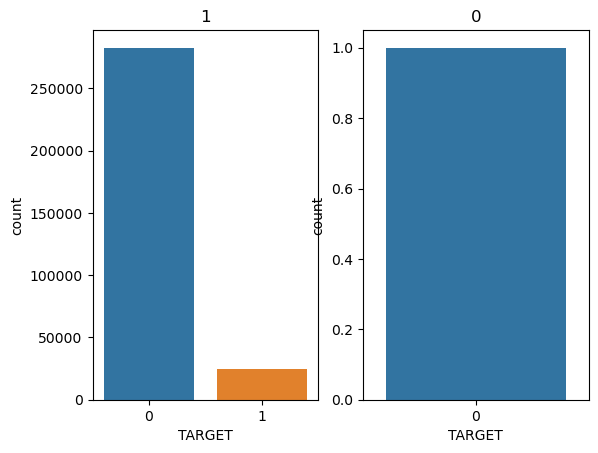

FLAG_EMP_PHONE
value 1
value 0


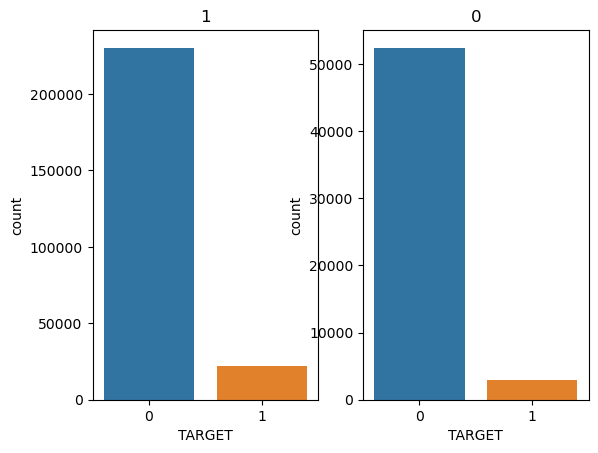

FLAG_WORK_PHONE
value 0
value 1


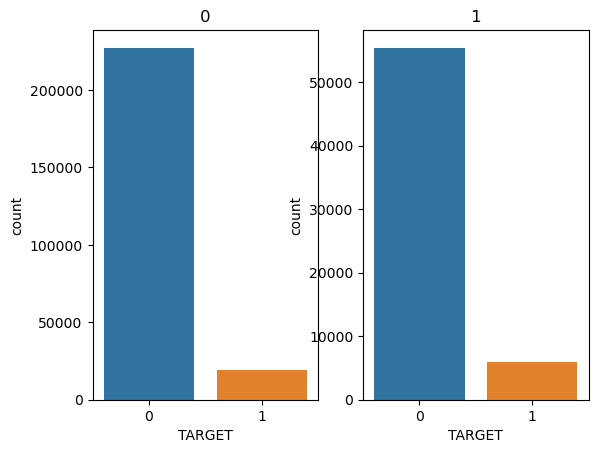

FLAG_CONT_MOBILE
value 1
value 0


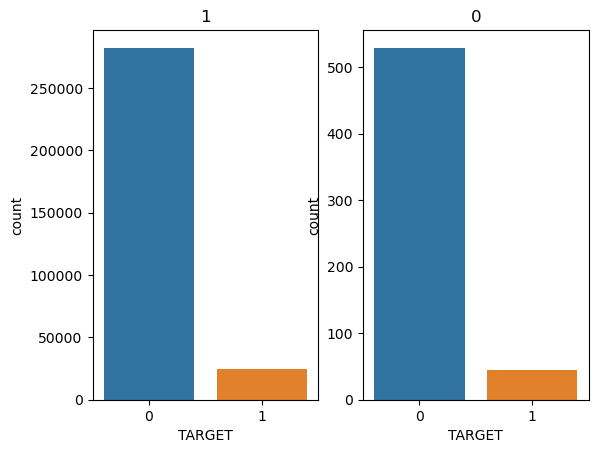

FLAG_PHONE
value 1
value 0


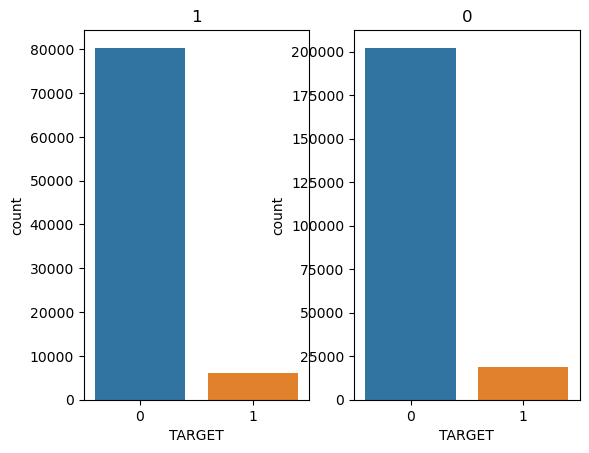

FLAG_EMAIL
value 0
value 1


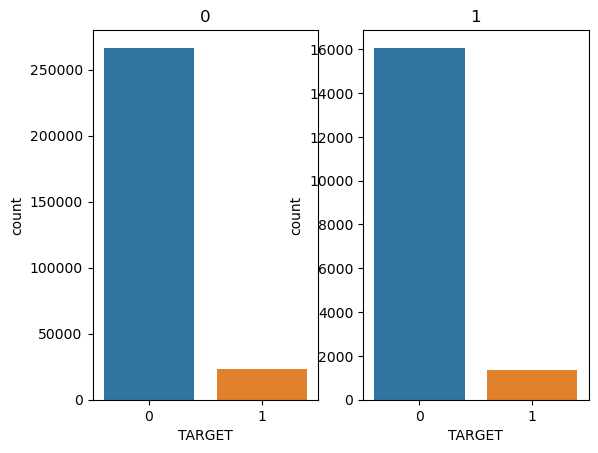

In [1476]:
check_column_effect_on_target(application_df,customer_mobile_email_columns)

In [1477]:
# since the distribution of TARGET these fields are not so distinct we can drop these columns
application_df.drop(customer_mobile_email_columns,axis=1,inplace=True)

In [1478]:
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [1479]:
# now lets check the falg documents columns if there is any major effect of the TARGET variable
customer_documents_columns=['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']

In [1480]:
check_null(application_df,customer_documents_columns)

FLAG_DOCUMENT_2     0
FLAG_DOCUMENT_3     0
FLAG_DOCUMENT_4     0
FLAG_DOCUMENT_5     0
FLAG_DOCUMENT_6     0
FLAG_DOCUMENT_7     0
FLAG_DOCUMENT_8     0
FLAG_DOCUMENT_9     0
FLAG_DOCUMENT_10    0
FLAG_DOCUMENT_11    0
FLAG_DOCUMENT_12    0
FLAG_DOCUMENT_13    0
FLAG_DOCUMENT_14    0
FLAG_DOCUMENT_15    0
FLAG_DOCUMENT_16    0
FLAG_DOCUMENT_17    0
FLAG_DOCUMENT_18    0
FLAG_DOCUMENT_19    0
FLAG_DOCUMENT_20    0
FLAG_DOCUMENT_21    0
dtype: int64

FLAG_DOCUMENT_2
value 0
value 1


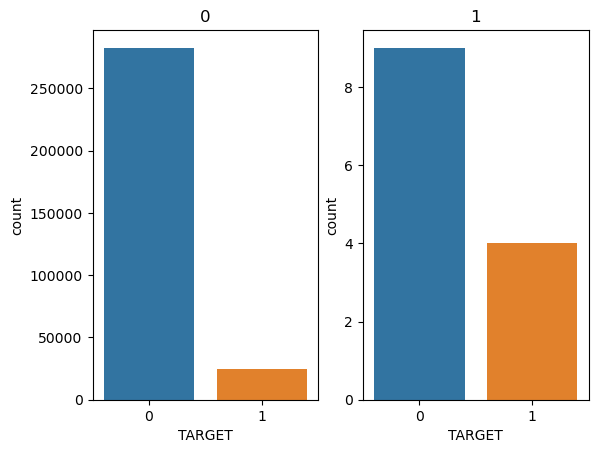

FLAG_DOCUMENT_3
value 1
value 0


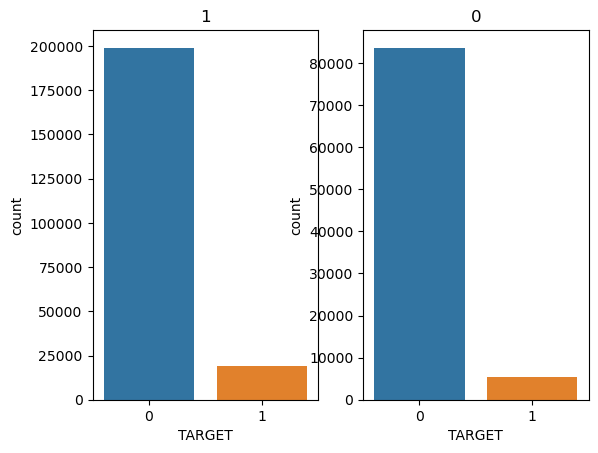

FLAG_DOCUMENT_4
value 0
value 1


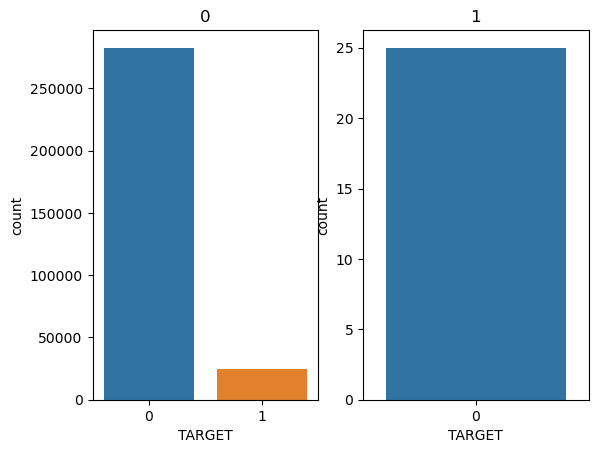

FLAG_DOCUMENT_5
value 0
value 1


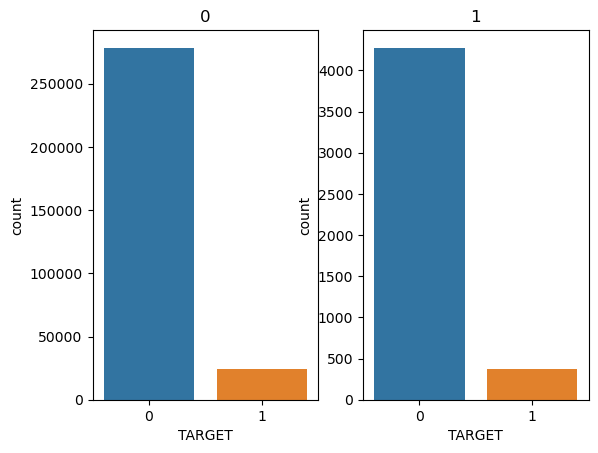

FLAG_DOCUMENT_6
value 0
value 1


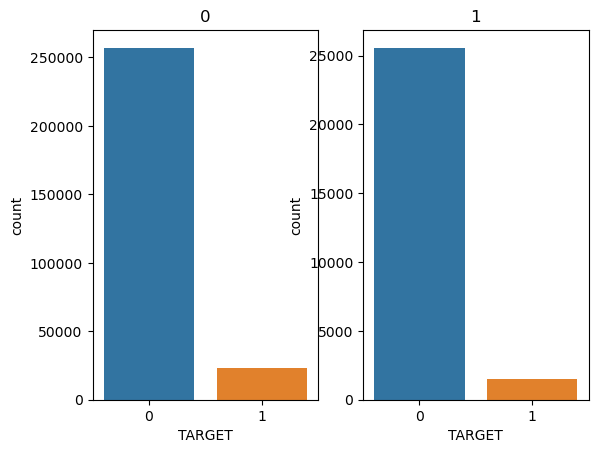

FLAG_DOCUMENT_7
value 0
value 1


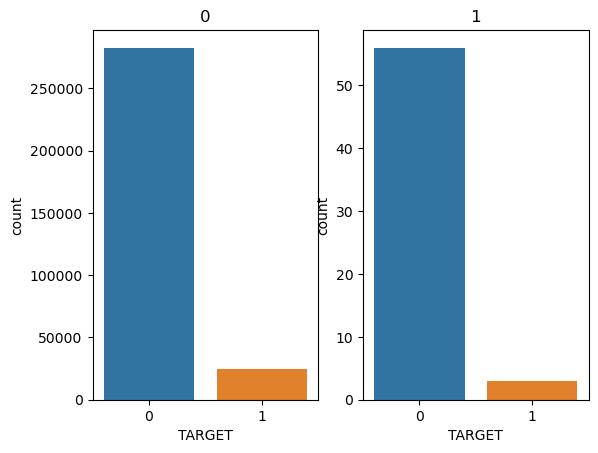

FLAG_DOCUMENT_8
value 0
value 1


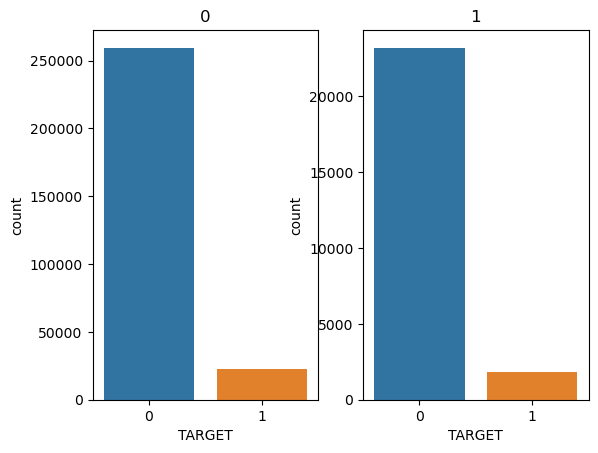

FLAG_DOCUMENT_9
value 0
value 1


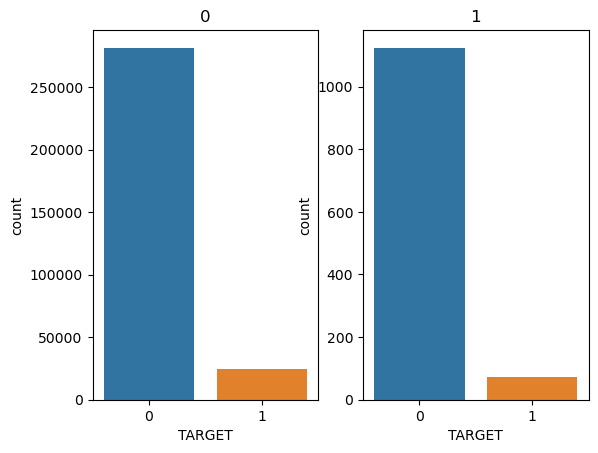

FLAG_DOCUMENT_10
value 0
value 1


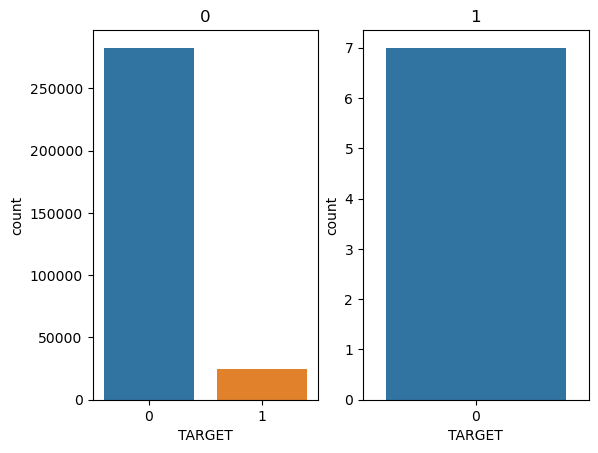

FLAG_DOCUMENT_11
value 0
value 1


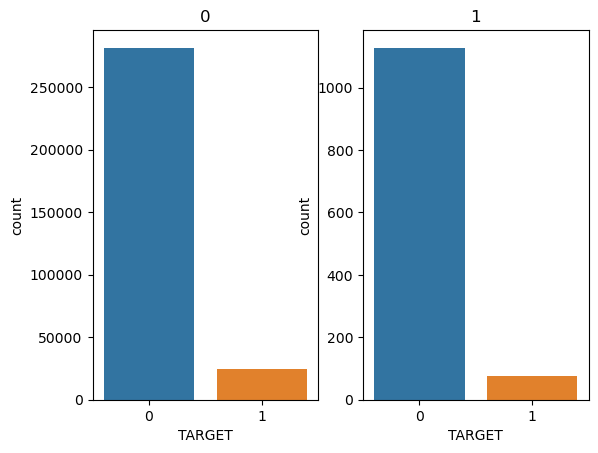

FLAG_DOCUMENT_12
value 0
value 1


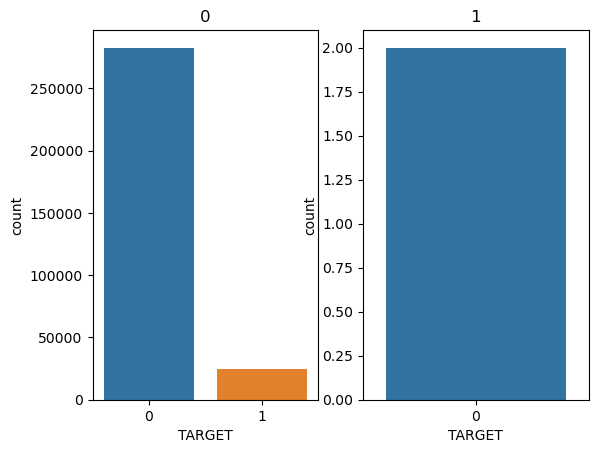

FLAG_DOCUMENT_13
value 0
value 1


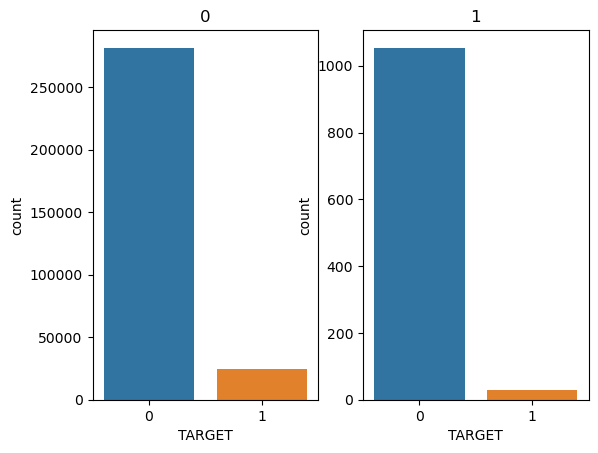

FLAG_DOCUMENT_14
value 0
value 1


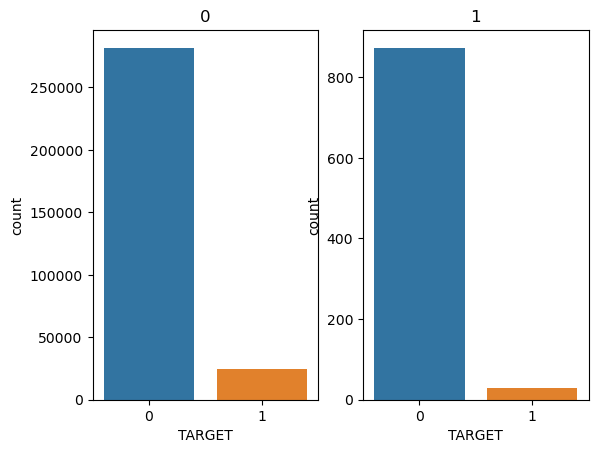

FLAG_DOCUMENT_15
value 0
value 1


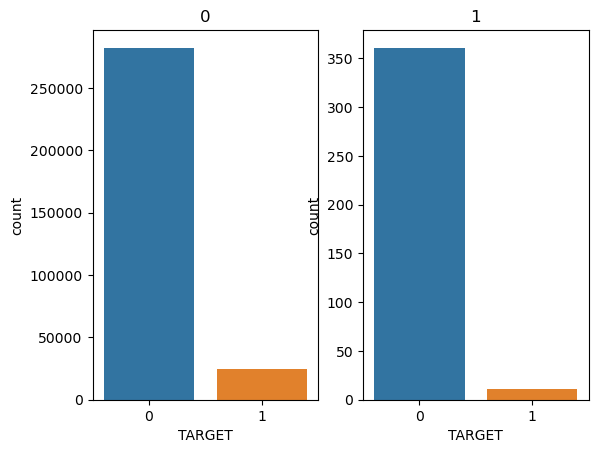

FLAG_DOCUMENT_16
value 0
value 1


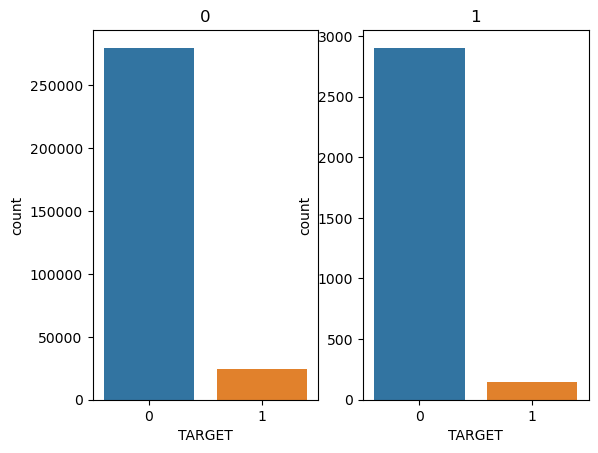

FLAG_DOCUMENT_17
value 0
value 1


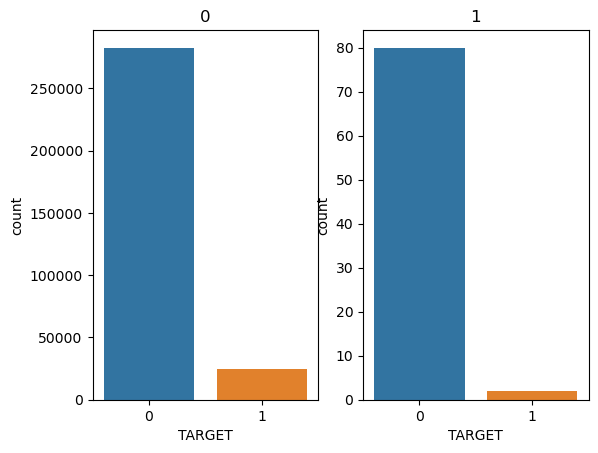

FLAG_DOCUMENT_18
value 0
value 1


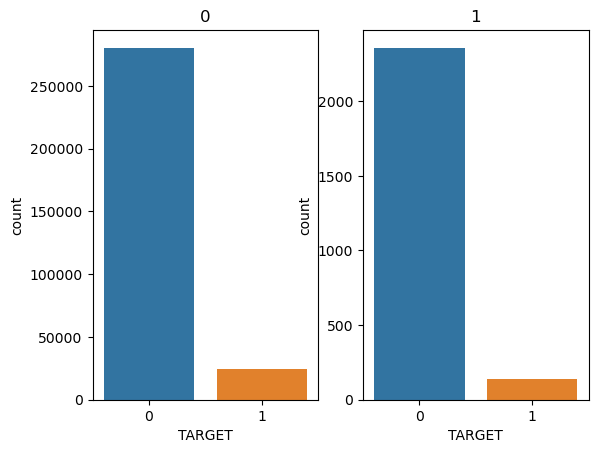

FLAG_DOCUMENT_19
value 0
value 1


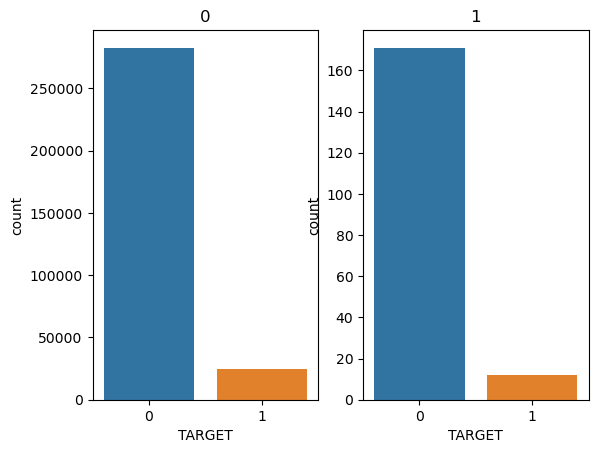

FLAG_DOCUMENT_20
value 0
value 1


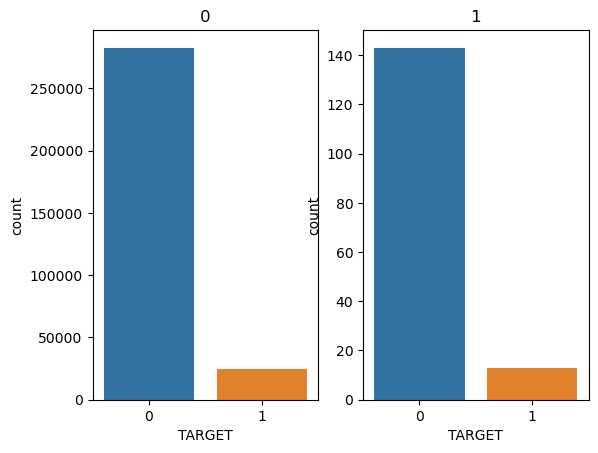

FLAG_DOCUMENT_21
value 0
value 1


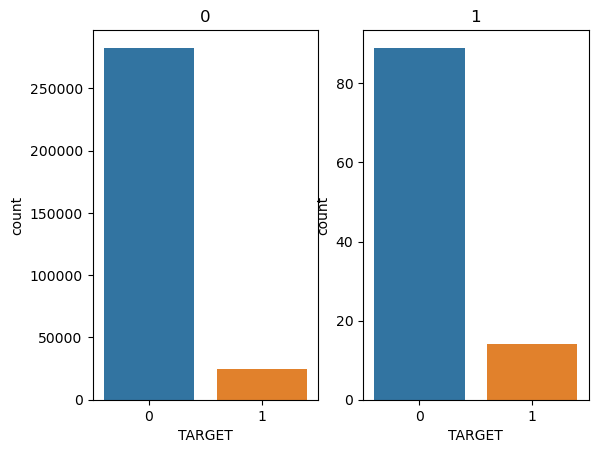

In [1481]:
check_column_effect_on_target(application_df,customer_documents_columns)

In [1482]:
# since the distribution of TARGET these fields are not so distinct we can drop these columns
application_df.drop(customer_documents_columns,axis=1,inplace=True)

In [1483]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0.0,0.0,0.0,-273.0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.0,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1484]:
application_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE'

In [1485]:
# check null value in remaining columns
application_df.isnull().sum().sort_values(ascending=0)*100/application_df.shape[0]

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
NAME_TYPE_SUITE                 0.420148
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
HOUR_APPR_PROCESS_START         0.000000
ORGANIZATION_TYPE               0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
REG_CITY_NOT_WORK_CITY          0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_REGION_NOT_W

In [1486]:
application_df[application_df['EXT_SOURCE_3'].isnull()].sample(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
3604,104209,1,Cash loans,F,N,Y,0,270000.0,1575000.0,43443.0,...,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
62485,172459,0,Cash loans,F,N,N,0,81000.0,203760.0,20281.5,...,0.0,0.0,0.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN
11118,112954,0,Cash loans,F,N,Y,1,202500.0,848745.0,37516.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
114495,232769,0,Cash loans,F,Y,Y,1,315000.0,1436850.0,46350.0,...,0.0,0.0,0.0,-3242.0,NaN,NaN,NaN,NaN,NaN,NaN
238532,376242,0,Cash loans,F,N,Y,1,121500.0,225000.0,22050.0,...,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
217066,351508,0,Cash loans,F,N,Y,2,76500.0,436032.0,28516.5,...,0.0,0.0,0.0,-2391.0,0.0,0.0,0.0,0.0,2.0,1.0
203692,336146,0,Cash loans,F,N,Y,0,135000.0,270000.0,19647.0,...,0.0,0.0,0.0,-669.0,NaN,NaN,NaN,NaN,NaN,NaN
14740,117201,1,Cash loans,F,N,Y,0,81000.0,405000.0,19008.0,...,0.0,0.0,0.0,-58.0,0.0,0.0,0.0,0.0,2.0,0.0
94249,209437,0,Cash loans,F,N,N,0,103500.0,675000.0,32472.0,...,0.0,0.0,0.0,-21.0,0.0,0.0,0.0,2.0,1.0,0.0
184497,313855,0,Cash loans,F,N,Y,0,148500.0,760500.0,22234.5,...,3.0,11.0,0.0,-551.0,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='EXT_SOURCE_3'>

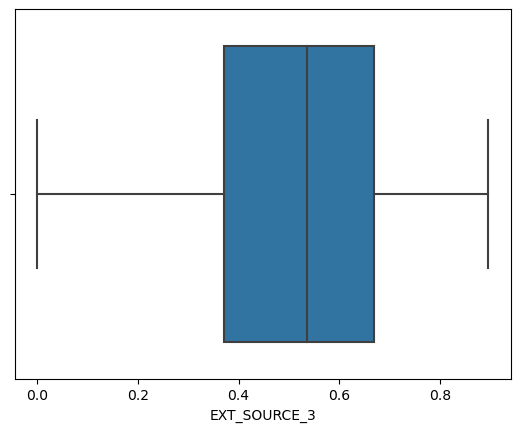

In [1487]:
# examining EXT_SOURCE_3 and EXT_SOURCE_2 columns
sns.boxplot(data=application_df,x='EXT_SOURCE_3') 

In [1488]:
application_df[application_df['EXT_SOURCE_2'].isnull()].sample(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
14714,117166,0,Cash loans,F,N,N,1,135000.0,688500.0,22338.0,...,0.0,3.0,0.0,-1824.0,NaN,NaN,NaN,NaN,NaN,NaN
15858,118504,0,Cash loans,M,Y,Y,0,148500.0,765261.0,30478.5,...,0.0,0.0,0.0,-1051.0,0.0,0.0,0.0,0.0,0.0,1.0
203310,335699,0,Cash loans,F,N,Y,0,67500.0,314100.0,13963.5,...,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
182603,311642,0,Cash loans,F,N,N,2,211500.0,719946.0,33489.0,...,0.0,0.0,0.0,-240.0,0.0,0.0,0.0,0.0,0.0,1.0
120581,239811,0,Cash loans,F,N,Y,0,72000.0,269550.0,14242.5,...,0.0,0.0,0.0,-292.0,0.0,0.0,0.0,0.0,0.0,0.0
264977,406839,0,Cash loans,F,N,Y,0,81000.0,170640.0,9922.5,...,0.0,0.0,0.0,-371.0,0.0,0.0,0.0,0.0,0.0,1.0
87155,201154,0,Cash loans,M,N,Y,1,180000.0,573628.5,22878.0,...,0.0,0.0,0.0,-1321.0,0.0,0.0,0.0,0.0,0.0,5.0
6992,108143,0,Cash loans,F,N,Y,1,135000.0,473760.0,50400.0,...,0.0,1.0,0.0,-244.0,0.0,0.0,0.0,0.0,0.0,0.0
241925,380116,0,Revolving loans,F,N,N,1,90000.0,247500.0,12375.0,...,0.0,0.0,0.0,-399.0,NaN,NaN,NaN,NaN,NaN,NaN
82664,195868,0,Cash loans,F,Y,Y,0,112500.0,263686.5,25816.5,...,0.0,3.0,0.0,-511.0,0.0,0.0,0.0,0.0,0.0,2.0


<AxesSubplot:xlabel='EXT_SOURCE_2'>

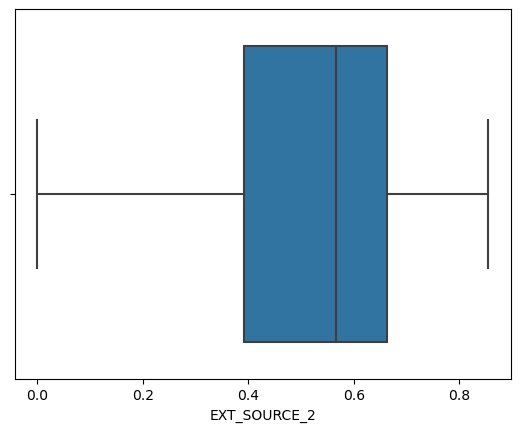

In [1489]:
sns.boxplot(data=application_df,x='EXT_SOURCE_2') 

In [1490]:
# since these missing values are completely missing at randon and no of null percent is less than 40% we will impute these datapoints
# we will impute these missing values with mean value of reespective columns since there are no outlier present



In [1491]:
EXT_SOURCE_2_mean=application_df['EXT_SOURCE_2'].mean()
EXT_SOURCE_3_mean=application_df['EXT_SOURCE_3'].mean()

In [1492]:
application_df['EXT_SOURCE_2'].fillna(EXT_SOURCE_2_mean,inplace=True)


In [1493]:
application_df['EXT_SOURCE_3'].fillna(EXT_SOURCE_3_mean,inplace=True)

In [1494]:
application_df.isnull().sum().sort_values(ascending=0)

OCCUPATION_TYPE                96391
AMT_REQ_CREDIT_BUREAU_YEAR     41519
AMT_REQ_CREDIT_BUREAU_QRT      41519
AMT_REQ_CREDIT_BUREAU_MON      41519
AMT_REQ_CREDIT_BUREAU_WEEK     41519
AMT_REQ_CREDIT_BUREAU_DAY      41519
AMT_REQ_CREDIT_BUREAU_HOUR     41519
NAME_TYPE_SUITE                 1292
OBS_30_CNT_SOCIAL_CIRCLE        1021
OBS_60_CNT_SOCIAL_CIRCLE        1021
DEF_30_CNT_SOCIAL_CIRCLE        1021
DEF_60_CNT_SOCIAL_CIRCLE        1021
AMT_GOODS_PRICE                  278
AMT_ANNUITY                       12
CNT_FAM_MEMBERS                    2
DAYS_LAST_PHONE_CHANGE             1
HOUR_APPR_PROCESS_START            0
EXT_SOURCE_3                       0
EXT_SOURCE_2                       0
ORGANIZATION_TYPE                  0
LIVE_CITY_NOT_WORK_CITY            0
REG_CITY_NOT_WORK_CITY             0
REG_CITY_NOT_LIVE_CITY             0
LIVE_REGION_NOT_WORK_REGION        0
REG_REGION_NOT_WORK_REGION         0
REG_REGION_NOT_LIVE_REGION         0
SK_ID_CURR                         0
W

In [1495]:
application_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE'

In [1496]:
# Function to check outlierd
def check_outliers(df,columns):

    for col in columns:

        df[col].value_counts()
        sns.boxplot(data=df,x=col)
        plt.show()

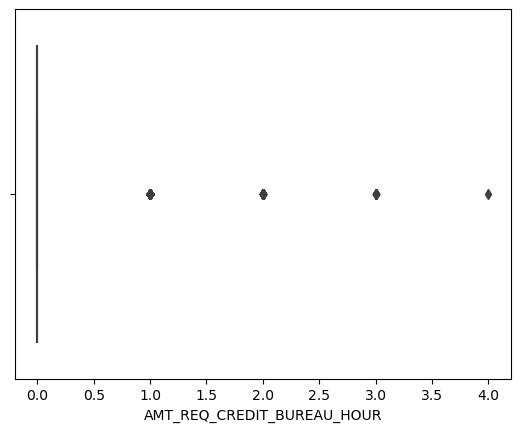

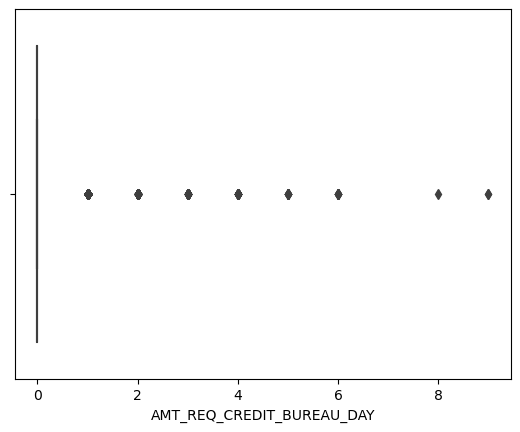

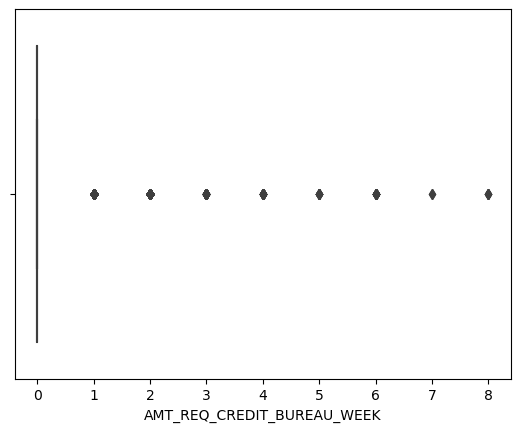

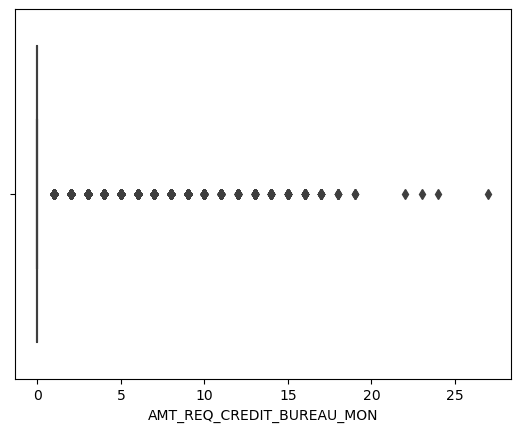

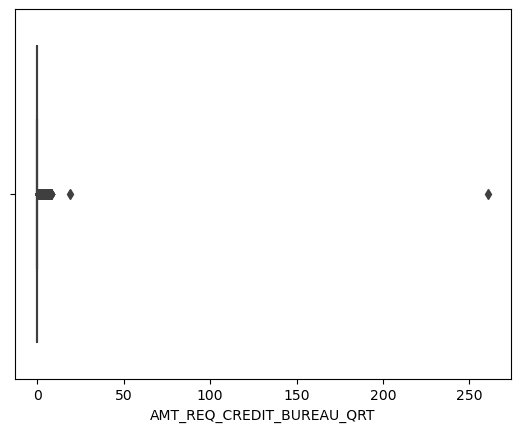

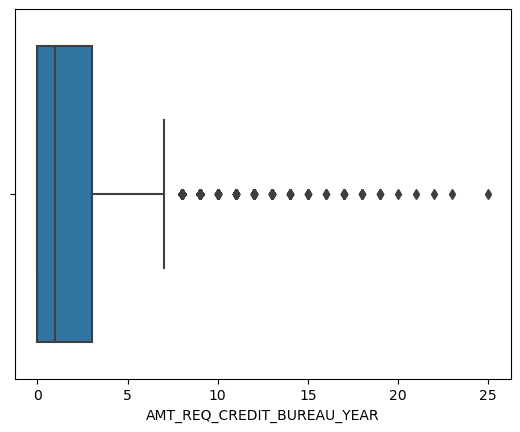

In [1497]:
 # run outlier function on all number_of_enquiries columns
number_of_enquiries_columns=['AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR']

check_outliers(application_df,number_of_enquiries_columns)

In [1498]:
# since all of them have outliers we will replace the missing values of respective columns with their respective median value
AMT_REQ_CREDIT_BUREAU_HOUR_median=application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].median()
AMT_REQ_CREDIT_BUREAU_DAY_median=application_df['AMT_REQ_CREDIT_BUREAU_DAY'].median()
AMT_REQ_CREDIT_BUREAU_WEEK_median=application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].median()
AMT_REQ_CREDIT_BUREAU_MON_median=application_df['AMT_REQ_CREDIT_BUREAU_MON'].median()
AMT_REQ_CREDIT_BUREAU_QRT_median=application_df['AMT_REQ_CREDIT_BUREAU_QRT'].median()
AMT_REQ_CREDIT_BUREAU_YEAR_median=application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].median()

In [1499]:
application_df['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(AMT_REQ_CREDIT_BUREAU_HOUR_median,inplace=True)
application_df['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(AMT_REQ_CREDIT_BUREAU_DAY_median,inplace=True)
application_df['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(AMT_REQ_CREDIT_BUREAU_WEEK_median,inplace=True)
application_df['AMT_REQ_CREDIT_BUREAU_MON'].fillna(AMT_REQ_CREDIT_BUREAU_MON_median,inplace=True)
application_df['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(AMT_REQ_CREDIT_BUREAU_QRT_median,inplace=True)
application_df['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(AMT_REQ_CREDIT_BUREAU_YEAR_median,inplace=True)

In [1500]:
application_df.isnull().sum().sort_values(ascending=False)

OCCUPATION_TYPE                96391
NAME_TYPE_SUITE                 1292
DEF_30_CNT_SOCIAL_CIRCLE        1021
DEF_60_CNT_SOCIAL_CIRCLE        1021
OBS_60_CNT_SOCIAL_CIRCLE        1021
OBS_30_CNT_SOCIAL_CIRCLE        1021
AMT_GOODS_PRICE                  278
AMT_ANNUITY                       12
CNT_FAM_MEMBERS                    2
DAYS_LAST_PHONE_CHANGE             1
ORGANIZATION_TYPE                  0
REG_REGION_NOT_WORK_REGION         0
LIVE_REGION_NOT_WORK_REGION        0
REG_CITY_NOT_LIVE_CITY             0
REG_CITY_NOT_WORK_CITY             0
LIVE_CITY_NOT_WORK_CITY            0
SK_ID_CURR                         0
EXT_SOURCE_2                       0
EXT_SOURCE_3                       0
HOUR_APPR_PROCESS_START            0
AMT_REQ_CREDIT_BUREAU_HOUR         0
AMT_REQ_CREDIT_BUREAU_DAY          0
AMT_REQ_CREDIT_BUREAU_WEEK         0
AMT_REQ_CREDIT_BUREAU_MON          0
AMT_REQ_CREDIT_BUREAU_QRT          0
REG_REGION_NOT_LIVE_REGION         0
REGION_RATING_CLIENT               0
W

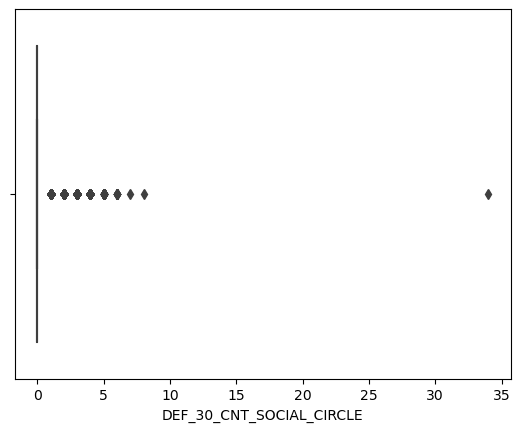

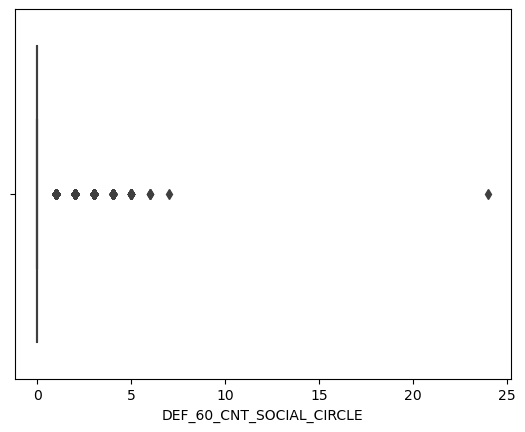

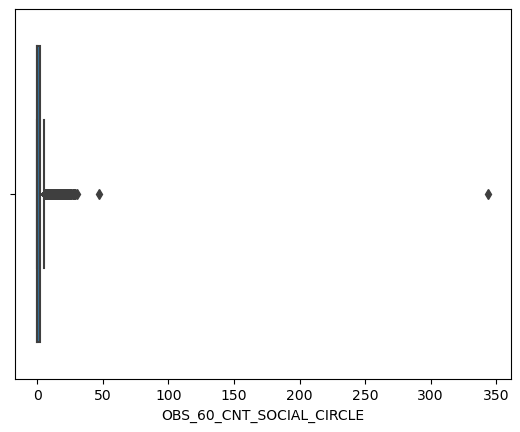

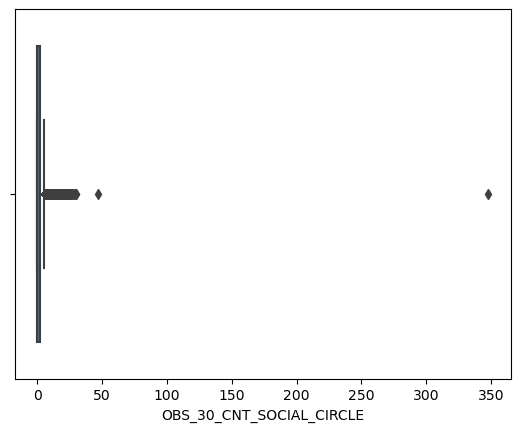

In [1501]:
# checking missing values in customers social surroundings
social_surroundings_columns=['DEF_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE']
check_outliers(application_df,social_surroundings_columns)

In [1502]:
# since all of them have outliers we will replace the missing values of respective columns with their respective median value
DEF_30_CNT_SOCIAL_CIRCLE_median=application_df['DEF_30_CNT_SOCIAL_CIRCLE'].median()
DEF_60_CNT_SOCIAL_CIRCLE_median=application_df['DEF_60_CNT_SOCIAL_CIRCLE'].median()
OBS_60_CNT_SOCIAL_CIRCLE_median=application_df['OBS_60_CNT_SOCIAL_CIRCLE'].median()
OBS_30_CNT_SOCIAL_CIRCLE_median=application_df['OBS_30_CNT_SOCIAL_CIRCLE'].median()

In [1503]:
application_df['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(DEF_30_CNT_SOCIAL_CIRCLE_median,inplace=True)
application_df['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(DEF_60_CNT_SOCIAL_CIRCLE_median,inplace=True)
application_df['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(OBS_60_CNT_SOCIAL_CIRCLE_median,inplace=True)
application_df['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(OBS_30_CNT_SOCIAL_CIRCLE_median,inplace=True)

In [1504]:
application_df.isnull().sum().sort_values(ascending=False)*100/application_df.shape[0]

OCCUPATION_TYPE                31.345545
NAME_TYPE_SUITE                 0.420148
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
SK_ID_CURR                      0.000000
EXT_SOURCE_3                    0.000000
REG_REGION_NOT_WORK_REGION      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
REG_CITY_NOT_WORK_CITY          0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
ORGANIZATION_TYPE               0.000000
EXT_SOURCE_2                    0.000000
DEF_30_CNT_SOCIAL_CIRCLE        0.000000
OBS_30_CNT_SOCIAL_CIRCLE        0.000000
HOUR_APPR_PROCESS_START         0.000000
OBS_60_CNT_SOCIAL_CIRCLE        0.000000
DEF_60_CNT_SOCIAL_CIRCLE        0.000000
AMT_REQ_CREDIT_BUREAU_HOUR      0.000000
AMT_REQ_CREDIT_BUREAU_DAY       0.000000
AMT_REQ_CREDIT_BUREAU_WEEK      0.000000
AMT_REQ_CREDIT_BUREAU_MON       0.000000
AMT_REQ_CREDIT_B

In [1505]:
application_df['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [1506]:
# filter row where data in occupation type is null
df_occupation_null=application_df[application_df['OCCUPATION_TYPE'].isnull()]

In [1507]:
df_occupation_null

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,...,0.0,0.0,0.0,-2396.0,0.0,0.0,0.0,0.0,0.0,2.0
23,100027,0,Cash loans,F,N,Y,0,83250.000,239850.0,23850.0,...,0.0,0.0,0.0,-795.0,0.0,0.0,0.0,0.0,0.0,3.0
28,100033,0,Cash loans,M,Y,Y,0,270000.000,790830.0,57676.5,...,0.0,0.0,0.0,-849.0,0.0,0.0,0.0,1.0,0.0,1.0
30,100035,0,Cash loans,F,N,Y,0,292500.000,665892.0,24592.5,...,0.0,0.0,0.0,-1634.0,0.0,0.0,0.0,1.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307486,456230,0,Cash loans,F,Y,Y,1,292500.000,355536.0,18283.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
307487,456231,0,Cash loans,M,N,Y,0,117000.000,1071909.0,31473.0,...,0.0,0.0,0.0,-846.0,0.0,0.0,0.0,0.0,1.0,8.0
307500,456244,0,Cash loans,F,N,Y,0,261000.000,1303812.0,35982.0,...,0.0,0.0,0.0,-1459.0,0.0,0.0,0.0,1.0,0.0,5.0
307505,456249,0,Cash loans,F,N,Y,0,112500.000,225000.0,22050.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0


In [1508]:
df_occupation_null['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         88800
Revolving loans     7591
Name: NAME_CONTRACT_TYPE, dtype: int64

In [1509]:
df_occupation_null['TARGET'].value_counts()

0    90113
1     6278
Name: TARGET, dtype: int64

In [1510]:
df_occupation_null['AMT_INCOME_TOTAL'].value_counts()

135000.0    10365
112500.0     9753
90000.0      7946
157500.0     7535
180000.0     6444
            ...  
32220.0         1
193050.0        1
77332.5         1
110475.0        1
546250.5        1
Name: AMT_INCOME_TOTAL, Length: 1054, dtype: int64

In [1511]:
df_occupation_null['CODE_GENDER'].value_counts()

F      73166
M      23223
XNA        2
Name: CODE_GENDER, dtype: int64

In [1512]:
(df_occupation_null.shape[0]/application_df.shape[0])*100

31.345545362604916

In [1513]:
# Since the missing percent is ~31% we cannot remove the entries.
# As the other values where occupation null are spread equally it shows that the missing value in occupation is completely at rondom.
# We cannot replace the value with the mode of the column since the varitions in other column does not specify a particular type.
# hence we will keep the column as it is and continue

In [1514]:
# since the percentage of missing values in other remaing columns is very less we will delete the null rows
application_df.dropna(subset=['NAME_TYPE_SUITE','AMT_GOODS_PRICE','AMT_ANNUITY','CNT_FAM_MEMBERS','DAYS_LAST_PHONE_CHANGE'],inplace=True)

In [1515]:
application_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0.0,0.0,0.0,-273.0,0.0,0.0,0.0,0.0,0.0,1.0
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0.0,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.0,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1516]:
application_df.dtypes

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int64
DAYS_EMPLOYED                    int64
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
WEEKDAY_APPR_PROCESS_STAR

In [1517]:
# dividing the data in numeric and categorical sub datasets
application_df_numeric = application_df.select_dtypes(include=[np.number])
application_df_categorical = application_df.select_dtypes(exclude=[np.number])

In [1518]:
application_df_numeric

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,...,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,0.0,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0.0,0.0,0.0,-273.0,0.0,0.0,0.0,0.0,0.0,1.0
307507,456252,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,0.0,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0.0,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0


In [1519]:
application_df_categorical

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion
...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services
307507,Cash loans,F,N,Y,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,NaN,MONDAY,XNA
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1


In [1520]:
# looking out for any non related entries in every column
for column in application_df_categorical.columns:
    print(column)
    print(application_df[column].value_counts())
    print("************************************")

NAME_CONTRACT_TYPE
Cash loans         277212
Revolving loans     28994
Name: NAME_CONTRACT_TYPE, dtype: int64
************************************
CODE_GENDER
F      201635
M      104567
XNA         4
Name: CODE_GENDER, dtype: int64
************************************
FLAG_OWN_CAR
N    202037
Y    104169
Name: FLAG_OWN_CAR, dtype: int64
************************************
FLAG_OWN_REALTY
Y    212842
N     93364
Name: FLAG_OWN_REALTY, dtype: int64
************************************
NAME_TYPE_SUITE
Unaccompanied      248514
Family              40148
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
************************************
NAME_INCOME_TYPE
Working                 158125
Commercial associate     71254
Pensioner                55164
State servant            21609
Unemployed                  22
Student                     17
Businessman                 10
Mater

In [1521]:
# as we can see from the above column ORGANIZATION_TYPE contain XNA value.
df_orgainzation_xna=application_df[application_df["ORGANIZATION_TYPE"]=='XNA']

In [1522]:
# checking the distibution of other column values for organinzation type= XNA
df_orgainzation_xna['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         51835
Revolving loans     3343
Name: NAME_CONTRACT_TYPE, dtype: int64

In [1523]:
df_orgainzation_xna['TARGET'].value_counts()

0    52197
1     2981
Name: TARGET, dtype: int64

In [1524]:
df_orgainzation_xna['AMT_INCOME_TOTAL'].value_counts()

112500.0    5838
135000.0    5527
90000.0     5152
157500.0    3814
67500.0     3522
            ... 
36436.5        1
56740.5        1
96525.0        1
70987.5        1
182700.0       1
Name: AMT_INCOME_TOTAL, Length: 737, dtype: int64

In [1525]:
df_orgainzation_xna['CODE_GENDER'].value_counts()

F    45122
M    10056
Name: CODE_GENDER, dtype: int64

In [1526]:
(df_orgainzation_xna.shape[0]/application_df.shape[0])*100

18.019895103296474

In [1527]:
# getting index of xna entries in organization_type column
xna_index=application_df[application_df["ORGANIZATION_TYPE"]=='XNA'].index

In [1528]:
# as we see these missing values are completely at random aslo since these values are only ~18% of the entire rows we can delete them.
application_df.drop(xna_index,inplace=True)

In [1529]:
application_df["ORGANIZATION_TYPE"].value_counts()

Business Entity Type 3    67683
Self-employed             38256
Other                     16621
Medicine                  11144
Business Entity Type 2    10509
Government                10356
School                     8856
Trade: type 7              7798
Kindergarten               6853
Construction               6692
Business Entity Type 1     5962
Transport: type 4          5374
Trade: type 3              3470
Industry: type 9           3345
Industry: type 3           3269
Security                   3228
Housing                    2941
Industry: type 11          2698
Military                   2621
Bank                       2484
Agriculture                2446
Police                     2331
Transport: type 2          2191
Postal                     2152
Security Ministries        1965
Trade: type 2              1887
Restaurant                 1800
Services                   1568
University                 1322
Industry: type 7           1301
Transport: type 3          1181
Industry

In [1530]:
# getting index of xna entries in organization_type column
gender_xna_index=application_df[application_df["CODE_GENDER"]=='XNA'].index

In [1531]:
# as we see these missing values are only 4 of the entire rows so we can delete them.

application_df.drop(gender_xna_index,inplace=True)

In [1532]:
# checking shape after deletion
application_df.shape[0]

251024

In [1533]:
application_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE'

In [1534]:
#examining days columns the dataset
application_df[['DAYS_BIRTH','DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE']]

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE
0,-9461,-637,-3648.0,-2120,-1134.0
1,-16765,-1188,-1186.0,-291,-828.0
2,-19046,-225,-4260.0,-2531,-815.0
3,-19005,-3039,-9833.0,-2437,-617.0
4,-19932,-3038,-4311.0,-3458,-1106.0
...,...,...,...,...,...
307504,-16705,-7258,-9798.0,-259,0.0
307506,-9327,-236,-8456.0,-1982,-273.0
307508,-14966,-7921,-6737.0,-5150,-1909.0
307509,-11961,-4786,-2562.0,-931,-322.0


In [1535]:
# check if any value greater than zero in days columns

print(application_df[application_df['DAYS_BIRTH']>0])
print(application_df[application_df['DAYS_EMPLOYED']>0])
print(application_df[application_df['DAYS_REGISTRATION']>0])
print(application_df[application_df['DAYS_ID_PUBLISH']>0])
print(application_df[application_df['DAYS_LAST_PHONE_CHANGE']>0])

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, ORGANIZATION_TYPE, EXT_SOURCE_2, EXT_SOURCE_3, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_

In [1536]:
# converting no of days after birth to years
application_df['AGE'] = (application_df['DAYS_BIRTH']//365)*(-1)

In [1537]:
application_df_numeric.columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

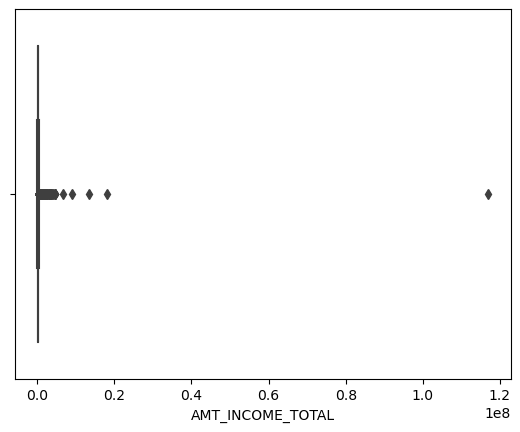

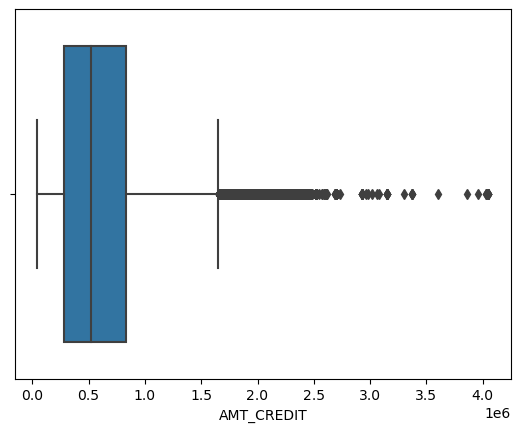

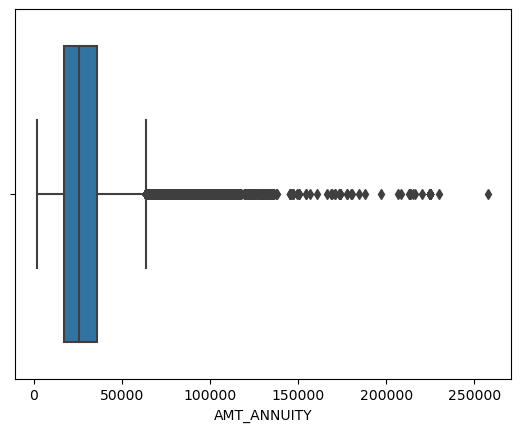

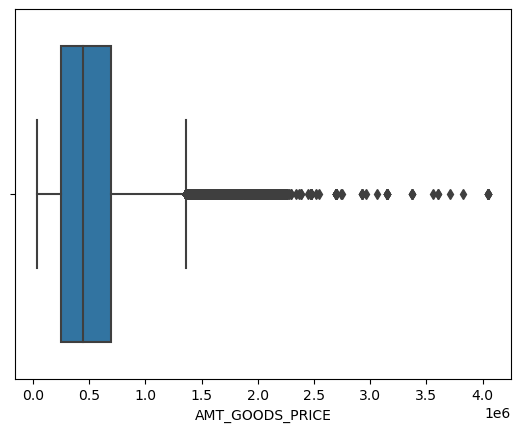

In [1538]:
# checking outlier in the amount columns
check_outliers(application_df,['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE'])

In [1539]:
# gives upper and lowe r limit for detecting outliers
def upper_lower_limit(df,column):
    per25=df[column].quantile(0.25)
    per75=df[column].quantile(0.75)
    upper_limit=per75+1.5*(per75-per25)
    lower_limit=per75-1.5*(per75-per25)
    return upper_limit,lower_limit


In [1540]:
#removing outlier in the amount columns
for column in ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE']:
    u,l=upper_lower_limit(application_df,column)
    application_df.drop(application_df[(application_df[column]>u) | (application_df[column]<l)].index,inplace=True)

In [1541]:
# checking shape after deletion
application_df.shape

(217977, 48)

In [1543]:
# creating bins in AMT_INCOME_TOTAL, AMT_CREDIT,AGE

In [1544]:
application_df['AGE'].describe()

count    217977.000000
mean         40.786482
std          10.063969
min          21.000000
25%          33.000000
50%          40.000000
75%          48.000000
max          70.000000
Name: AGE, dtype: float64

In [1545]:
# function for binning  age data into three groups
def group_age(x):
    if (x < 40):
        return 'Young'
    elif (x >= 40 and x < 60):
        return 'Middle-Old'
    else:
        return 'Elderly'

In [1546]:
#Creating new column AGE_GROUP
application_df['AGE_GROUP'] = application_df['AGE'].apply(group_age)


In [1547]:
application_df['AMT_INCOME_TOTAL'].describe()

count    217977.000000
mean     162421.266055
std       64952.534275
min       63000.000000
25%      112500.000000
50%      157500.000000
75%      202500.000000
max      360000.000000
Name: AMT_INCOME_TOTAL, dtype: float64

In [1548]:
# function for binning  AMT_INCOME data into four groups
def group_income(x):
    if (x < 112500):
        return 'Low'
    elif (x >= 112500 and x < 157500):
        return 'Medium'
    elif (x >= 157500 and x < 202500):
        return 'Medium-High'
    else:
        return 'High'
    

In [1549]:
#Creating new column INCOME_GROUP
application_df['INCOME_GROUP'] = application_df['AMT_INCOME_TOTAL'].apply(group_income)


In [1550]:
round(application_df['AMT_CREDIT'].describe(),2)

count     217977.00
mean      560532.07
std       315918.14
min        71316.00
25%       284400.00
50%       508495.50
75%       778446.00
max      1609272.00
Name: AMT_CREDIT, dtype: float64

In [1551]:
# function for binning  AMT_CREDIT data into three groups
def group_credit(x):
    if (x < 521280):
        return 'Low'
    elif (x >= 521280 and x < 781920):
        return 'Medium'
    else:
        return 'High'
    

In [1552]:
#Creating new column CREDIT_GROUP
application_df['CREDIT_GROUP'] = application_df['AMT_CREDIT'].apply(group_credit)


In [1553]:
# splitting  data into numeric and categorical data to get numeric and categorical column names
application_df_numeric = application_df.select_dtypes(include=[np.number])
application_df_categorical = application_df.select_dtypes(exclude=[np.number])

# Univariate Analysis

# 1. Ordered Categorical Variable

<AxesSubplot:xlabel='TARGET', ylabel='count'>

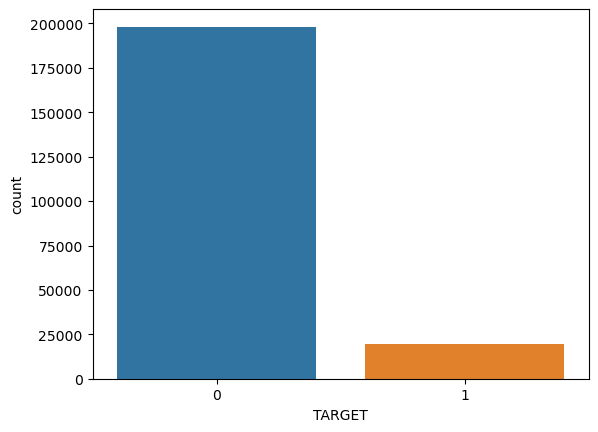

In [1554]:
# Checkong distribution of target data
sns.countplot(data=application_df,x='TARGET')

In [ ]:
# from above we can see that the data of customer having payment problems are less than the  customer not having payment problems

In [1555]:
#dividing application data into taget 0 and target 1
application_df_target0=application_df[application_df['TARGET']==0]
application_df_target1=application_df[application_df['TARGET']==1]

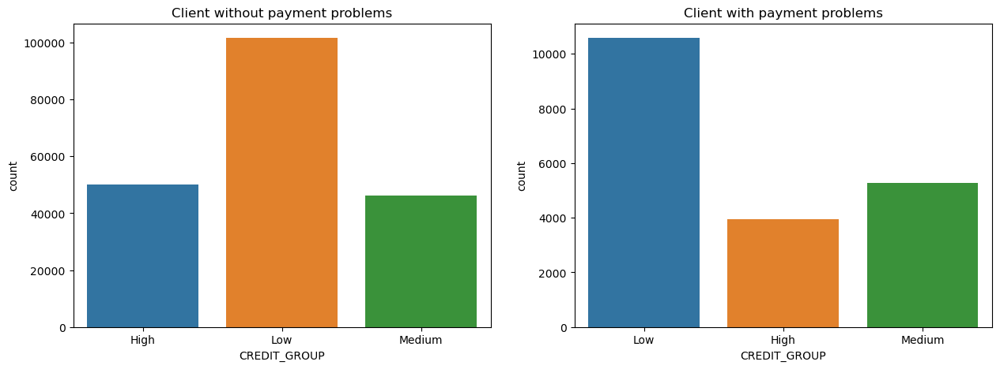

In [1556]:
# checking distribution of credit groups for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=application_df_target0,x='CREDIT_GROUP')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=application_df_target1,x='CREDIT_GROUP')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from above we can see that people in low credit gruops aree the once which have most difficulties in payment

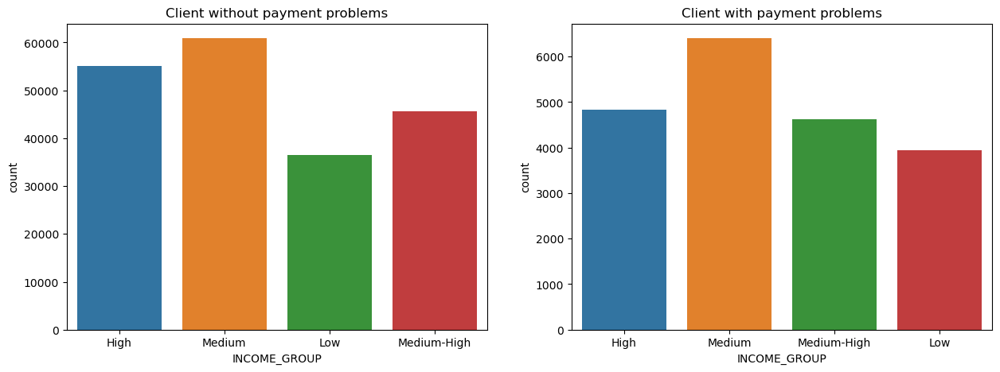

In [1557]:
# checking distribution of income groups for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=application_df_target0,x='INCOME_GROUP')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=application_df_target1,x='INCOME_GROUP')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from above we can see that people in medium payment gruops are the once which have most difficulties in payment

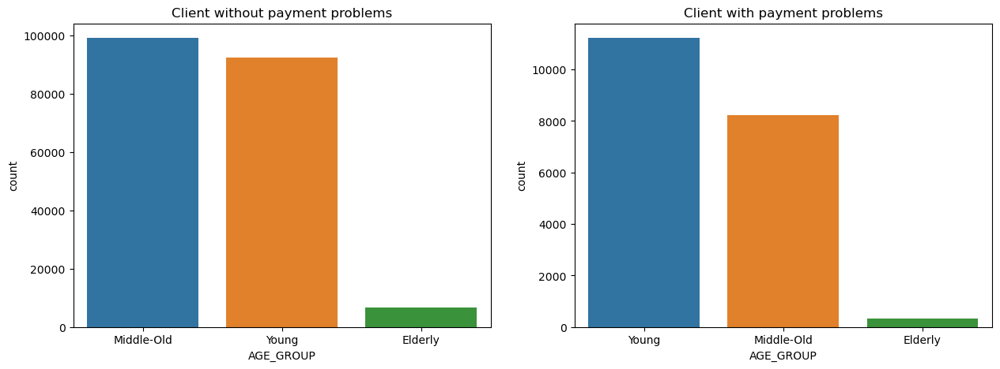

In [1558]:
# checking distribution of age groups for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=application_df_target0,x='AGE_GROUP')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=application_df_target1,x='AGE_GROUP')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from above we can see that people in young age group are the once which have most difficulties in payment

# 2. Un-ordered Categorical Variable

In [1559]:
application_df_categorical
#application_df_categorical['CODE_GENDER'].value_counts()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,AGE_GROUP,INCOME_GROUP,CREDIT_GROUP
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,Young,High,Low
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,Middle-Old,High,High
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,Middle-Old,Medium,Low
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,Middle-Old,Medium,Low
5,Cash loans,M,N,Y,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Other,Middle-Old,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307504,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Separated,House / apartment,Sales staff,WEDNESDAY,Self-employed,Middle-Old,Medium,Low
307506,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,Sales staff,THURSDAY,Services,Young,Medium-High,Low
307508,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Separated,House / apartment,Managers,THURSDAY,School,Middle-Old,Medium,Medium
307509,Cash loans,F,N,Y,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 1,Young,Medium-High,Low


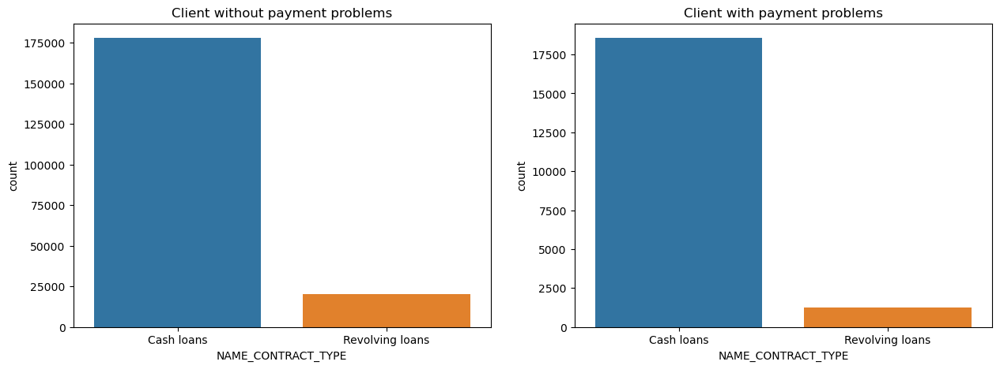

In [1560]:
# checking distribution of contract type for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=application_df_target0,x='NAME_CONTRACT_TYPE')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=application_df_target1,x='NAME_CONTRACT_TYPE')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from above we can see that people who have taken cash loans are the once which have most difficulties in payment

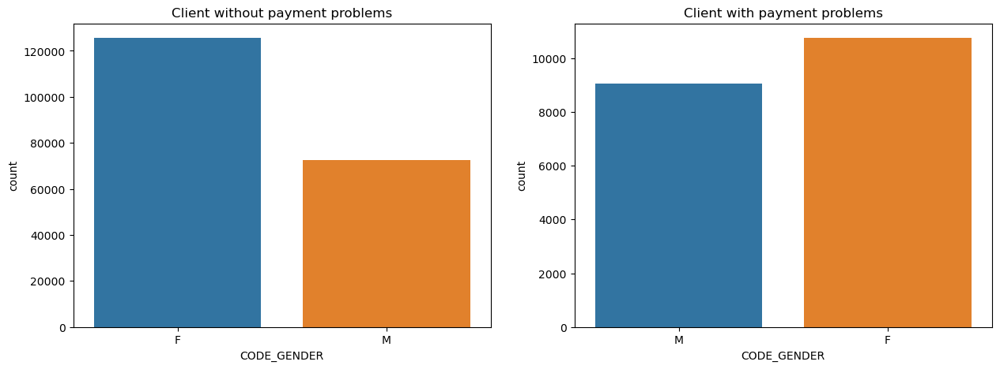

In [1561]:
# checking distribution of gender for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=application_df_target0,x='CODE_GENDER')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=application_df_target1,x='CODE_GENDER')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from above we can see that female clients have most difficulties in payment

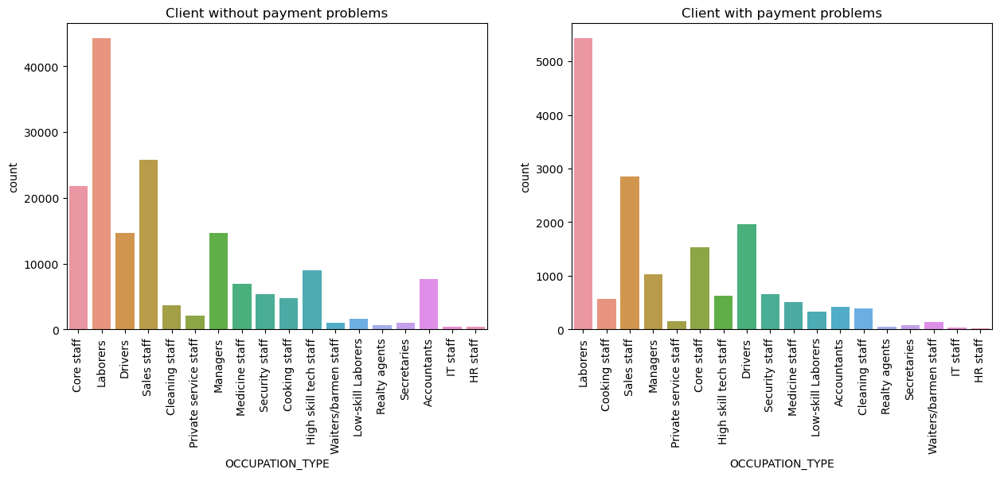

In [1669]:
# checking distribution of OCCUPATION_TYPE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='OCCUPATION_TYPE')
plt.title('Client without payment problems')
axis.set(xlabel='OCCUPATION_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='OCCUPATION_TYPE')
plt.title('Client with payment problems')
axis.set(xlabel='OCCUPATION_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that clients having occupation type as laborers have most difficulties in payment

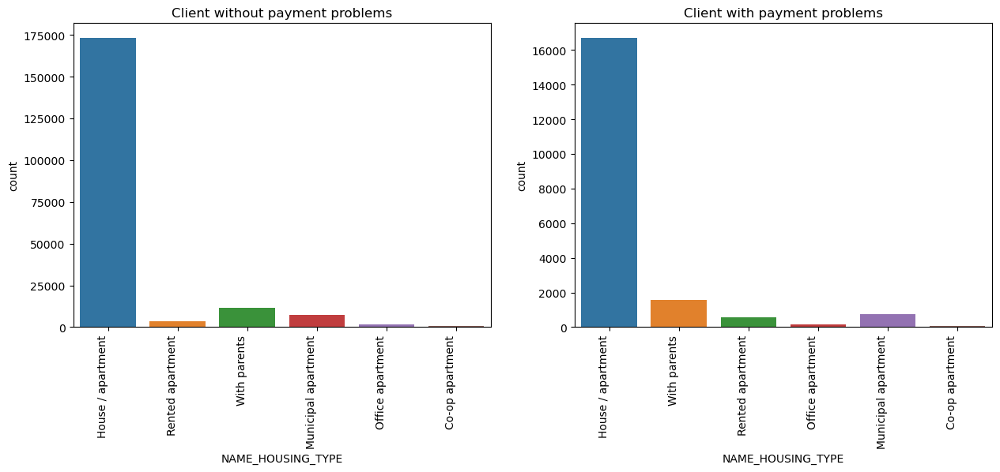

In [1563]:
# checking distribution of NAME_HOUSING_TYPE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='NAME_HOUSING_TYPE')
plt.title('Client without payment problems')
axis.set(xlabel='NAME_HOUSING_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='NAME_HOUSING_TYPE')
plt.title('Client with payment problems')
axis.set(xlabel='NAME_HOUSING_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that clients having own house/apartment have most difficulties in payment

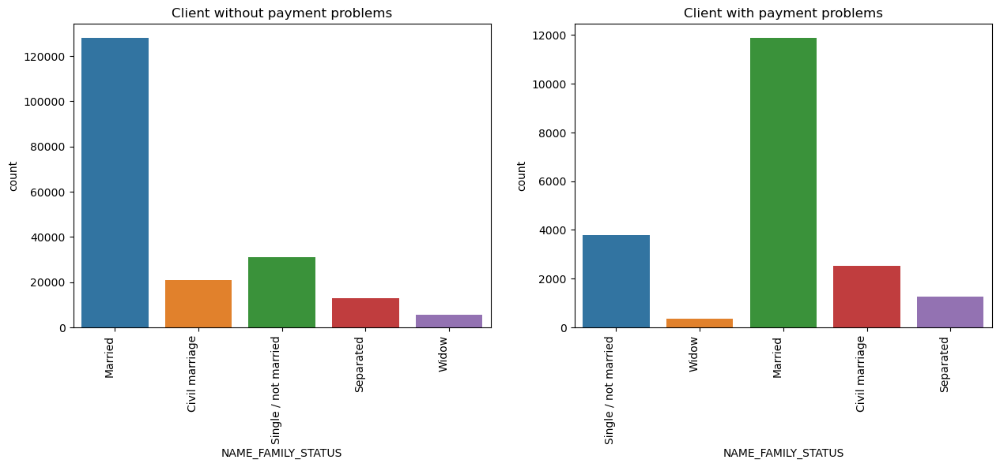

In [1564]:
# checking distribution of NAME_FAMILY_STATUS for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='NAME_FAMILY_STATUS')
plt.title('Client without payment problems')
axis.set(xlabel='NAME_FAMILY_STATUS')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='NAME_FAMILY_STATUS')
plt.title('Client with payment problems')
axis.set(xlabel='NAME_FAMILY_STATUS')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that married clients have most difficulties in payment

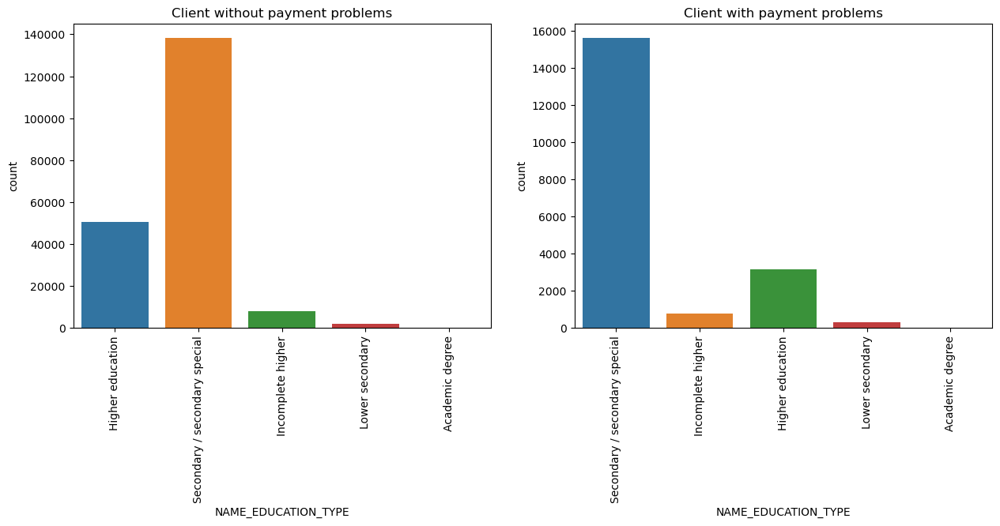

In [1671]:
# checking distribution of NAME_EDUCATION_TYPE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='NAME_EDUCATION_TYPE')
plt.title('Client without payment problems')
axis.set(xlabel='NAME_EDUCATION_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='NAME_EDUCATION_TYPE')
plt.title('Client with payment problems')
axis.set(xlabel='NAME_EDUCATION_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that clients with Secondary as their education have most difficulties in payment

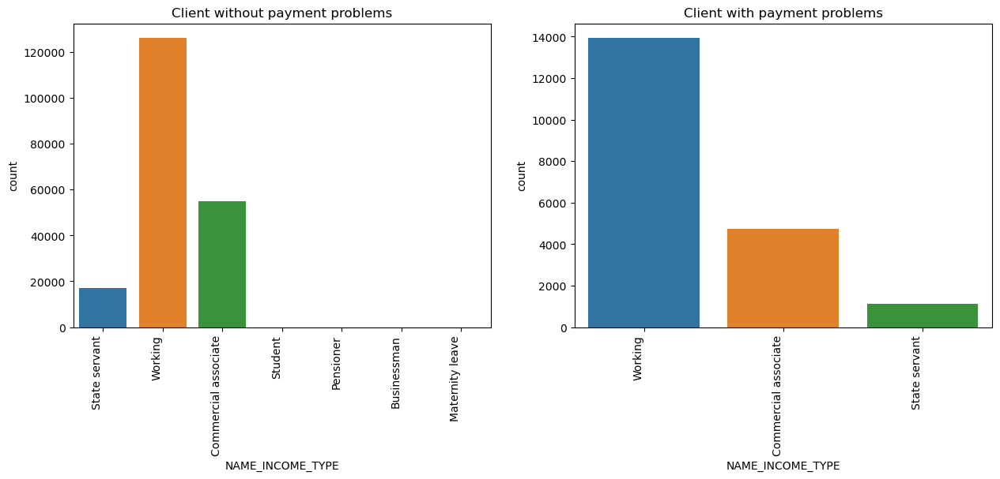

In [1566]:
# checking distribution of NAME_INCOME_TYPE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='NAME_INCOME_TYPE')
plt.title('Client without payment problems')
axis.set(xlabel='NAME_INCOME_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='NAME_INCOME_TYPE')
plt.title('Client with payment problems')
axis.set(xlabel='NAME_INCOME_TYPE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that clients with income type  as working  have most difficulties in payment

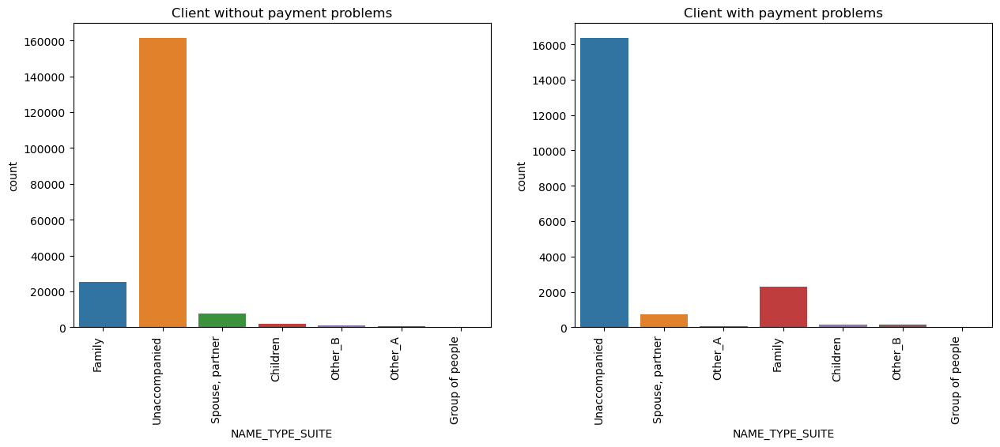

In [1567]:
# checking distribution of NAME_TYPE_SUITE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
axis=sns.countplot(data=application_df_target0,x='NAME_TYPE_SUITE')
plt.title('Client without payment problems')
axis.set(xlabel='NAME_TYPE_SUITE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.subplot(1,2,2)
axis=sns.countplot(data=application_df_target1,x='NAME_TYPE_SUITE')
plt.title('Client with payment problems')
axis.set(xlabel='NAME_TYPE_SUITE')
temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90)

plt.show()

In [ ]:
# from above we can see that clients unaccompanied while applying for loan have most difficulties in payment

# 3. Numerical Variable

In [1568]:
application_df_numeric

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,...,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,26
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,...,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,46
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,...,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0,53
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,...,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0,55
5,100008,0,0,99000.0,490495.5,27517.5,454500.0,0.035792,-16941,-1588,...,0.0,0.0,-2536.0,0.0,0.0,0.0,0.0,1.0,1.0,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307504,456248,0,0,153000.0,331920.0,16096.5,225000.0,0.022625,-16705,-7258,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,46
307506,456251,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,...,0.0,0.0,-273.0,0.0,0.0,0.0,0.0,0.0,1.0,26
307508,456253,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,...,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0,42
307509,456254,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,...,0.0,0.0,-322.0,0.0,0.0,0.0,0.0,0.0,0.0,33


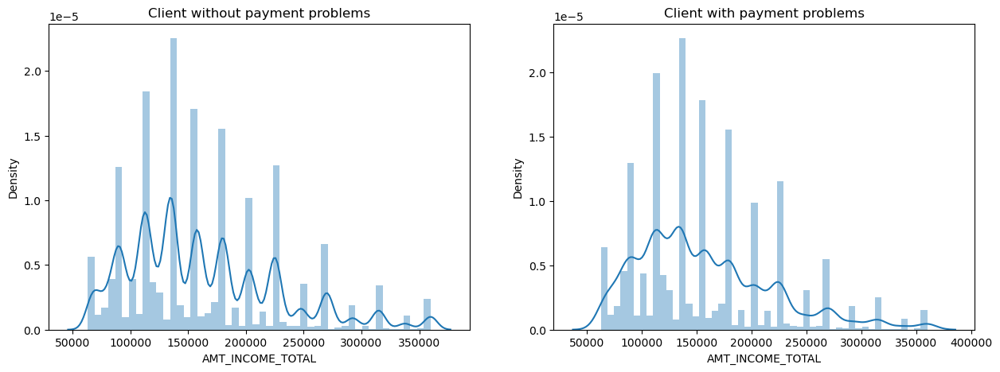

In [1569]:
# checking distribution of income value for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.distplot(application_df_target0['AMT_INCOME_TOTAL'])
plt.title('Client without payment problems')


plt.subplot(1,2,2)
axis=sns.distplot(application_df_target1['AMT_INCOME_TOTAL'])
plt.title('Client with payment problems')


plt.show()

In [ ]:
# from above we can see that clients with  difficulties in payment are more concentrated in lower salary ramges

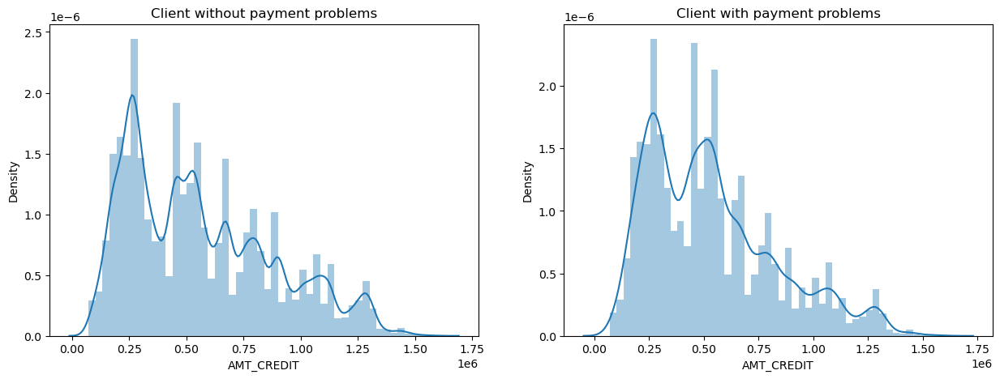

In [1570]:
# checking distribution of credit value for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.distplot(application_df_target0['AMT_CREDIT'])
plt.title('Client without payment problems')


plt.subplot(1,2,2)
axis=sns.distplot(application_df_target1['AMT_CREDIT'])
plt.title('Client with payment problems')


plt.show()

In [ ]:
# from above we can see that clients with  difficulties in payment are more concentrated in lower loan credit amount ramges

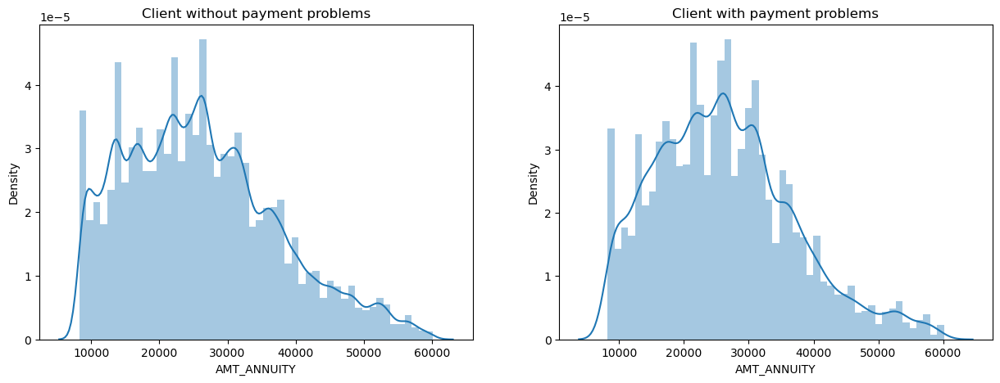

In [1571]:
# checking distribution of loan annunity for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.distplot(application_df_target0['AMT_ANNUITY'])
plt.title('Client without payment problems')


plt.subplot(1,2,2)
axis=sns.distplot(application_df_target1['AMT_ANNUITY'])
plt.title('Client with payment problems')


plt.show()

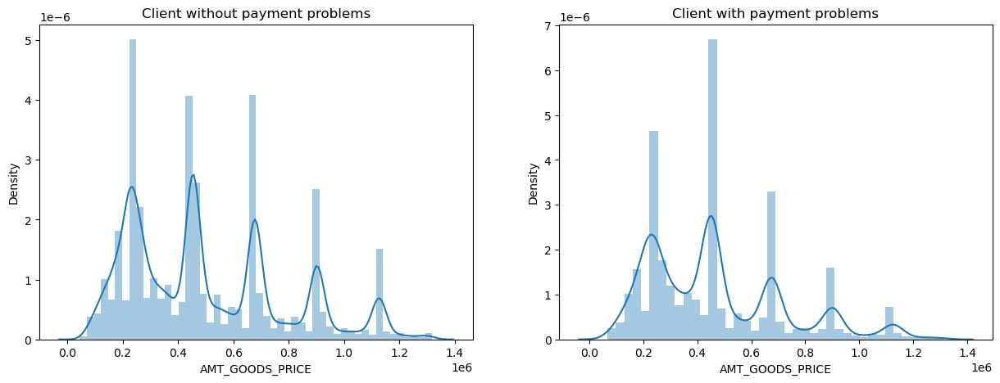

In [1572]:
# checking distribution of AMT_GOODS_PRICE for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.distplot(application_df_target0['AMT_GOODS_PRICE'])
plt.title('Client without payment problems')


plt.subplot(1,2,2)
axis=sns.distplot(application_df_target1['AMT_GOODS_PRICE'])
plt.title('Client with payment problems')


plt.show()

# B. Bi-Variate Analysis

# 1. Numerical

In [1574]:
# printing numeric columns
application_df_numeric.columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE'],
      dtype='object')

In [1573]:
# selecting numerical columns to find correcction woith each other for both target outcomes

application_df_corr=application_df[['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT','DAYS_EMPLOYED','AGE', 'EXT_SOURCE_2', 'EXT_SOURCE_3']]


application_df_corr_target1=application_df_corr[application_df_corr['TARGET']==1]
application_df_corr_target0=application_df_corr[application_df_corr['TARGET']==0]

<AxesSubplot:>

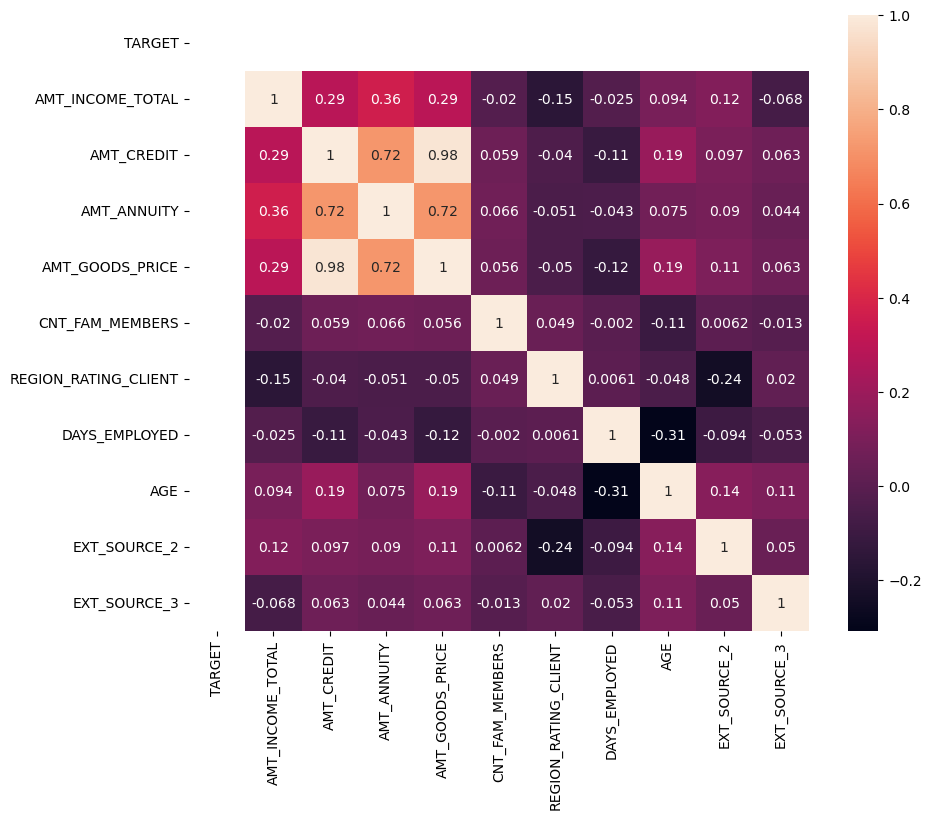

In [1575]:
# getting correlation between two variables for client with payment difficulties
plt.figure(figsize=(12,12))
sns.heatmap(application_df_corr_target1.corr(),annot=True)

In [ ]:
# from above we can see that there is strong correlation between
# 1. AMT_CREDIT and AMT_ANNUITY
# 2. AMT_CREDIT and AMT_GOODS_PRICE
# 3. AMT_GOODS_PRICE and AMT_ANNUITY

<AxesSubplot:>

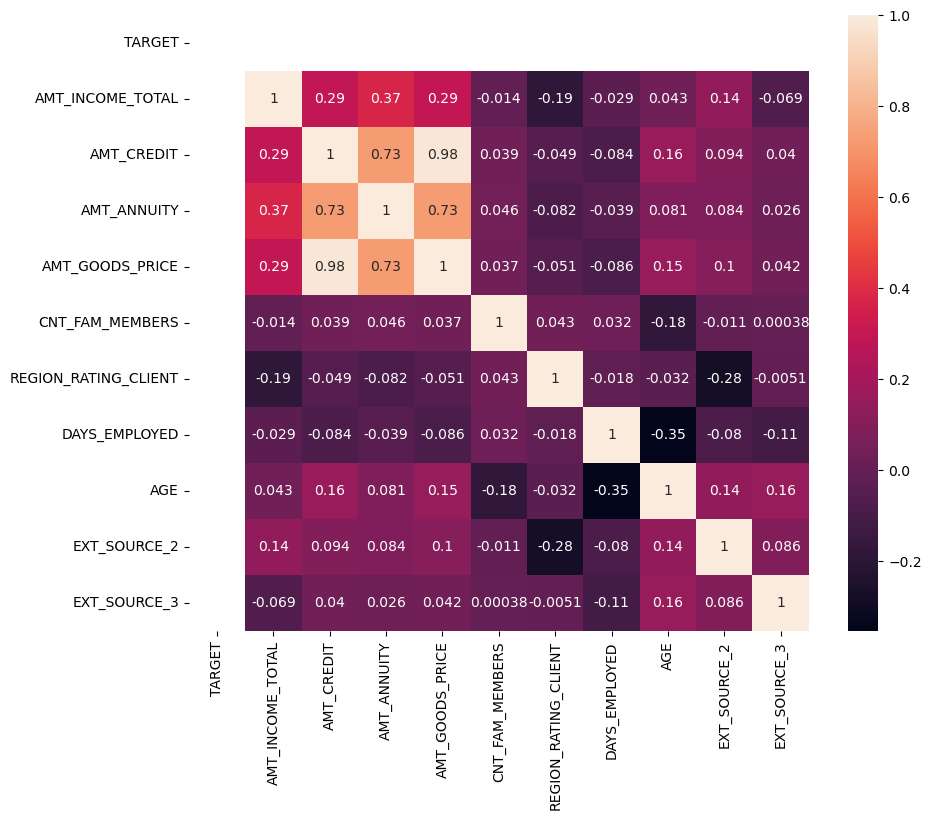

In [1576]:
# getting correlation between two variables for clients without payment difficulties
plt.figure(figsize=(12,12))
sns.heatmap(application_df_corr_target0.corr(),annot=True)

In [ ]:
# from above we can see that there is strong correlation between
# 1. AMT_CREDIT and AMT_ANNUITY
# 2. AMT_CREDIT and AMT_GOODS_PRICE
# 3. AMT_GOODS_PRICE and AMT_ANNUITY

Text(0.5, 1.0, 'Client with payment problems')

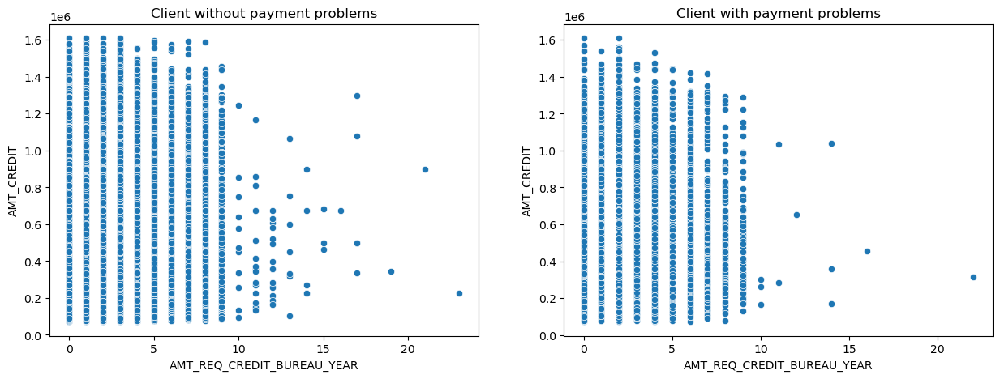

In [1577]:
# plotting scatterter plot to check affect of no of enquire to credit beaurea on AMT_Credit
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.scatterplot(data=application_df_target0,x='AMT_REQ_CREDIT_BUREAU_YEAR',y='AMT_CREDIT')
plt.title('Client without payment problems')

plt.subplot(1,2,2) 
sns.scatterplot(data=application_df_target1,x='AMT_REQ_CREDIT_BUREAU_YEAR',y='AMT_CREDIT')
plt.title('Client with payment problems')


In [ ]:
# from above we cam see as the requset increasses the credit amount decreases

Text(0.5, 1.0, 'Client with payment problems')

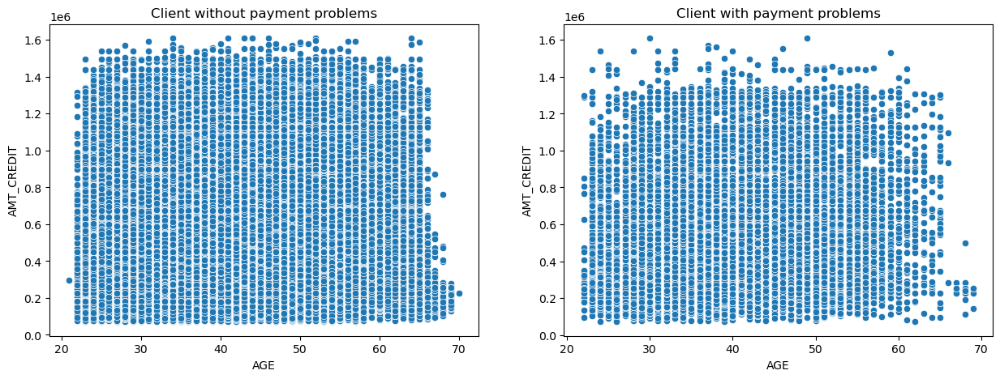

In [1578]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.scatterplot(data=application_df_target0,x='AGE',y='AMT_CREDIT')
plt.title('Client without payment problems')

plt.subplot(1,2,2) 
sns.scatterplot(data=application_df_target1,x='AGE',y='AMT_CREDIT')
plt.title('Client with payment problems')

In [ ]:
# from above we cam see that the credit amount decreases as we approach elderly age group

Text(0.5, 1.0, 'Client with payment problems')

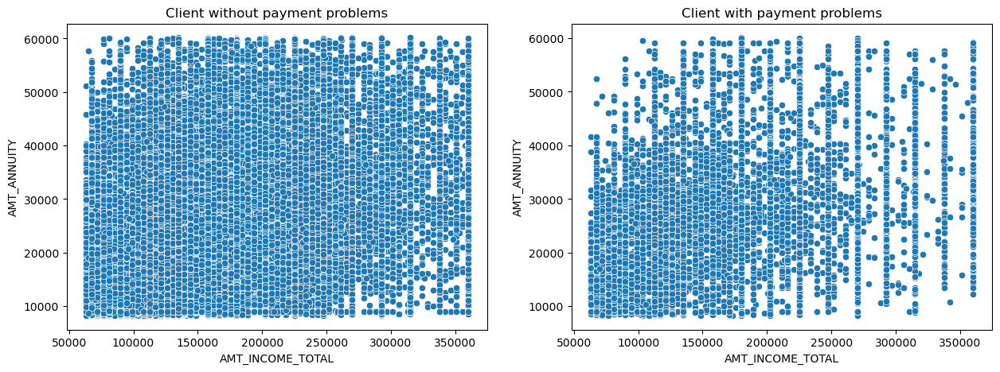

In [1579]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.scatterplot(data=application_df_target0,x='AMT_INCOME_TOTAL',y='AMT_ANNUITY')
plt.title('Client without payment problems')

plt.subplot(1,2,2) 
sns.scatterplot(data=application_df_target1,x='AMT_INCOME_TOTAL',y='AMT_ANNUITY')
plt.title('Client with payment problems')

In [ ]:
# from above we cam see that the loan annuity and amt income total have a kind off linea relation ship for the client with payment difficulties

Text(0.5, 1.0, 'Client with payment problems')

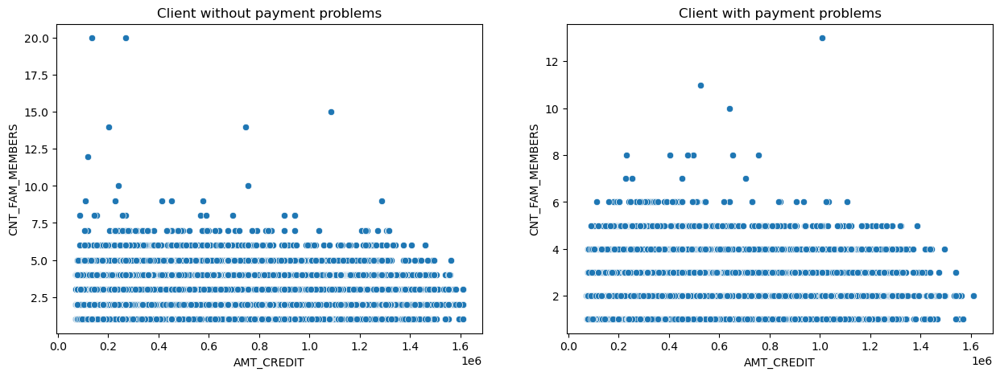

In [1580]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.scatterplot(data=application_df_target0,x='AMT_CREDIT',y='CNT_FAM_MEMBERS')
plt.title('Client without payment problems')

plt.subplot(1,2,2) 
sns.scatterplot(data=application_df_target1,x='AMT_CREDIT',y='CNT_FAM_MEMBERS')
plt.title('Client with payment problems')

In [ ]:
# from here we can see that the no of cfamily member does show a trend in both clients target types

# 2. Categorial

In [1581]:
application_df_categorical.columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AGE_GROUP',
       'INCOME_GROUP', 'CREDIT_GROUP'],
      dtype='object')

In [1582]:
def check_bivariate_boxplt(df1,df2,columns,value):
    length=len(columns)
    count=1
    
    k=['Client without payment problems','Client with payment problems']
    for col in columns:
        plt.figure(figsize=(15,150))
        print(col)
        i=0
        for df in [df1,df2]:
            axis=plt.subplot(length,2,count)
            sns.boxplot(data=df,y=value,x=col)
            plt.title(k[i])
            axis.set(xlabel=col)
            temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90, horizontalalignment='right')
            count+=1
            i+=1
        plt.show()

NAME_CONTRACT_TYPE


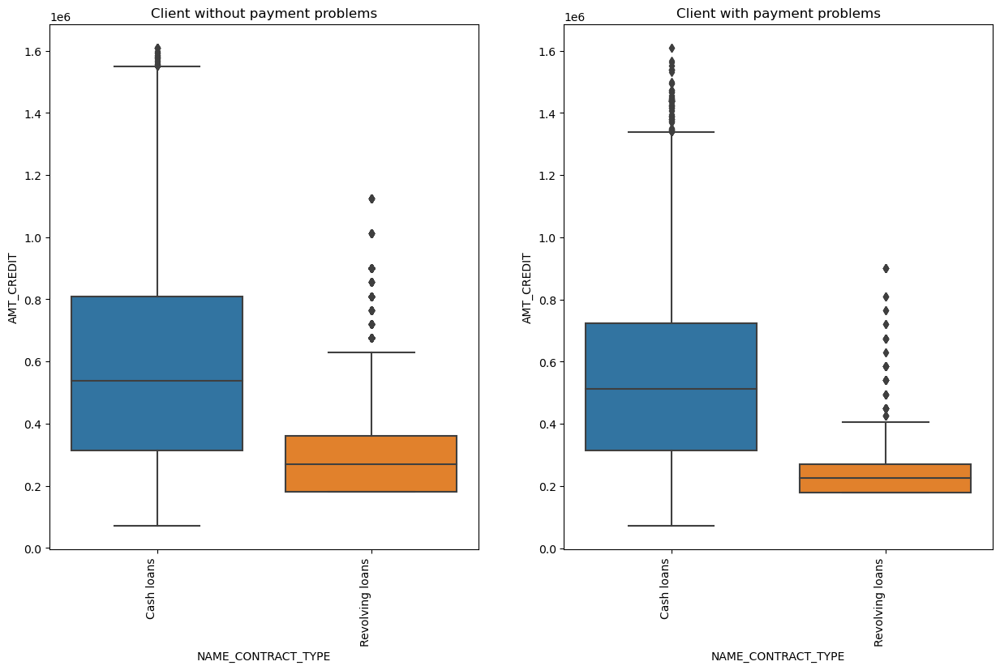

CODE_GENDER


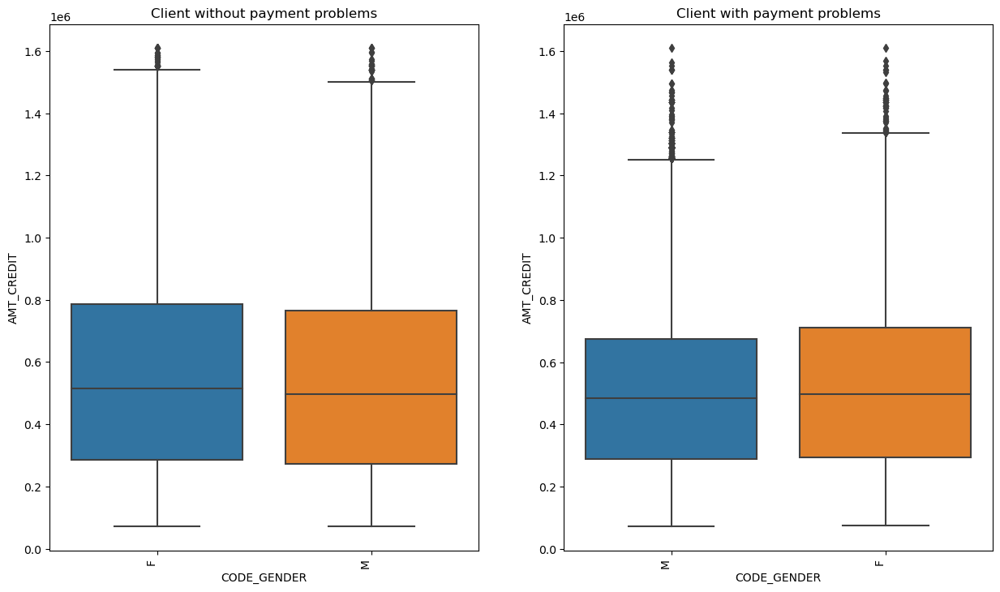

FLAG_OWN_CAR


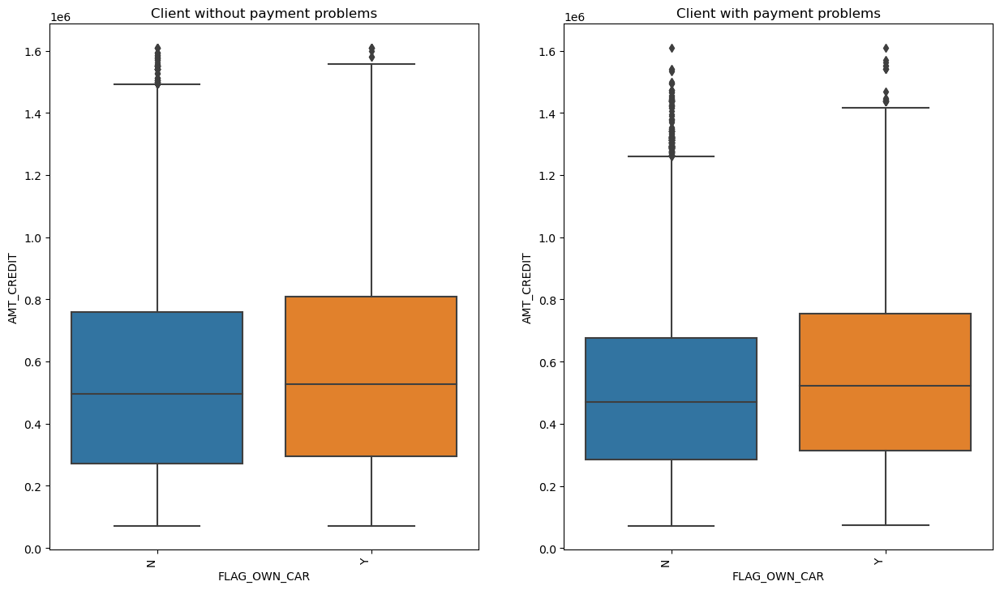

FLAG_OWN_REALTY


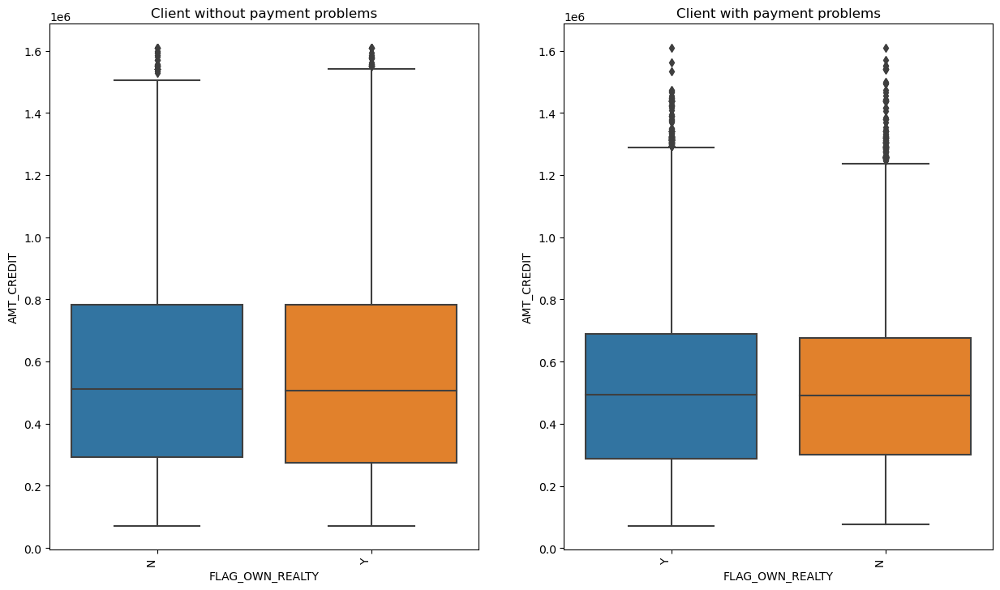

NAME_TYPE_SUITE


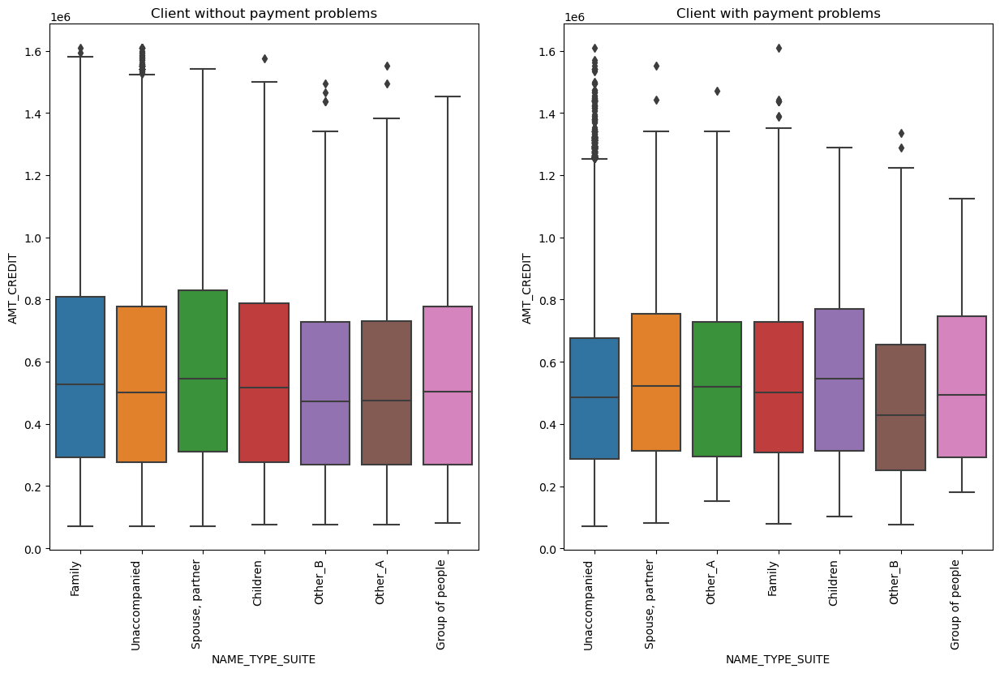

NAME_INCOME_TYPE


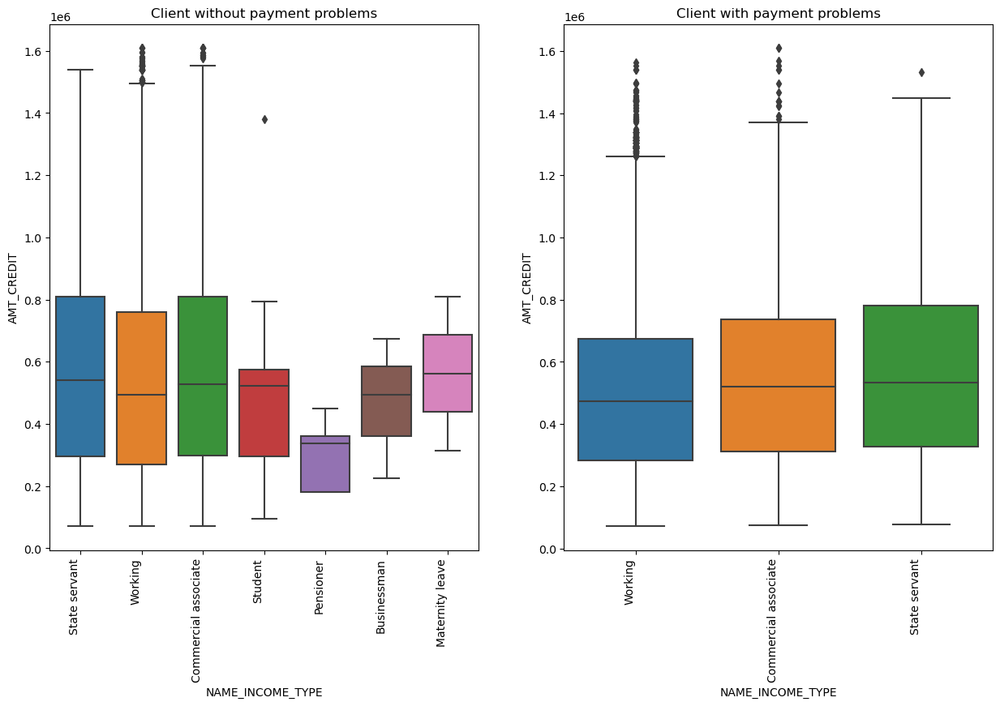

NAME_EDUCATION_TYPE


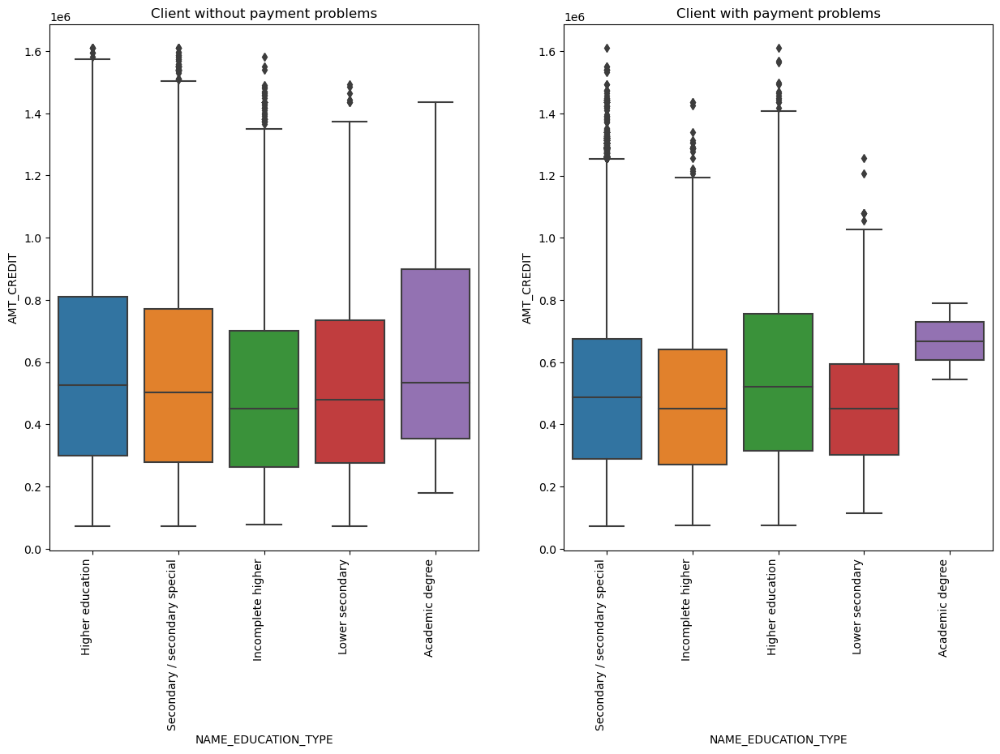

NAME_FAMILY_STATUS


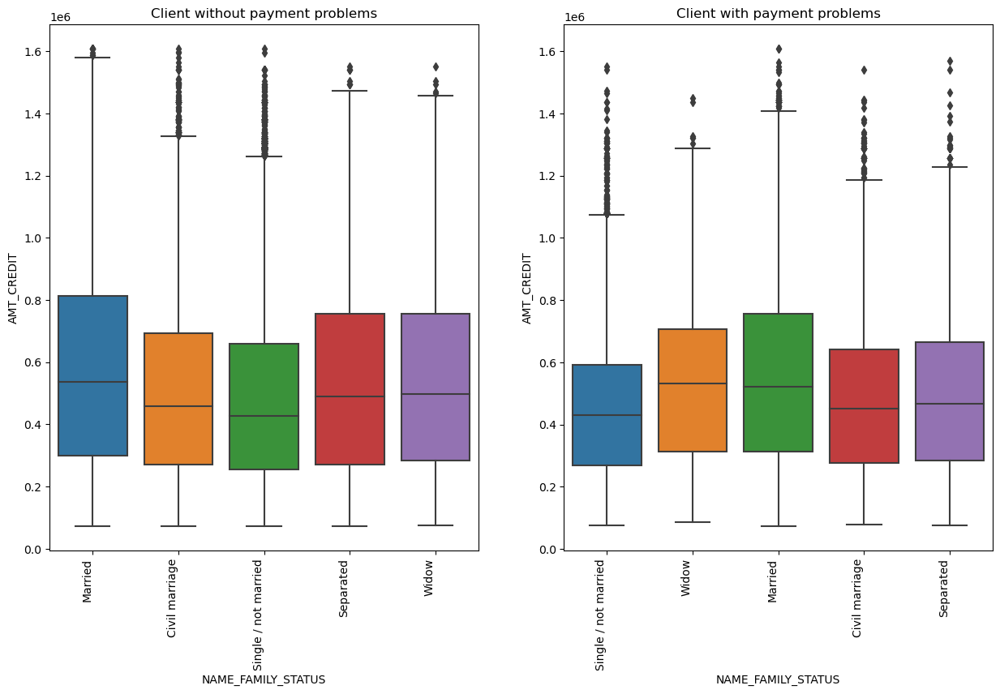

NAME_HOUSING_TYPE


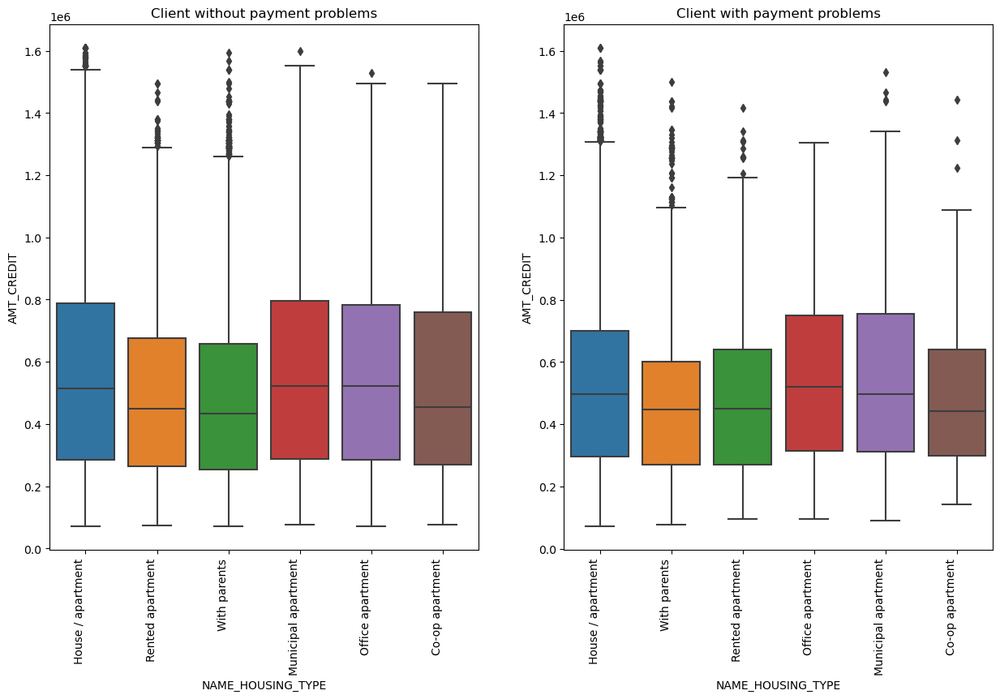

OCCUPATION_TYPE


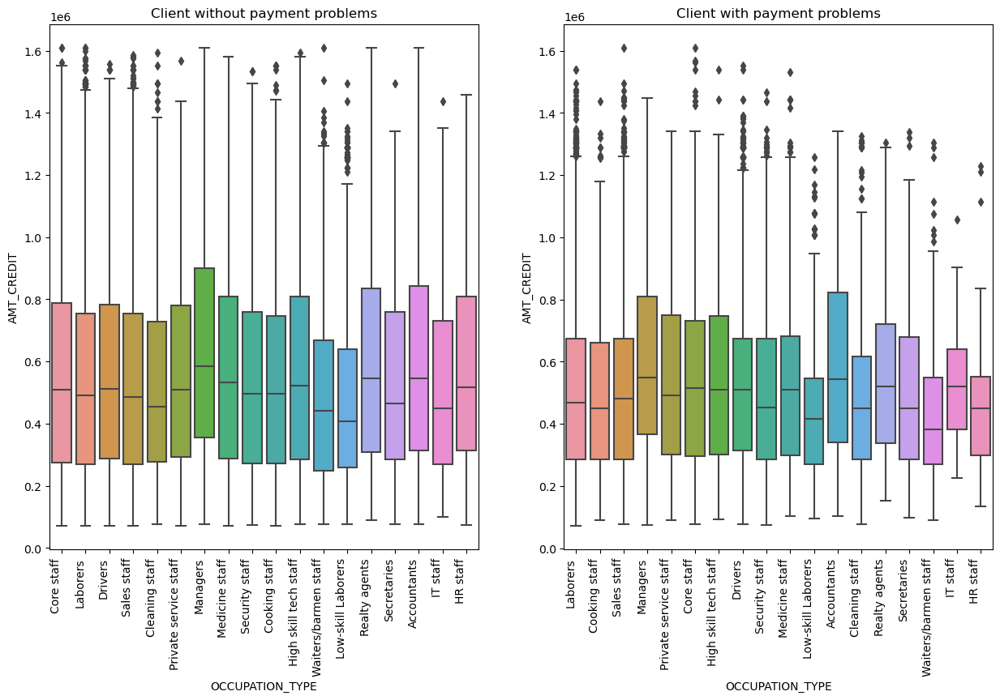

WEEKDAY_APPR_PROCESS_START


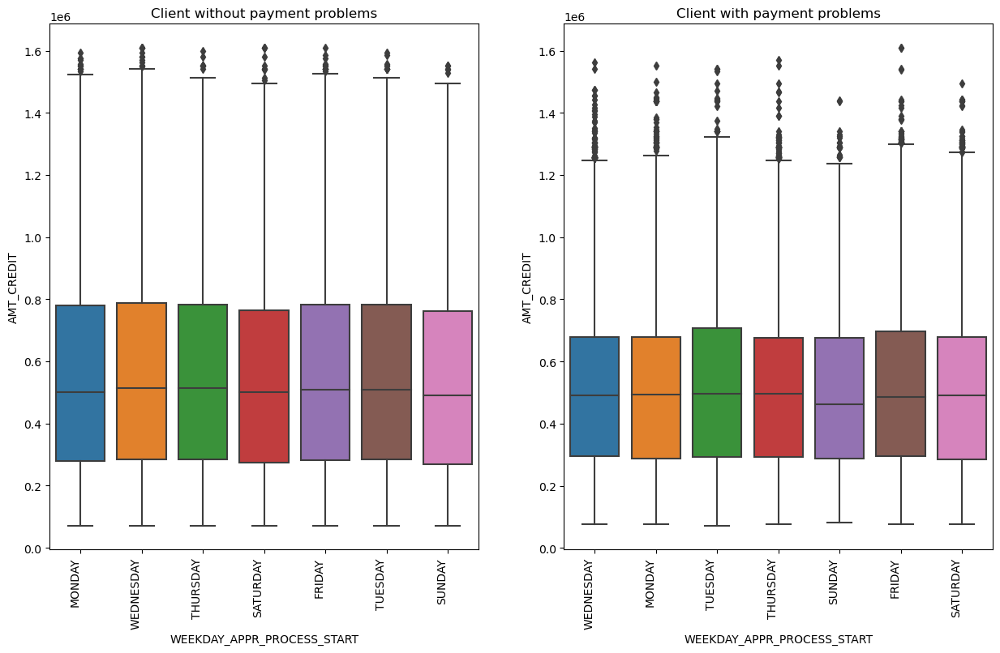

ORGANIZATION_TYPE


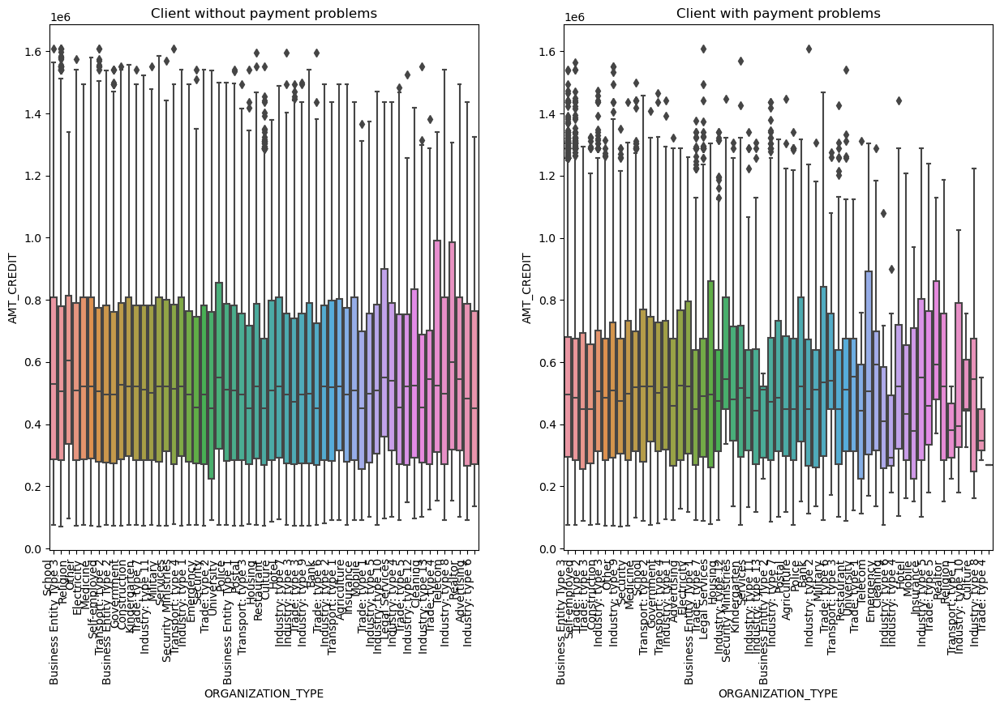

AGE_GROUP


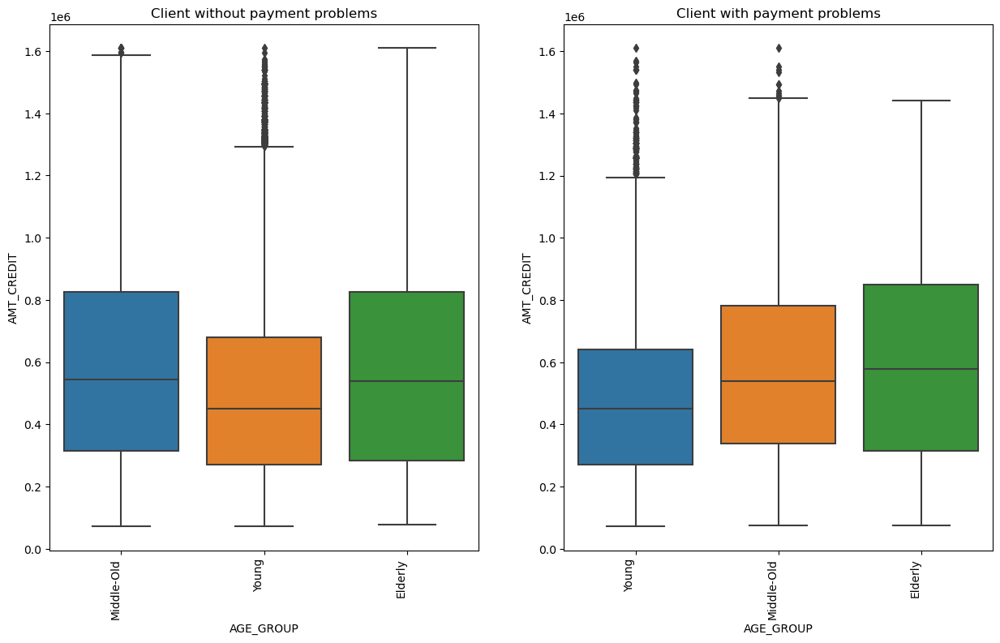

INCOME_GROUP


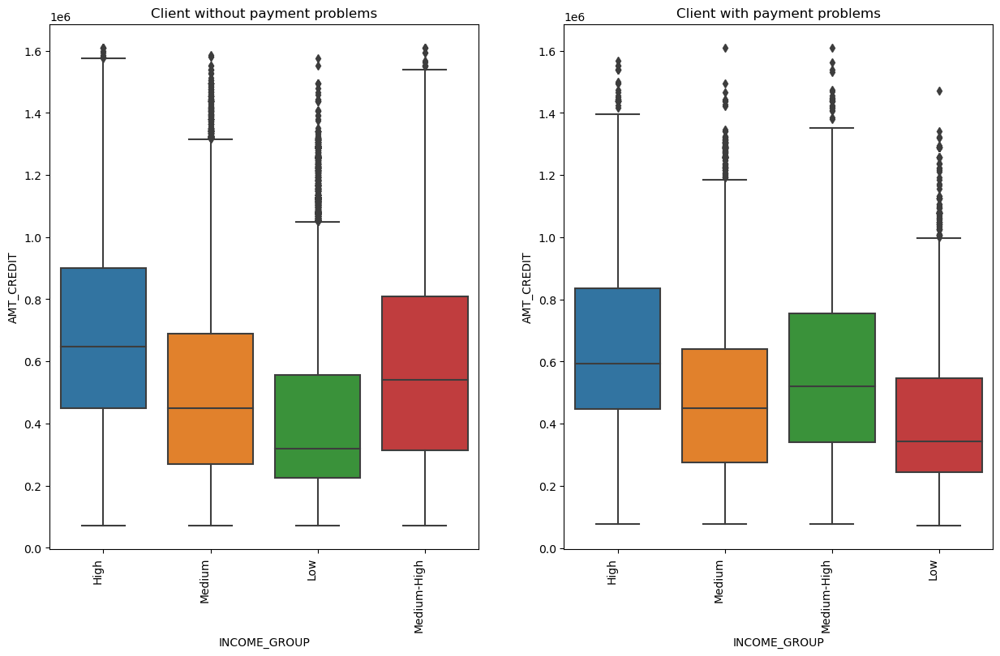

CREDIT_GROUP


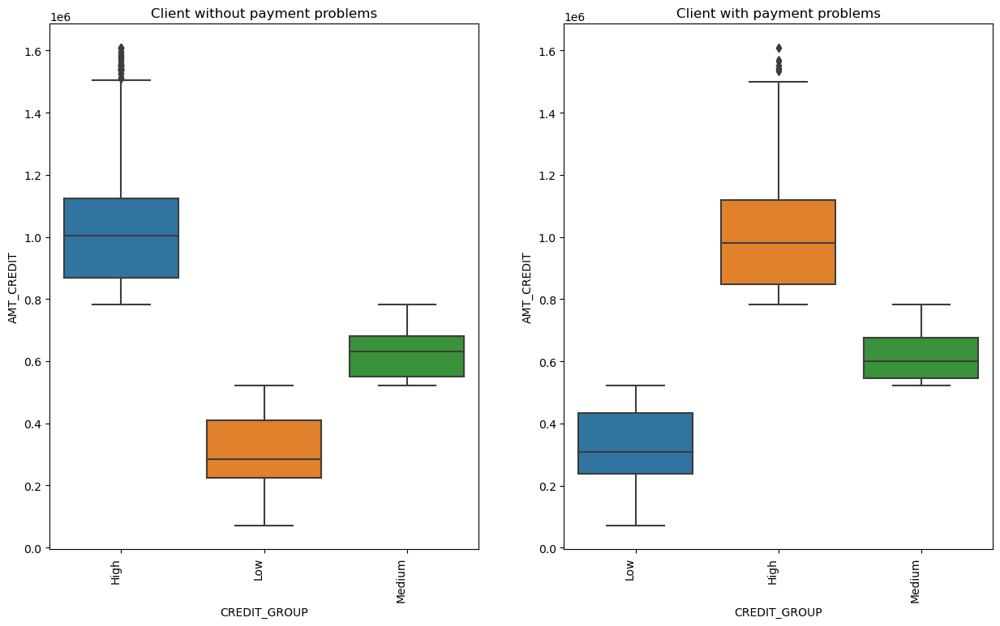

In [1583]:
 check_bivariate_boxplt(application_df_target0,application_df_target1,['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AGE_GROUP',
       'INCOME_GROUP', 'CREDIT_GROUP'],'AMT_CREDIT')

In [1584]:
# function for barplot visualization
def check_bivariate_barplot(df1,df2,columns,value):
    length=len(columns)
    count=1
    
    k=['Client without payment problems','Client with payment problems']
    for col in columns:
        plt.figure(figsize=(15,150))
        print(col)
        i=0
        for df in [df1,df2]:
            axis=plt.subplot(length,2,count)
            df.groupby(col)[value].mean().plot.bar()
            plt.title(k[i])
            axis.set(xlabel=col)
            axis.set(ylabel=value)
            temp = axis.set_xticklabels(axis.get_xticklabels(), rotation = 90, horizontalalignment='right')
            count+=1
            i+=1
        plt.show()

NAME_CONTRACT_TYPE


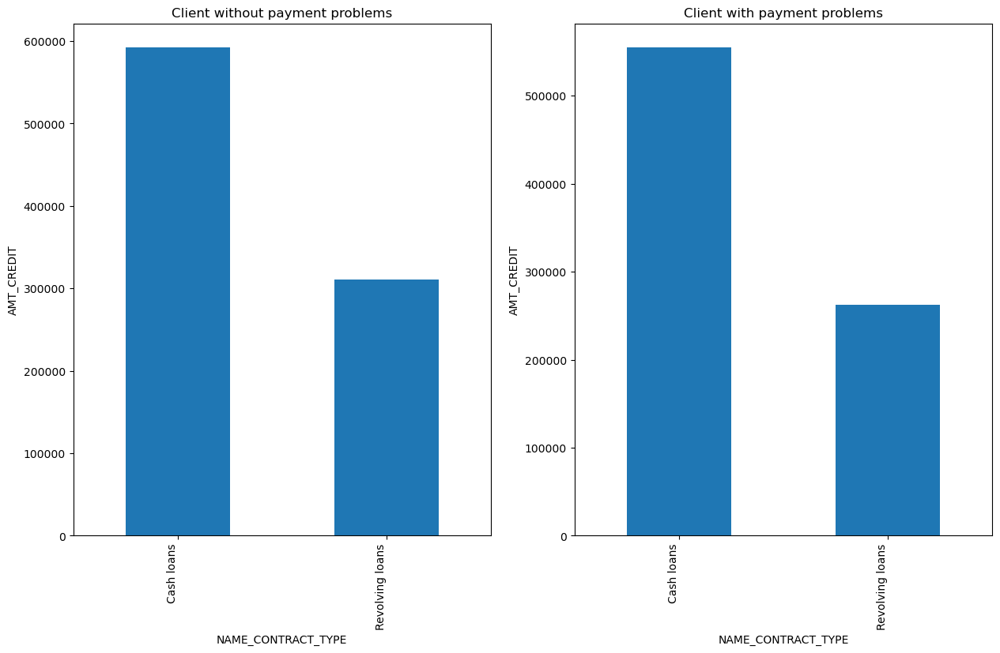

CODE_GENDER


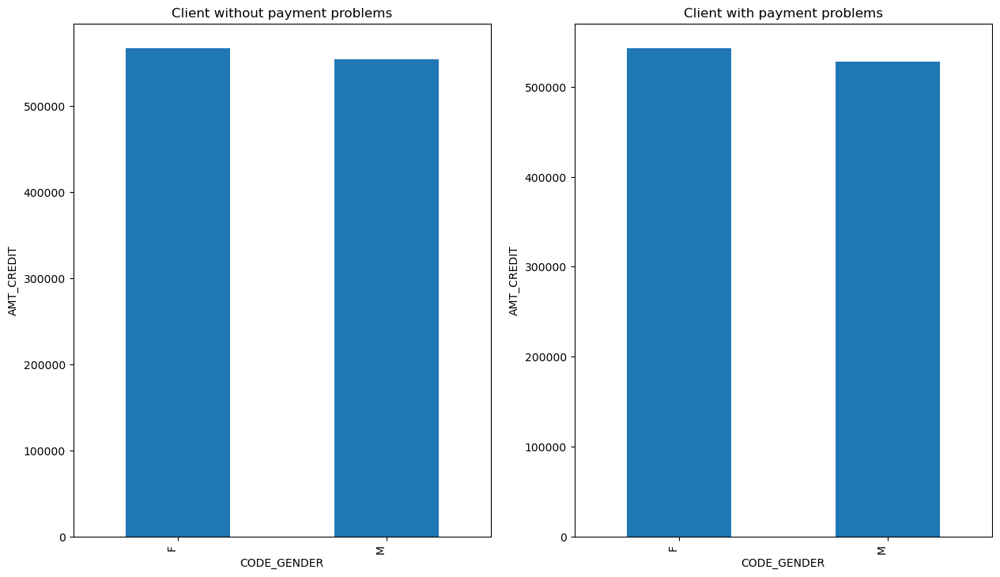

FLAG_OWN_CAR


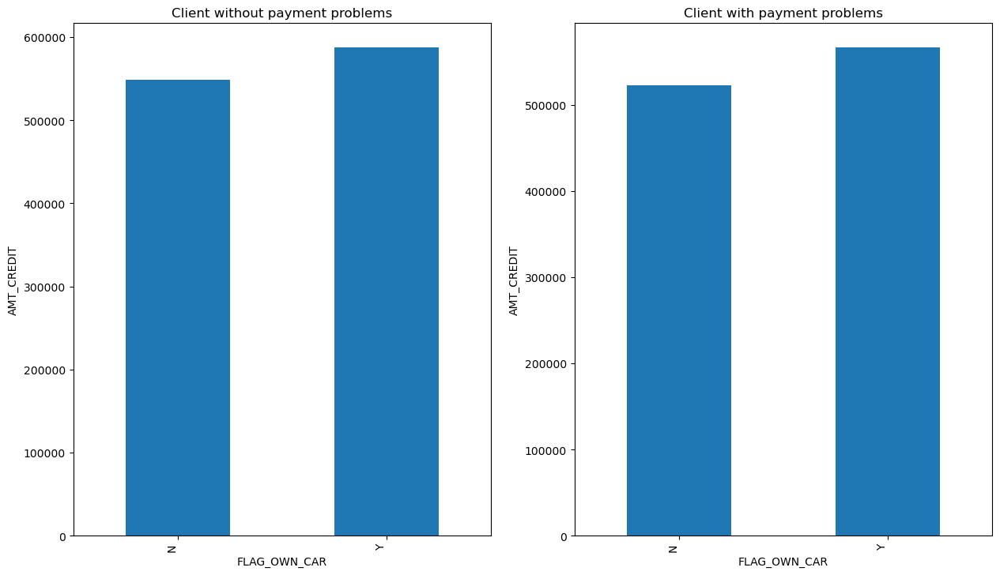

FLAG_OWN_REALTY


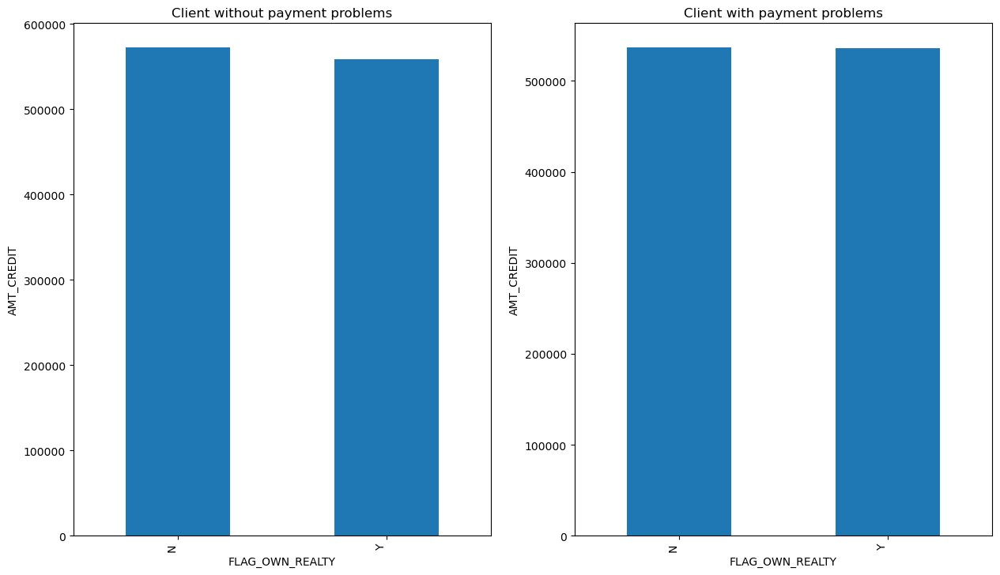

NAME_TYPE_SUITE


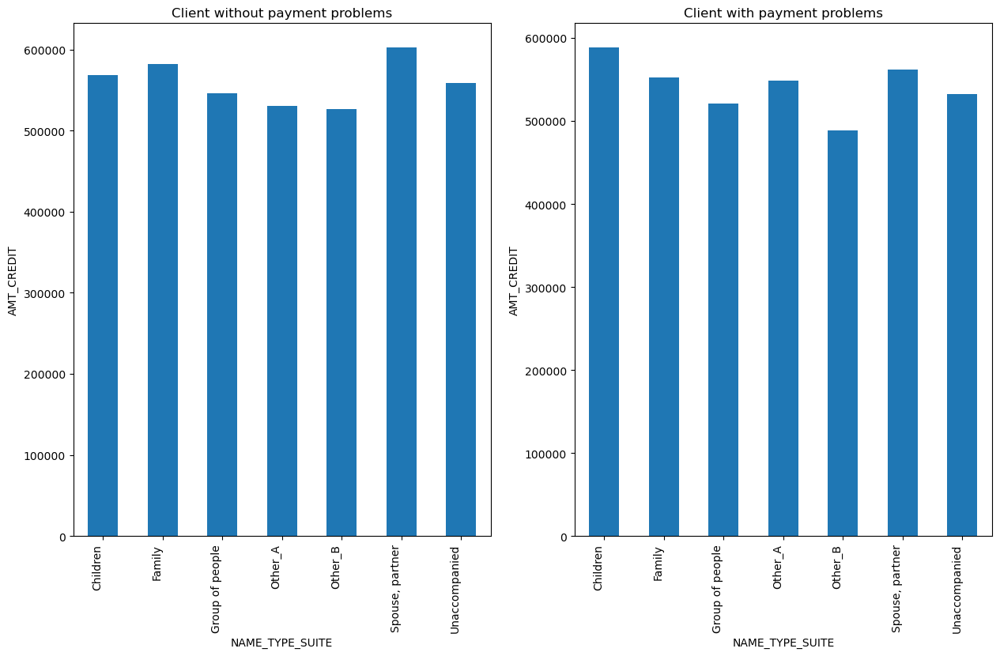

NAME_INCOME_TYPE


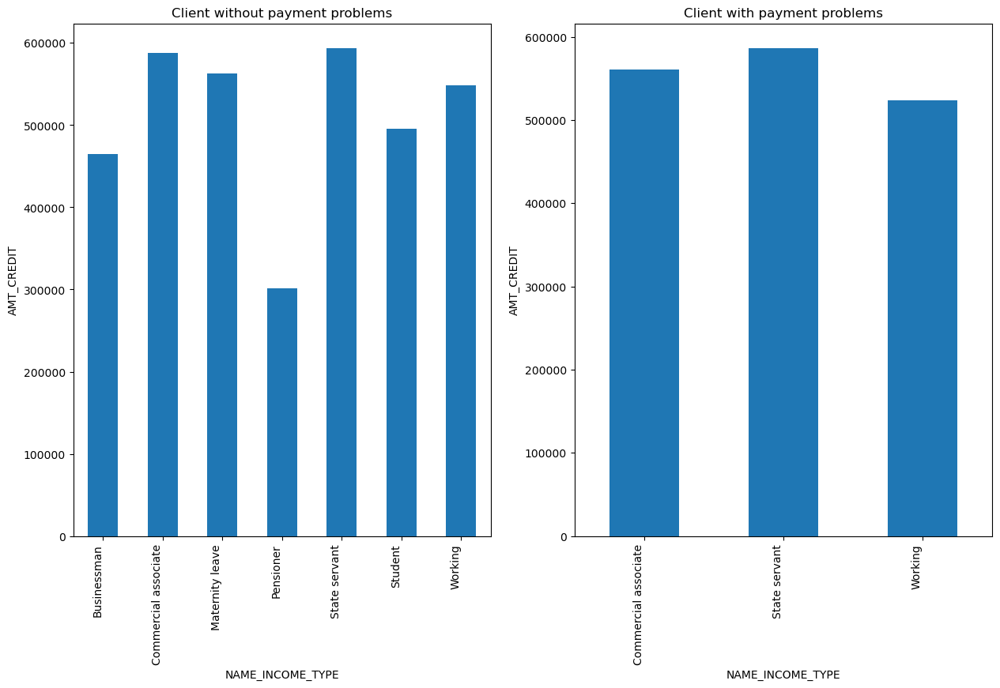

NAME_EDUCATION_TYPE


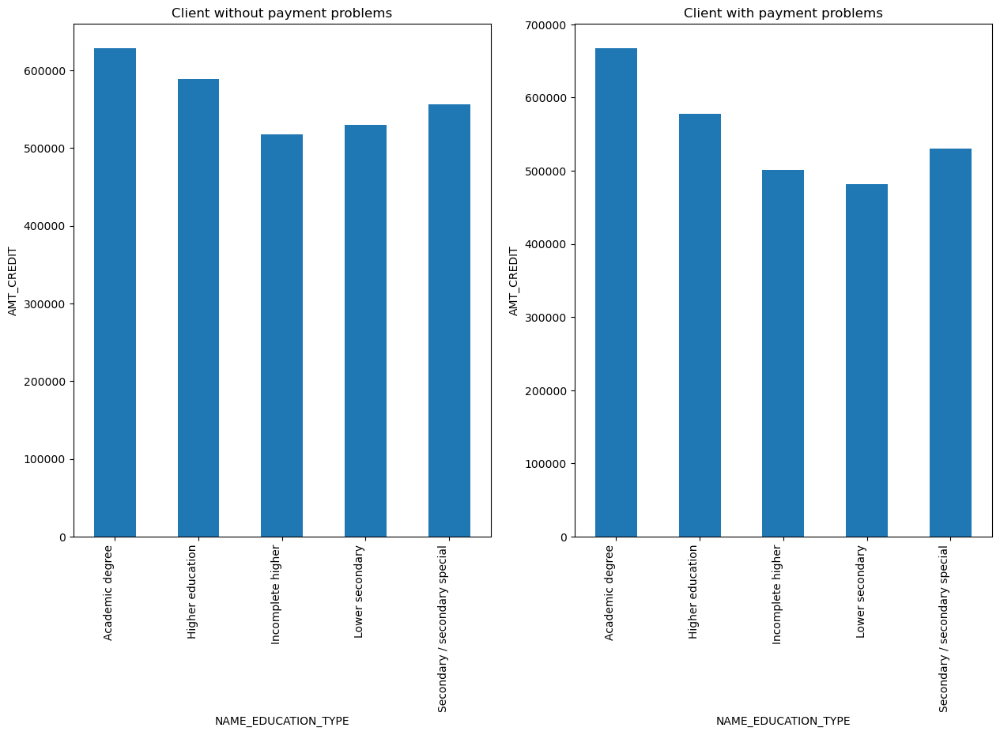

NAME_FAMILY_STATUS


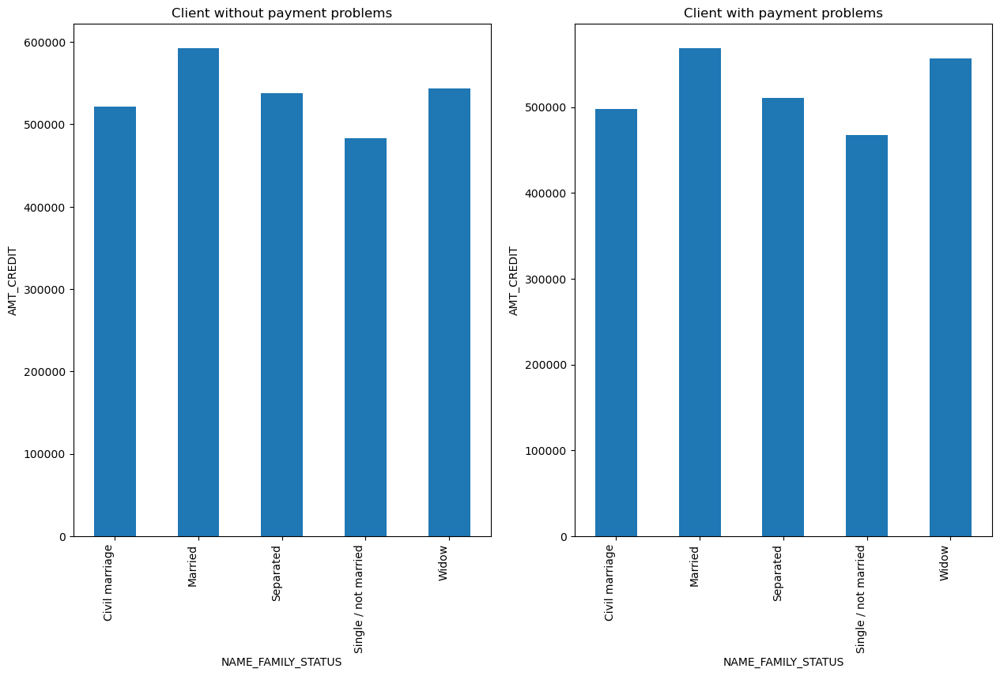

NAME_HOUSING_TYPE


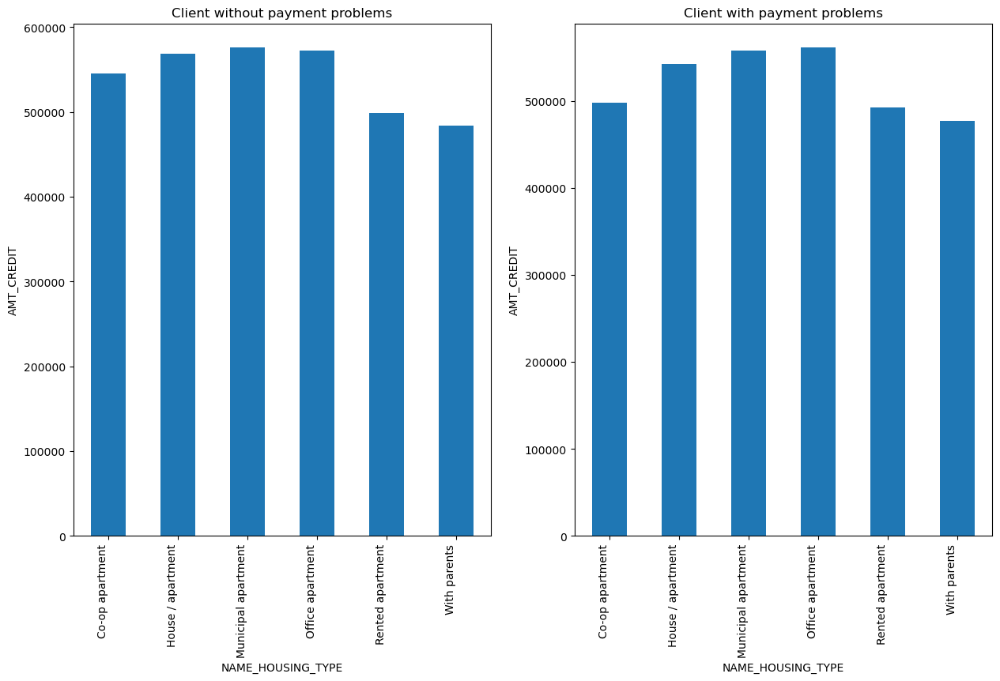

OCCUPATION_TYPE


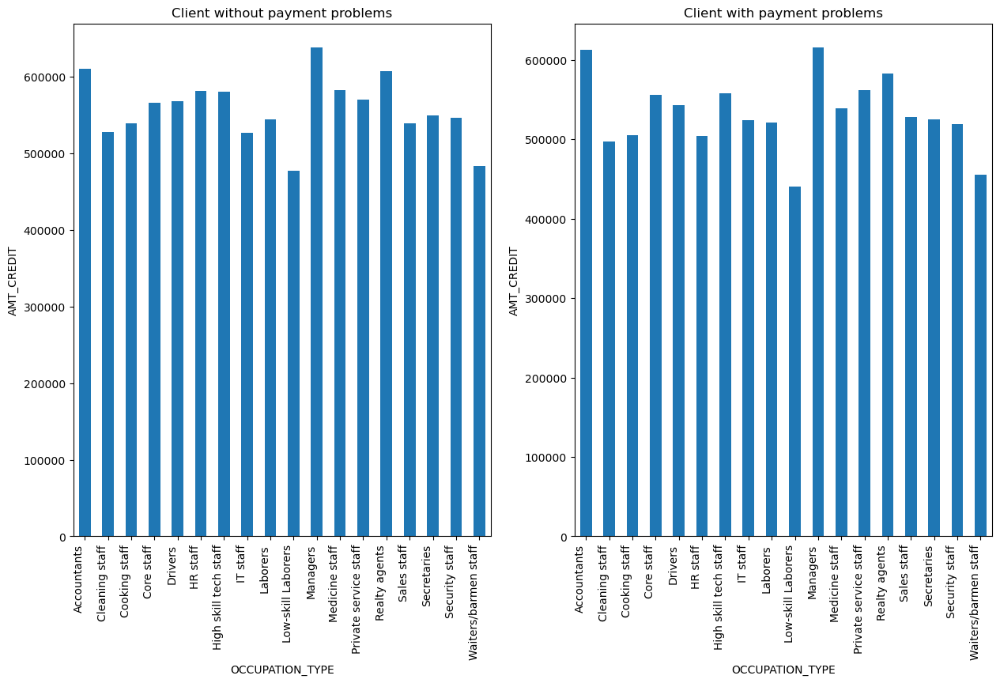

WEEKDAY_APPR_PROCESS_START


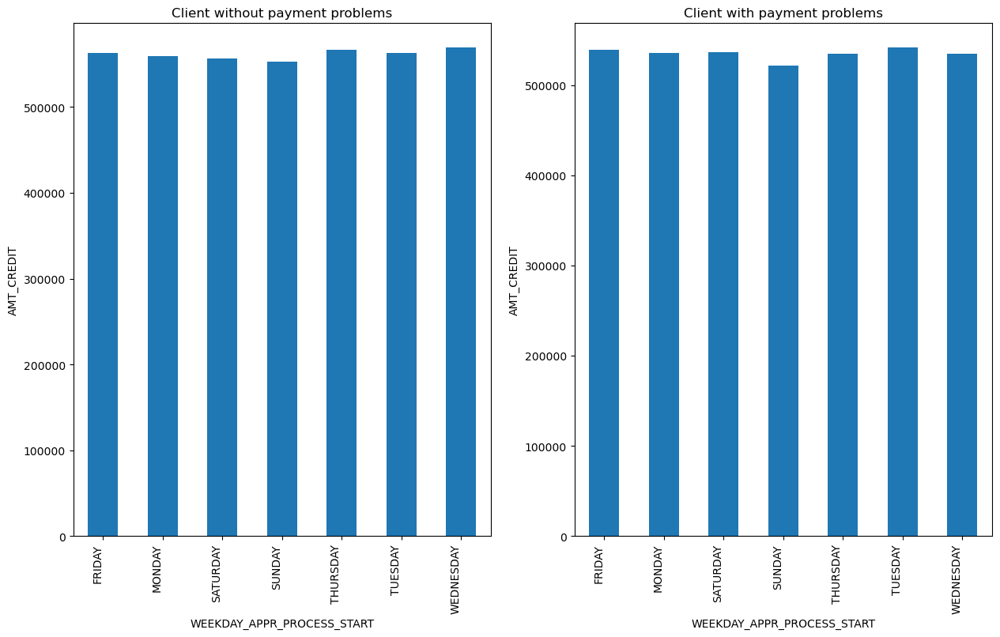

ORGANIZATION_TYPE


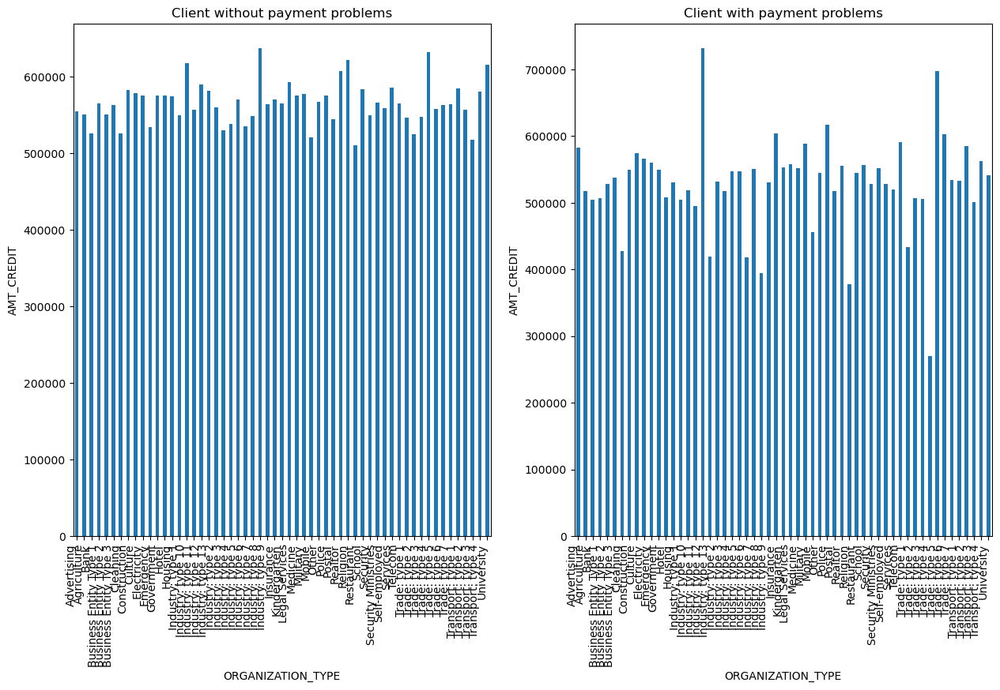

AGE_GROUP


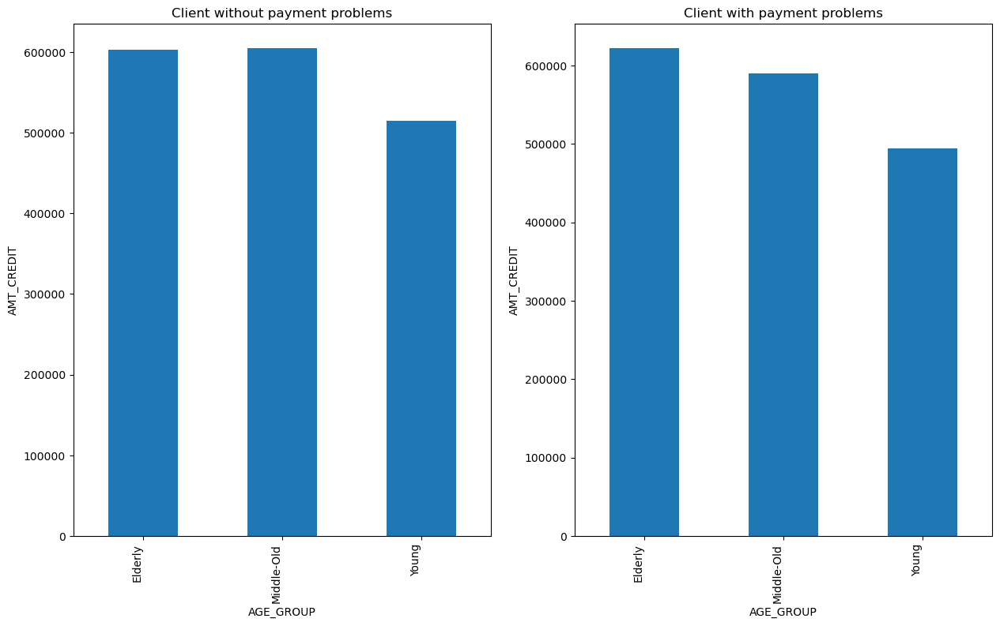

INCOME_GROUP


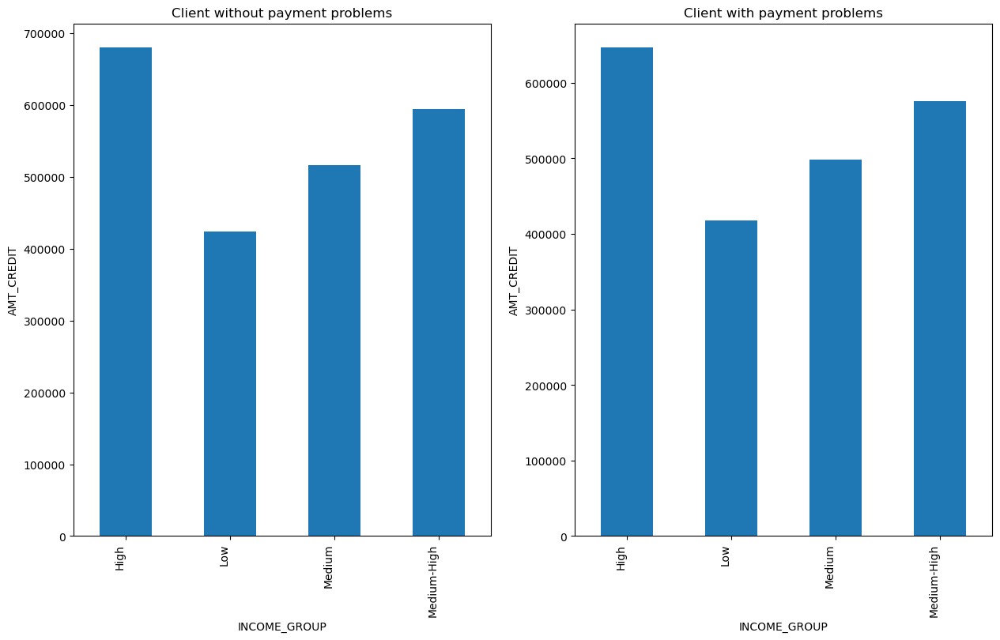

CREDIT_GROUP


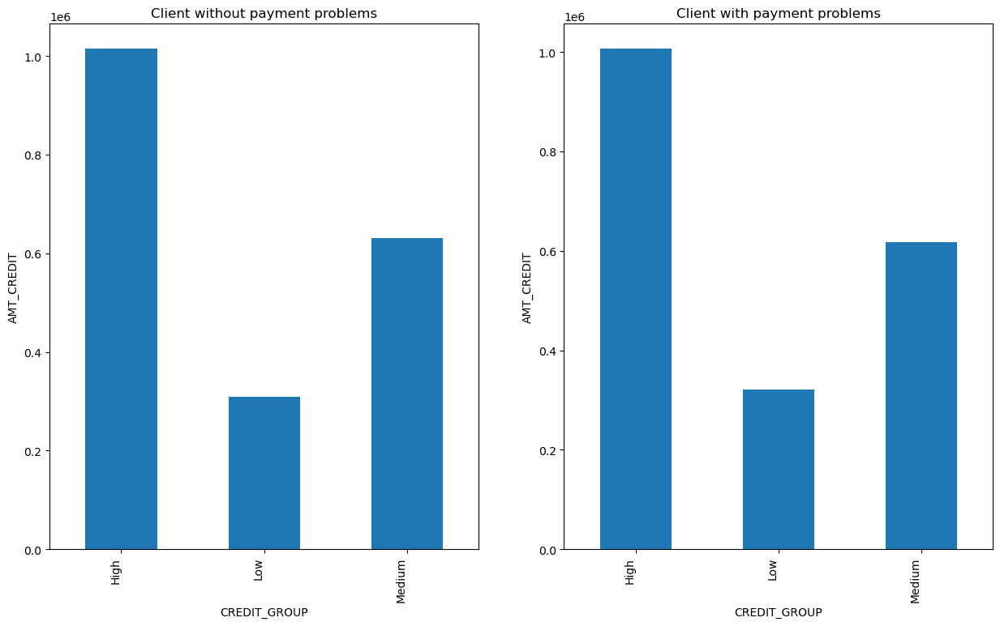

In [1585]:
 check_bivariate_barplot(application_df_target0,application_df_target1,['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AGE_GROUP',
       'INCOME_GROUP', 'CREDIT_GROUP'],'AMT_CREDIT')

In [ ]:
# from the above graphs we can see 
# 1.credit amount is low for both target clients having contract type as revolving.
# 2.NO major difference in credit amount for different gender, owned car or realty status, type_suite(accompanies),education,family status,housing type,occupation type.
# 3. Elderly and middle-old clients have more amt credit then young clients.
# 4. HIgh income group had the most amount credited.

NAME_CONTRACT_TYPE


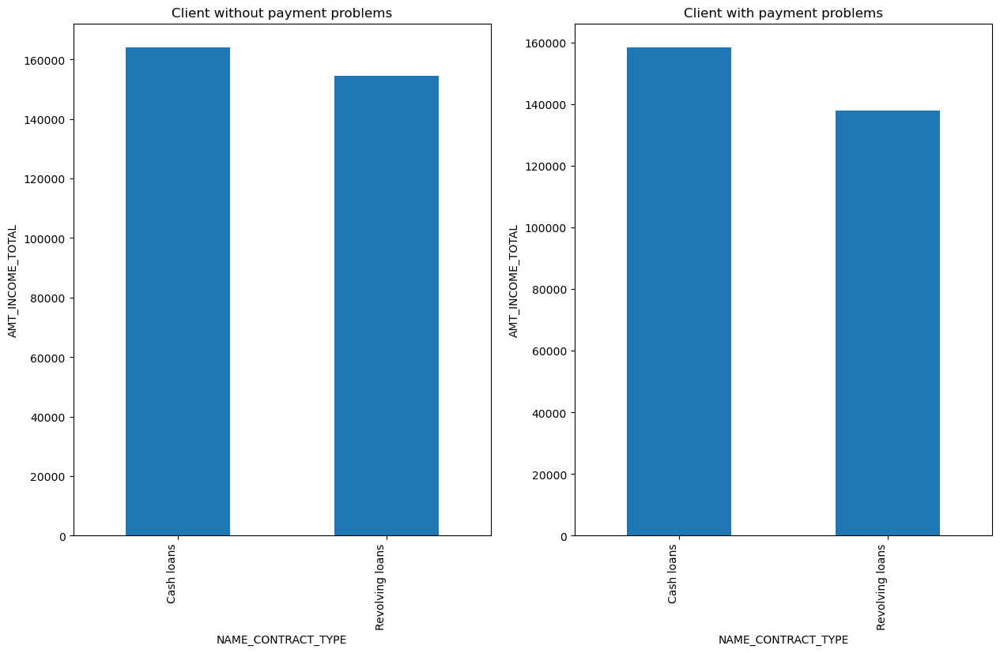

CODE_GENDER


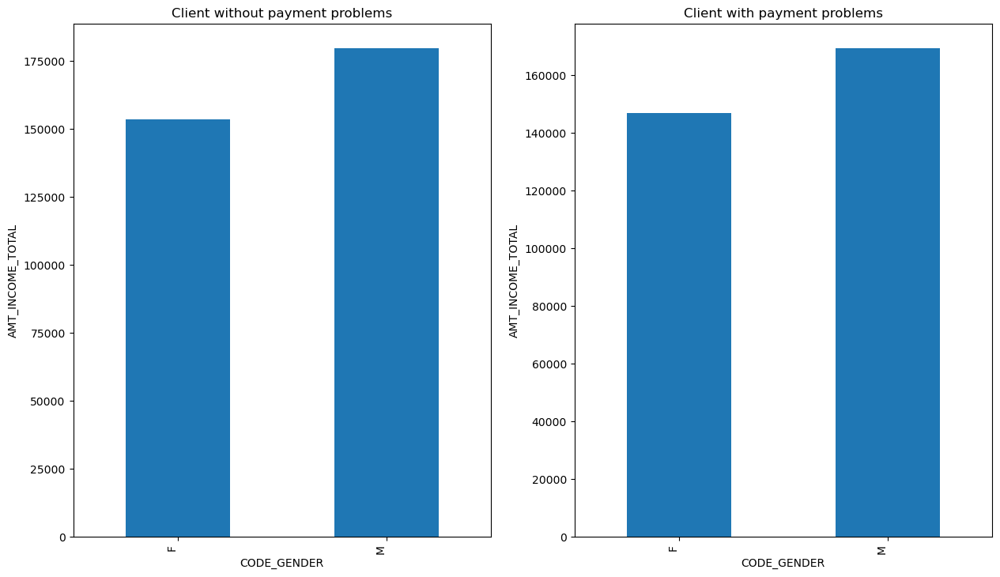

FLAG_OWN_CAR


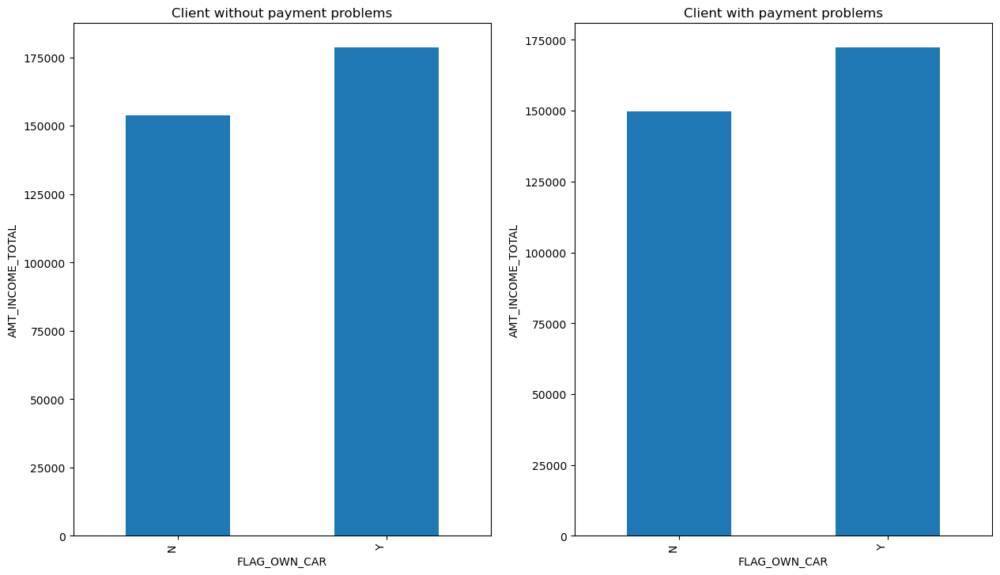

FLAG_OWN_REALTY


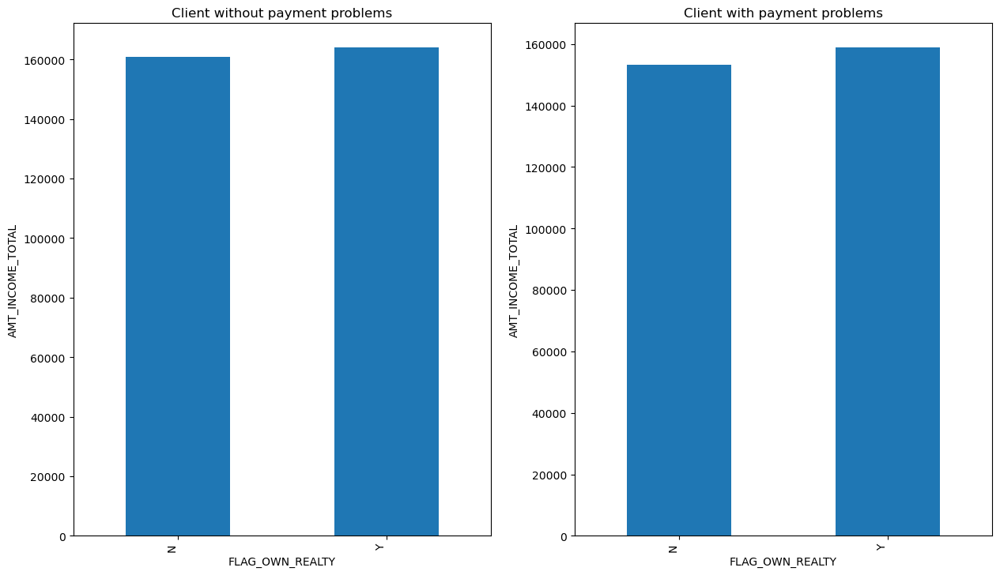

NAME_TYPE_SUITE


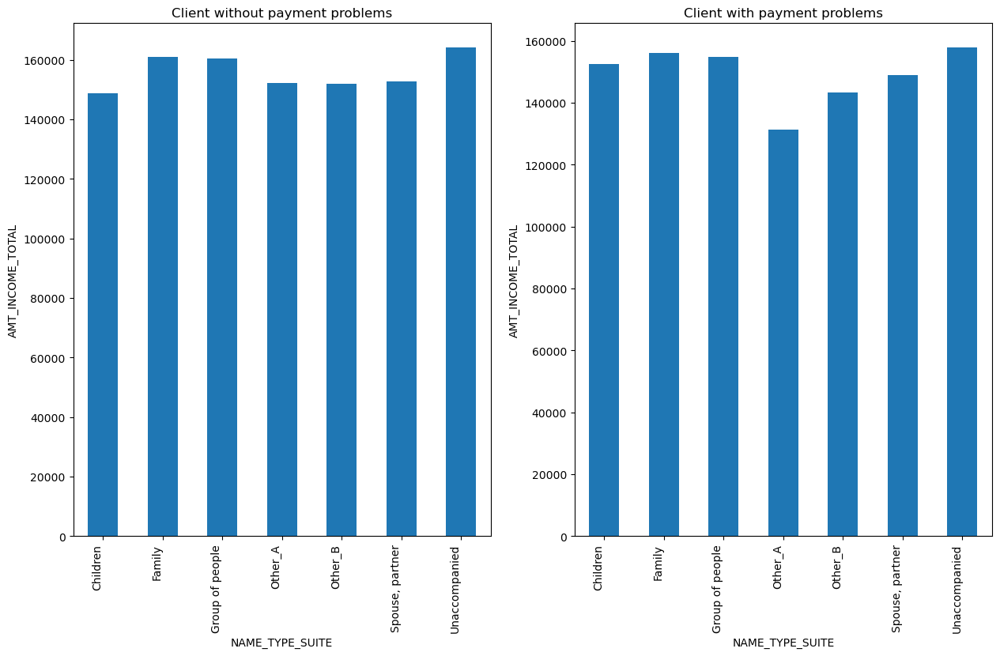

NAME_INCOME_TYPE


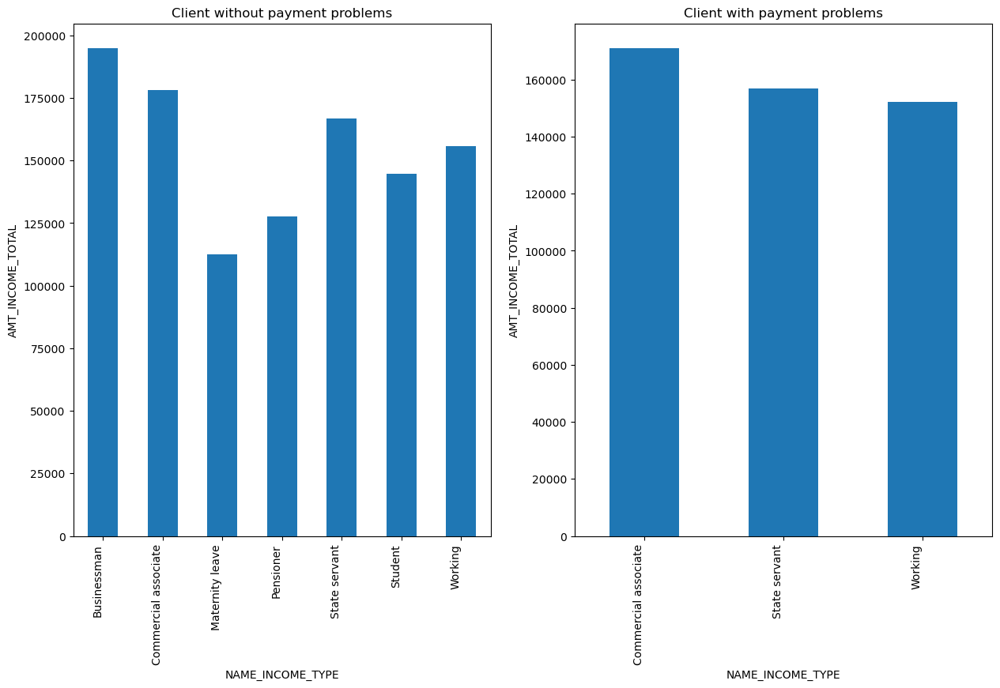

NAME_EDUCATION_TYPE


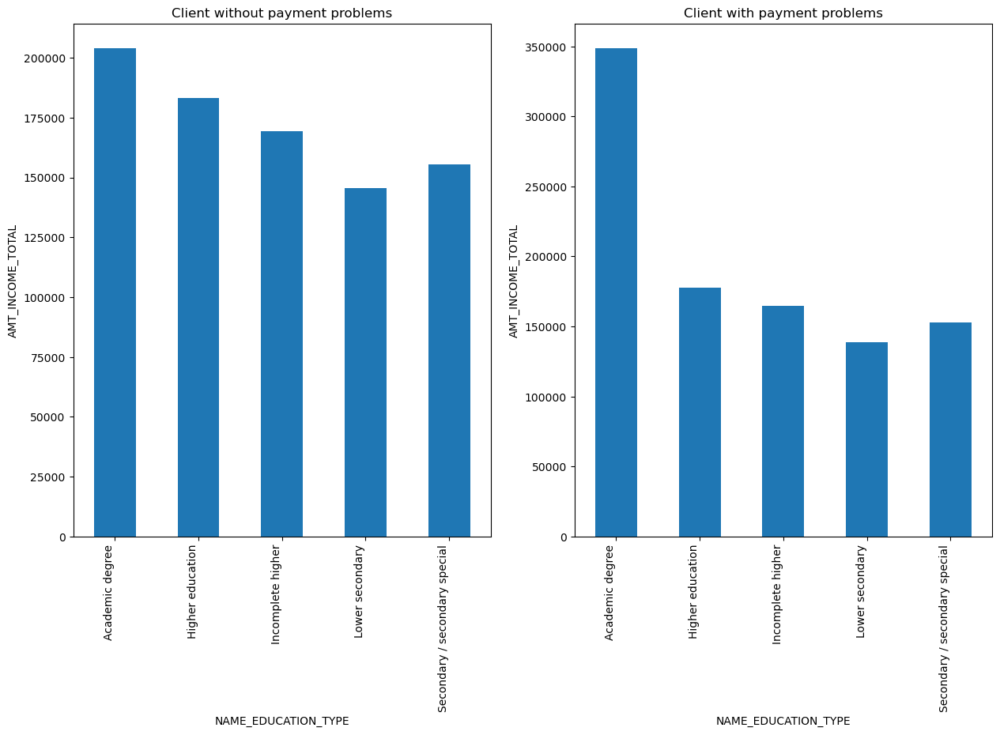

NAME_FAMILY_STATUS


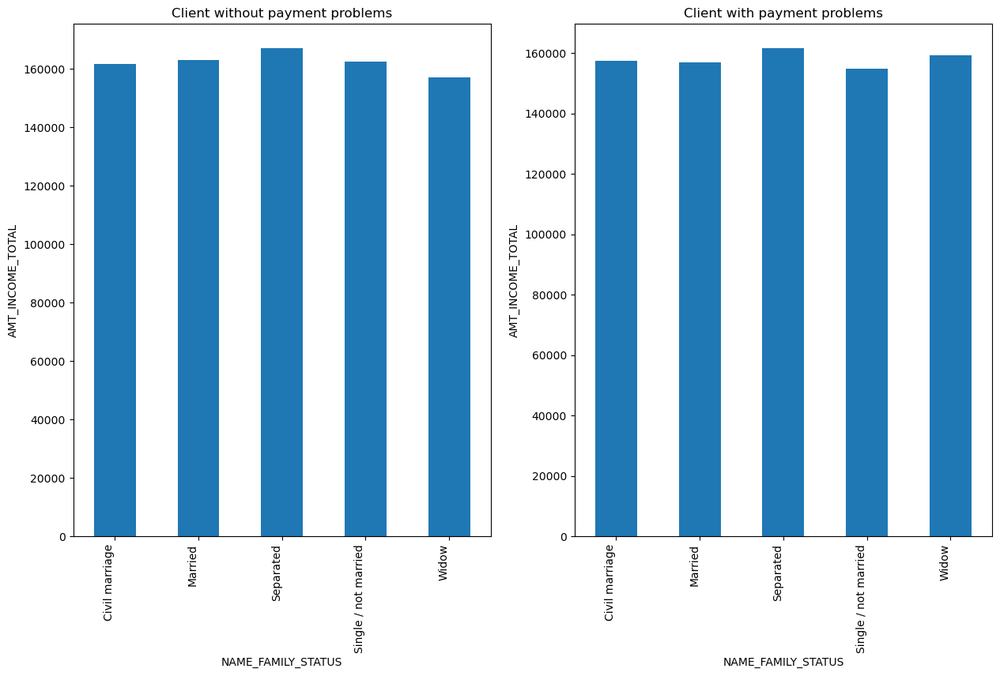

NAME_HOUSING_TYPE


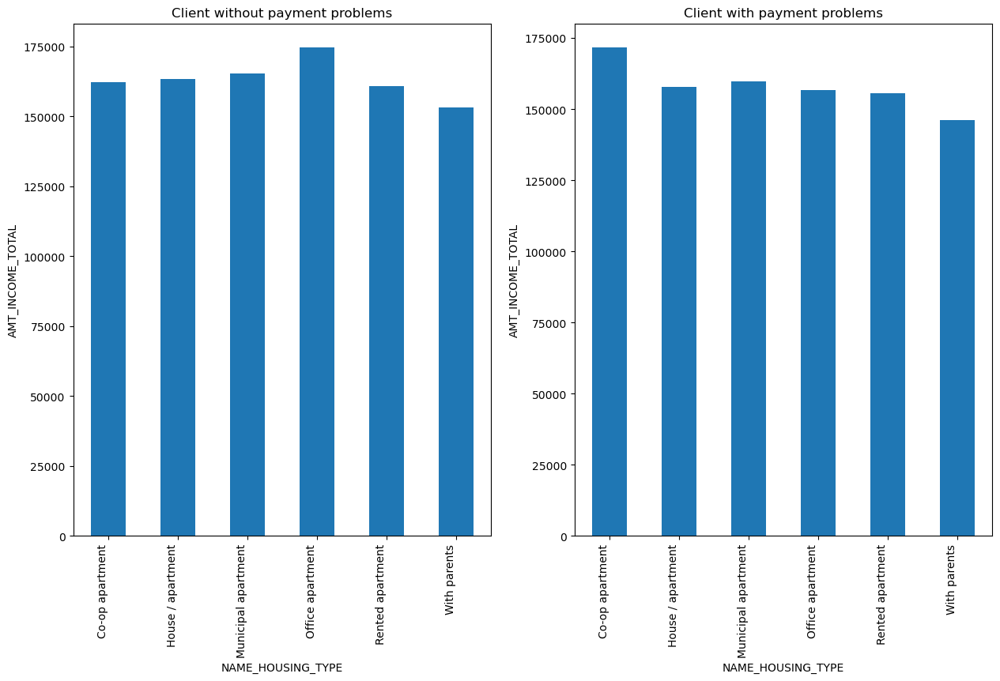

OCCUPATION_TYPE


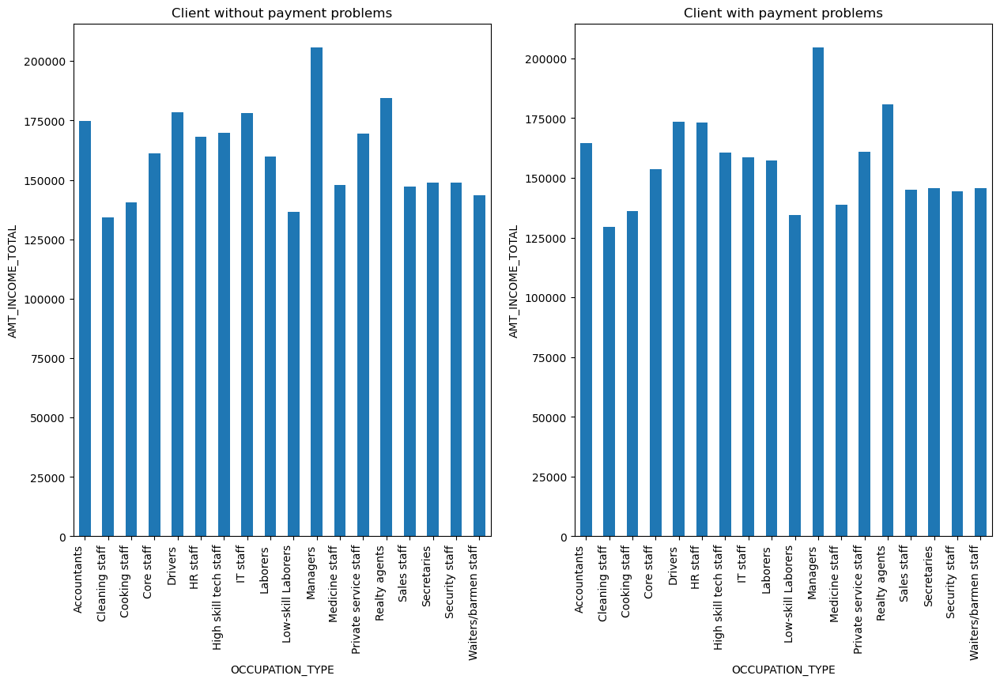

WEEKDAY_APPR_PROCESS_START


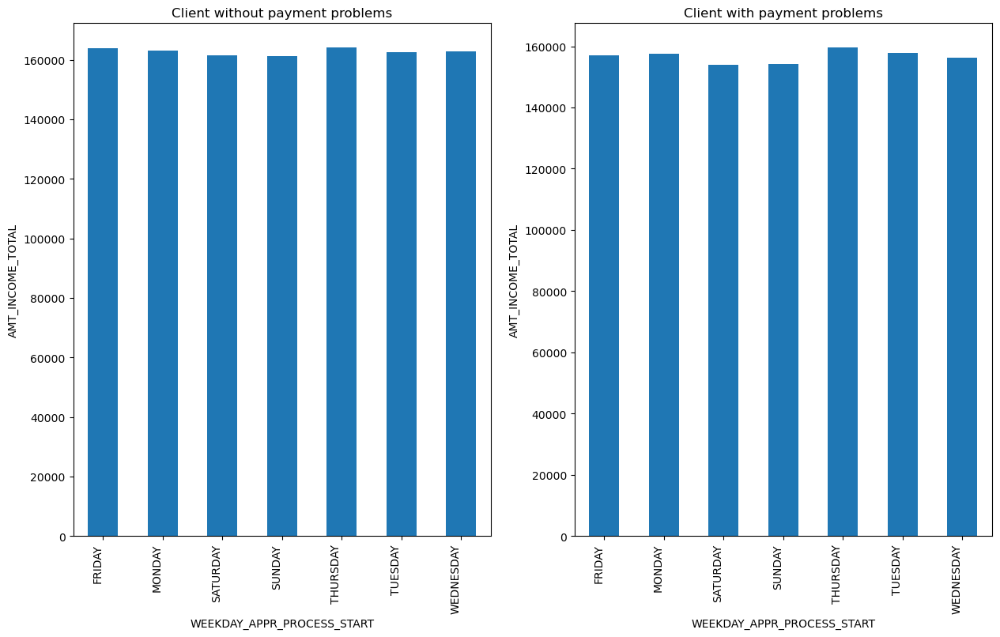

ORGANIZATION_TYPE


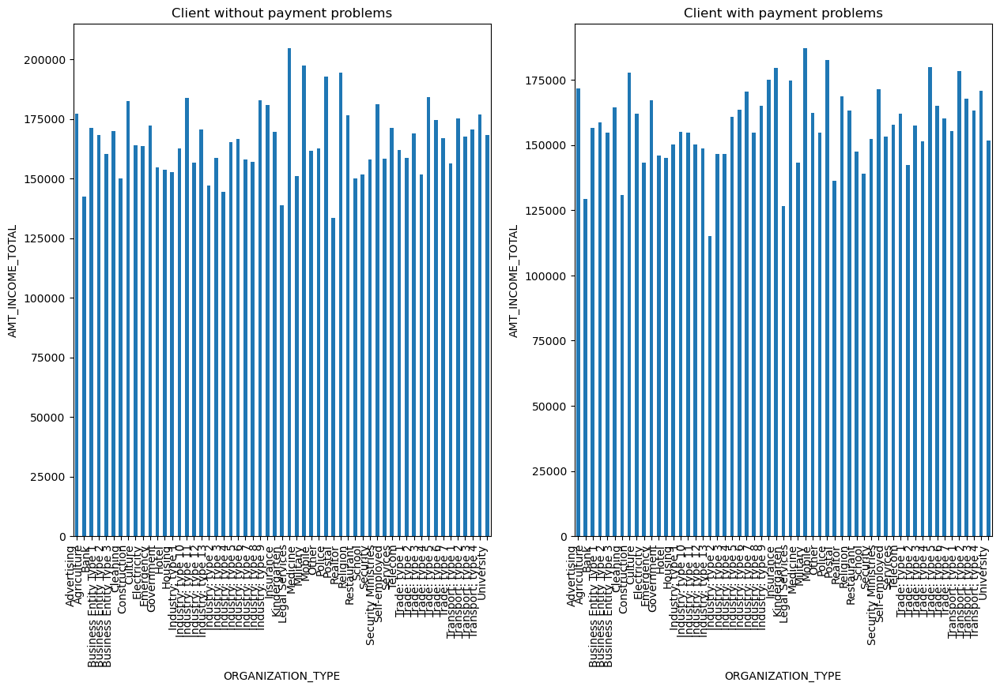

AGE_GROUP


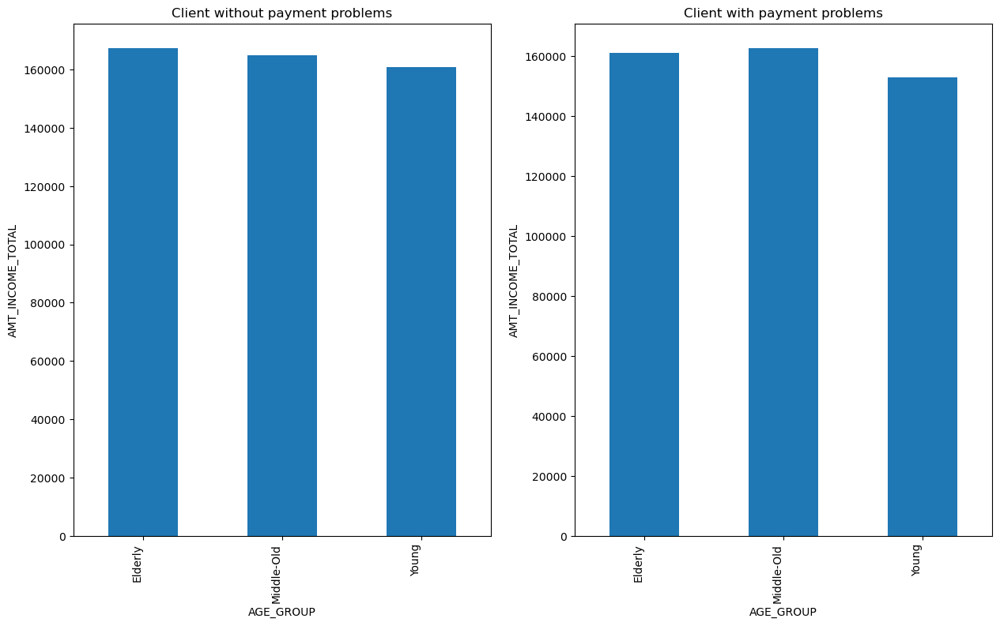

INCOME_GROUP


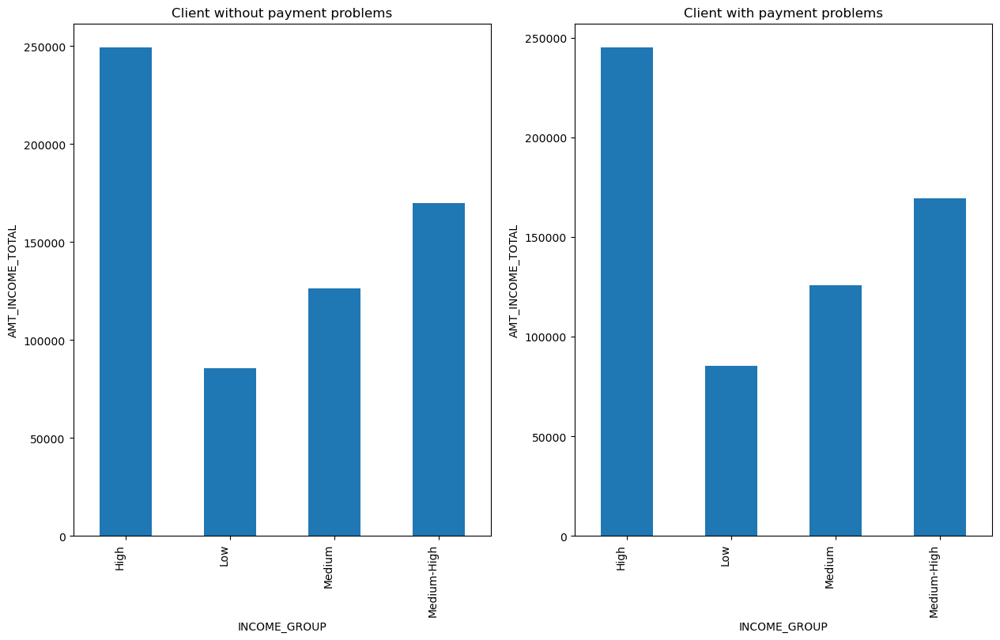

CREDIT_GROUP


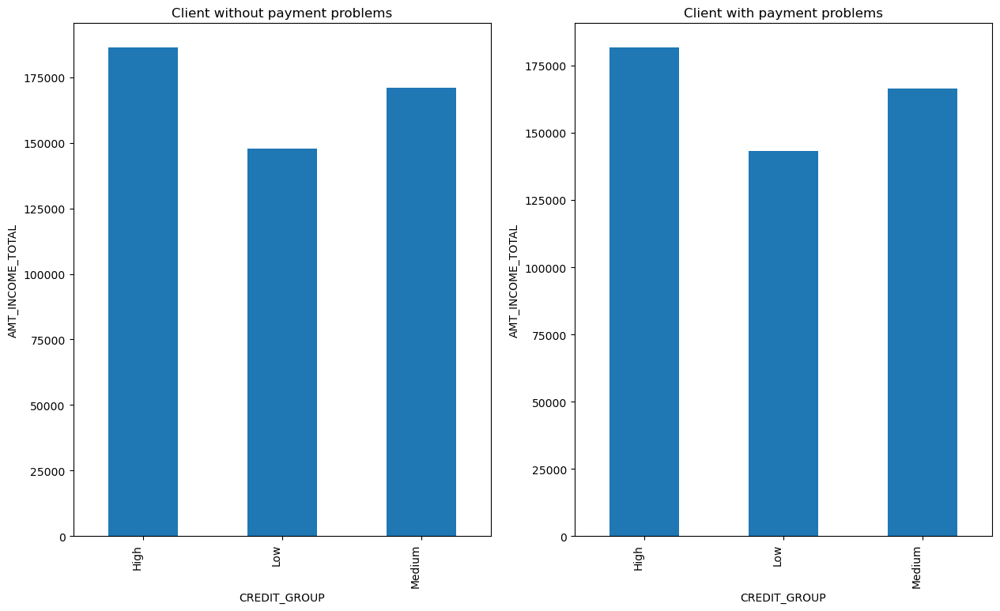

In [1586]:
 check_bivariate_barplot(application_df_target0,application_df_target1,['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AGE_GROUP',
       'INCOME_GROUP', 'CREDIT_GROUP'],'AMT_INCOME_TOTAL')

In [ ]:
# from the above graphs we can see
# 1. Clients having academic degree had the most income.

# B. Multi-Variate Analysis

Text(0, 0.5, 'TARGET')

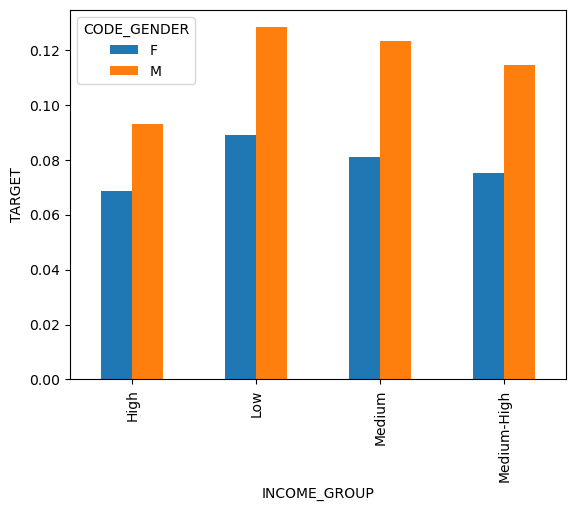

In [1587]:
application_df.pivot_table(values='TARGET',index='INCOME_GROUP',columns='CODE_GENDER',aggfunc='mean').plot.bar()
plt.xlabel('INCOME_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the MALE clients have more difficulties in payment of loan in all income groups

Text(0, 0.5, 'TARGET')

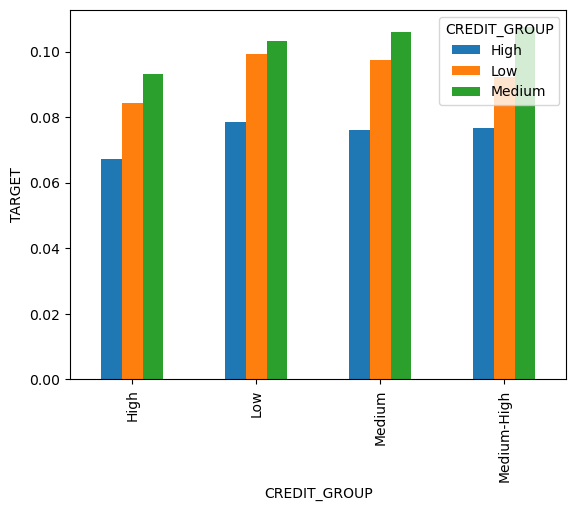

In [1588]:
application_df.pivot_table(values='TARGET',index='INCOME_GROUP',columns='CREDIT_GROUP',aggfunc='mean').plot.bar()
plt.xlabel('INCOME_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the medium credit amount group clients have more difficulties in payment of loan in all income groups

Text(0, 0.5, 'TARGET')

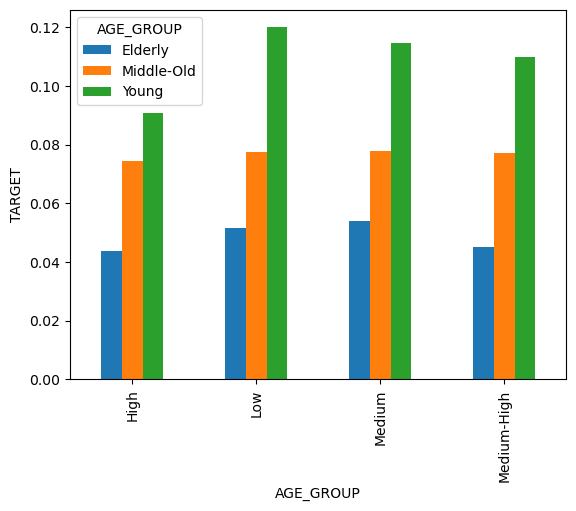

In [1589]:
application_df.pivot_table(values='TARGET',index='INCOME_GROUP',columns='AGE_GROUP',aggfunc='mean').plot.bar()
plt.xlabel('INCOME_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the young age group clients have more difficulties in payment of loan in all income groups

Text(0, 0.5, 'TARGET')

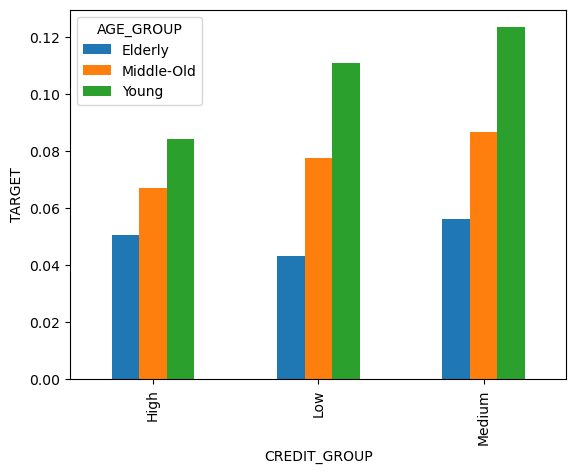

In [1590]:
application_df.pivot_table(values='TARGET',index='CREDIT_GROUP',columns='AGE_GROUP',aggfunc='mean').plot.bar()
plt.xlabel('CREDIT_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the young age group clients have more difficulties in payment of loan in all credit groups

Text(0, 0.5, 'TARGET')

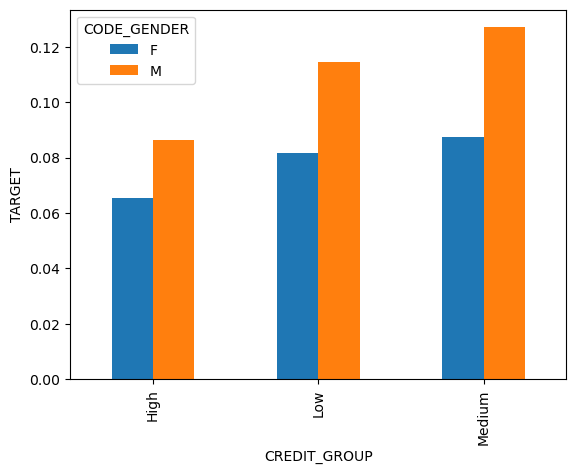

In [1591]:
application_df.pivot_table(values='TARGET',index='CREDIT_GROUP',columns='CODE_GENDER',aggfunc='mean').plot.bar()
plt.xlabel('CREDIT_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the MALE clients have more difficulties in payment of loan in all credit groups

Text(0, 0.5, 'TARGET')

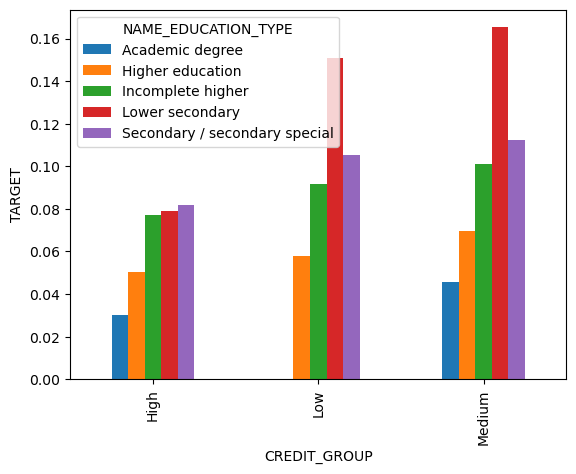

In [1592]:
application_df.pivot_table(values='TARGET',index='CREDIT_GROUP',columns='NAME_EDUCATION_TYPE',aggfunc='mean').plot.bar()
plt.xlabel('CREDIT_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that the clients with education as lowers secondary or secondary have more difficulties in payment of loan in all credit groups

Text(0, 0.5, 'TARGET')

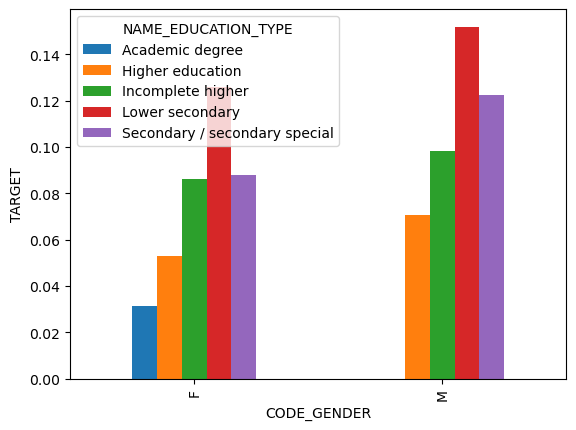

In [1593]:
application_df.pivot_table(values='TARGET',index='CODE_GENDER',columns='NAME_EDUCATION_TYPE',aggfunc='mean').plot.bar()
plt.xlabel('CODE_GENDER')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that most of the clients having payment difficulties of both gender are having a lower secondary education 

Text(0, 0.5, 'TARGET')

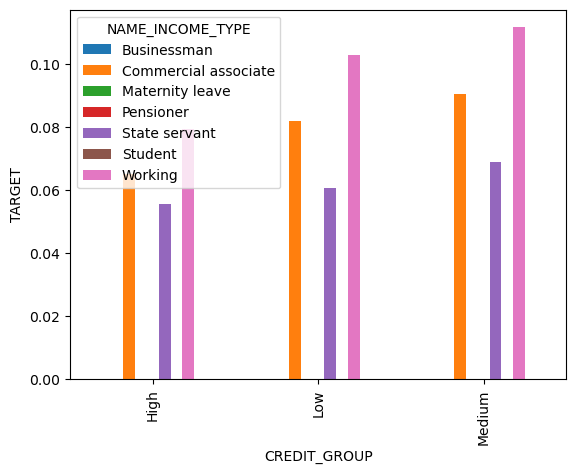

In [1595]:
application_df.pivot_table(values='TARGET',index='CREDIT_GROUP',columns='NAME_INCOME_TYPE',aggfunc='mean').plot.bar()
plt.xlabel('CREDIT_GROUP')
plt.ylabel('TARGET')

In [ ]:
# from above we can see that most of the clients having payment difficulties have income type as working or state servant or commercial associate in all credit groups 

In [1598]:
# reading the previous application dataset
prev_application_df=pd.read_csv(r'C:\Users\ashis\OneDrive\Desktop\Assignment\Credit EDA\previous_application.csv')

In [1599]:
# checking shape of the dateset
rev_application_df.shape

(1670214, 37)

In [1600]:
# checking data ty[e of all columns
prev_application_df.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [1601]:
# checking columns with null values
prev_application_df.isnull().sum().sort_values(ascending=False)*100/prev_application_df.shape[0]

RATE_INTEREST_PRIVILEGED       99.643698
RATE_INTEREST_PRIMARY          99.643698
AMT_DOWN_PAYMENT               53.636480
RATE_DOWN_PAYMENT              53.636480
NAME_TYPE_SUITE                49.119754
NFLAG_INSURED_ON_APPROVAL      40.298129
DAYS_TERMINATION               40.298129
DAYS_LAST_DUE                  40.298129
DAYS_LAST_DUE_1ST_VERSION      40.298129
DAYS_FIRST_DUE                 40.298129
DAYS_FIRST_DRAWING             40.298129
AMT_GOODS_PRICE                23.081773
AMT_ANNUITY                    22.286665
CNT_PAYMENT                    22.286366
PRODUCT_COMBINATION             0.020716
AMT_CREDIT                      0.000060
NAME_YIELD_GROUP                0.000000
NAME_PORTFOLIO                  0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
SK_ID_PREV                      0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE

In [1602]:
# seperating columns with null values more than 40 %
prev_application_null_values_perc=prev_application_df.isnull().sum().sort_values(ascending=0)*100/prev_application_df.shape[0]
prev_application_columns_with_40_perc_null_values = prev_application_null_values_perc[prev_application_null_values_perc >= 40].index

In [1603]:
prev_application_columns_with_40_perc_null_values

Index(['RATE_INTEREST_PRIVILEGED', 'RATE_INTEREST_PRIMARY', 'AMT_DOWN_PAYMENT',
       'RATE_DOWN_PAYMENT', 'NAME_TYPE_SUITE', 'NFLAG_INSURED_ON_APPROVAL',
       'DAYS_TERMINATION', 'DAYS_LAST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_FIRST_DUE', 'DAYS_FIRST_DRAWING'],
      dtype='object')

In [1604]:
# drop the columns having more than 40% null values since these values are completely missing at random and these will not contribute to the analysis as well 
prev_application_df.drop(prev_application_columns_with_40_perc_null_values,axis=1,inplace=True)

In [1605]:
prev_application_df.isnull().sum().sort_values(ascending=False)*100/prev_application_df.shape[0]

AMT_GOODS_PRICE                23.081773
AMT_ANNUITY                    22.286665
CNT_PAYMENT                    22.286366
PRODUCT_COMBINATION             0.020716
AMT_CREDIT                      0.000060
CODE_REJECT_REASON              0.000000
NAME_YIELD_GROUP                0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
NAME_PORTFOLIO                  0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE                0.000000
SK_ID_PREV                      0.000000
NAME_PAYMENT_TYPE               0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_STATUS            0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
AMT_APPLICATION                 0.000000
NAME_CONTRACT_TY

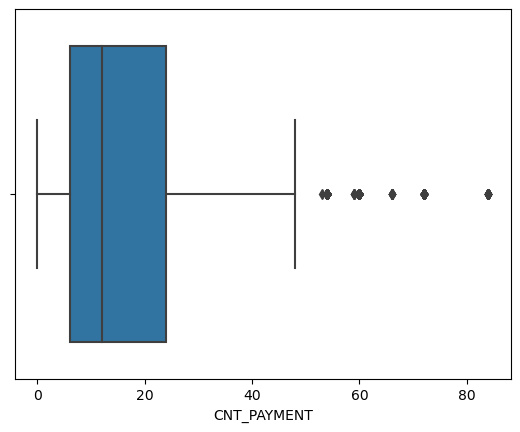

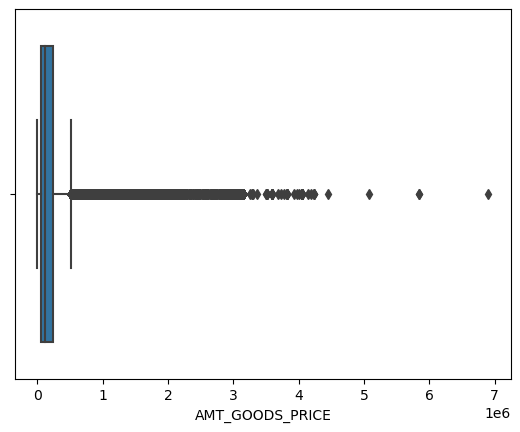

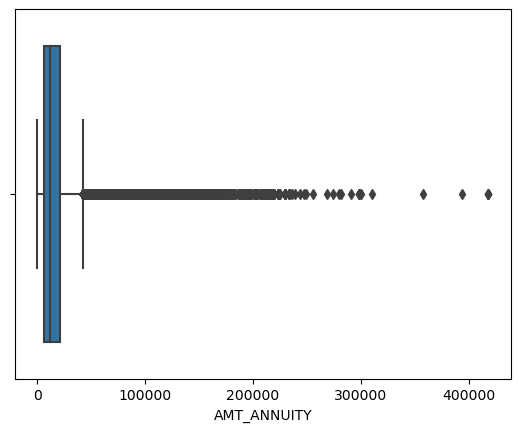

In [1606]:
# checking outlier on numerical columns
check_columns=['CNT_PAYMENT','AMT_GOODS_PRICE','AMT_ANNUITY']
check_outliers(prev_application_df,check_columns)

In [1607]:
# since there  are outlier in these columns we willreplace these values with the median values of the respective columns
CNT_PAYMENT_median=prev_application_df['CNT_PAYMENT'].median()
AMT_GOODS_PRICE_median=prev_application_df['AMT_GOODS_PRICE'].median()
AMT_ANNUITY_median=prev_application_df['AMT_ANNUITY'].median()
prev_application_df['CNT_PAYMENT'].fillna(CNT_PAYMENT_median,inplace=True)
prev_application_df['AMT_GOODS_PRICE'].fillna(AMT_GOODS_PRICE_median,inplace=True)
prev_application_df['AMT_ANNUITY'].fillna(AMT_ANNUITY_median,inplace=True)



In [1608]:
prev_application_df.isnull().sum()

SK_ID_PREV                       0
SK_ID_CURR                       0
NAME_CONTRACT_TYPE               0
AMT_ANNUITY                      0
AMT_APPLICATION                  0
AMT_CREDIT                       1
AMT_GOODS_PRICE                  0
WEEKDAY_APPR_PROCESS_START       0
HOUR_APPR_PROCESS_START          0
FLAG_LAST_APPL_PER_CONTRACT      0
NFLAG_LAST_APPL_IN_DAY           0
NAME_CASH_LOAN_PURPOSE           0
NAME_CONTRACT_STATUS             0
DAYS_DECISION                    0
NAME_PAYMENT_TYPE                0
CODE_REJECT_REASON               0
NAME_CLIENT_TYPE                 0
NAME_GOODS_CATEGORY              0
NAME_PORTFOLIO                   0
NAME_PRODUCT_TYPE                0
CHANNEL_TYPE                     0
SELLERPLACE_AREA                 0
NAME_SELLER_INDUSTRY             0
CNT_PAYMENT                      0
NAME_YIELD_GROUP                 0
PRODUCT_COMBINATION            346
dtype: int64

In [1609]:
#since the percentage of null values in columns PRODUCT_COMBINATION and AMT_CREDIT is very less we can delete the rows with null values
prev_application_df.dropna(subset=['PRODUCT_COMBINATION','AMT_CREDIT'],inplace=True)

In [1610]:
prev_application_df.isnull().sum()

SK_ID_PREV                     0
SK_ID_CURR                     0
NAME_CONTRACT_TYPE             0
AMT_ANNUITY                    0
AMT_APPLICATION                0
AMT_CREDIT                     0
AMT_GOODS_PRICE                0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
FLAG_LAST_APPL_PER_CONTRACT    0
NFLAG_LAST_APPL_IN_DAY         0
NAME_CASH_LOAN_PURPOSE         0
NAME_CONTRACT_STATUS           0
DAYS_DECISION                  0
NAME_PAYMENT_TYPE              0
CODE_REJECT_REASON             0
NAME_CLIENT_TYPE               0
NAME_GOODS_CATEGORY            0
NAME_PORTFOLIO                 0
NAME_PRODUCT_TYPE              0
CHANNEL_TYPE                   0
SELLERPLACE_AREA               0
NAME_SELLER_INDUSTRY           0
CNT_PAYMENT                    0
NAME_YIELD_GROUP               0
PRODUCT_COMBINATION            0
dtype: int64

In [1611]:
# seperating numeric and categorical columns
prev_application_df_numeric = prev_application_df.select_dtypes(include=[np.number])
prev_application_df_categorical = prev_application_df.select_dtypes(exclude=[np.number])

In [1612]:
prev_application_df_numeric

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT
0,2030495,271877,1730.430,17145.0,17145.0,17145.0,15,1,-73,35,12.0
1,2802425,108129,25188.615,607500.0,679671.0,607500.0,11,1,-164,-1,36.0
2,2523466,122040,15060.735,112500.0,136444.5,112500.0,11,1,-301,-1,12.0
3,2819243,176158,47041.335,450000.0,470790.0,450000.0,7,1,-512,-1,12.0
4,1784265,202054,31924.395,337500.0,404055.0,337500.0,9,1,-781,-1,24.0
...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,14704.290,267295.5,311400.0,267295.5,12,1,-544,43,30.0
1670210,2357031,334635,6622.020,87750.0,64291.5,87750.0,15,1,-1694,43,12.0
1670211,2659632,249544,11520.855,105237.0,102523.5,105237.0,12,1,-1488,1370,10.0
1670212,2785582,400317,18821.520,180000.0,191880.0,180000.0,9,1,-1185,-1,12.0


In [1613]:
prev_application_df_categorical

,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,Consumer loans,SATURDAY,Y,XAP,Approved,Cash through the bank,XAP,Repeater,Mobile,POS,XNA,Country-wide,Connectivity,middle,POS mobile with interest
1,Cash loans,THURSDAY,Y,XNA,Approved,XNA,XAP,Repeater,XNA,Cash,x-sell,Contact center,XNA,low_action,Cash X-Sell: low
2,Cash loans,TUESDAY,Y,XNA,Approved,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,high,Cash X-Sell: high
3,Cash loans,MONDAY,Y,XNA,Approved,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,middle,Cash X-Sell: middle
4,Cash loans,THURSDAY,Y,Repairs,Refused,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,XNA,high,Cash Street: high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,Consumer loans,WEDNESDAY,Y,XAP,Approved,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,Furniture,low_normal,POS industry with interest
1670210,Consumer loans,TUESDAY,Y,XAP,Approved,Cash through the bank,XAP,New,Furniture,POS,XNA,Stone,Furniture,middle,POS industry with interest
1670211,Consumer loans,MONDAY,Y,XAP,Approved,Cash through the bank,XAP,Repeater,Consumer Electronics,POS,XNA,Country-wide,Consumer electronics,low_normal,POS household with interest
1670212,Cash loans,WEDNESDAY,Y,XNA,Approved,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),XNA,low_normal,Cash X-Sell: low


In [1617]:
# checking for any vague entries in categorical columns
for column in prev_application_df_categorical.columns:
    print(column)
    print(prev_application_df_categorical[column].value_counts(normalize=True))

NAME_CONTRACT_TYPE
Cash loans         0.447672
Consumer loans     0.436652
Revolving loans    0.115676
Name: NAME_CONTRACT_TYPE, dtype: float64
WEEKDAY_APPR_PROCESS_START
TUESDAY      0.152743
WEDNESDAY    0.152681
MONDAY       0.151815
FRIDAY       0.150901
THURSDAY     0.149141
SATURDAY     0.144074
SUNDAY       0.098646
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64
FLAG_LAST_APPL_PER_CONTRACT
Y    0.994925
N    0.005075
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: float64
NAME_CASH_LOAN_PURPOSE
XAP                                 0.552328
XNA                                 0.405971
Repairs                             0.014232
Other                               0.009347
Urgent needs                        0.005038
Buying a used car                   0.001729
Building a house or an annex        0.001613
Everyday expenses                   0.001447
Medicine                            0.001302
Payments on other loans             0.001156
Education                           0.000942
Jo

In [1618]:
# replacing XAP and XNA values with null values
for column in prev_application_df_categorical.columns:
    print(column)
    prev_application_df[column].replace('XNA',np.nan,inplace=True)
    prev_application_df[column].replace('XAP',np.nan,inplace=True)
    

NAME_CONTRACT_TYPE
WEEKDAY_APPR_PROCESS_START
FLAG_LAST_APPL_PER_CONTRACT
NAME_CASH_LOAN_PURPOSE
NAME_CONTRACT_STATUS
NAME_PAYMENT_TYPE
CODE_REJECT_REASON
NAME_CLIENT_TYPE
NAME_GOODS_CATEGORY
NAME_PORTFOLIO
NAME_PRODUCT_TYPE
CHANNEL_TYPE
NAME_SELLER_INDUSTRY
NAME_YIELD_GROUP
PRODUCT_COMBINATION


In [1619]:
prev_application_df.isnull().sum().sort_values(ascending=False)*100/prev_application_df.shape[0]

NAME_CASH_LOAN_PURPOSE         95.829907
CODE_REJECT_REASON             81.324980
NAME_PRODUCT_TYPE              63.676928
NAME_GOODS_CATEGORY            56.918425
NAME_SELLER_INDUSTRY           51.244560
NAME_PAYMENT_TYPE              37.550116
NAME_YIELD_GROUP               30.952645
NAME_PORTFOLIO                 22.270277
NAME_CLIENT_TYPE                0.116237
SK_ID_PREV                      0.000000
CNT_PAYMENT                     0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
DAYS_DECISION                   0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_STATUS            0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
AMT_GOODS_PRICE                 0.000000
AMT_CREDIT                      0.000000
AMT_APPLICATION                 0.000000
AMT_ANNUITY                     0.000000
NAME_CONTRACT_TY

In [1620]:
#deletin the columns with xna/xap, values more than 30%
prev_application_df.drop(['NAME_CASH_LOAN_PURPOSE','NAME_PAYMENT_TYPE',"NAME_GOODS_CATEGORY","NAME_PRODUCT_TYPE","NAME_SELLER_INDUSTRY","CODE_REJECT_REASON",'NAME_YIELD_GROUP'],axis=1,inplace=True)

In [1621]:
prev_application_df.isnull().sum().sort_values(ascending=False)*100/prev_application_df.shape[0]

NAME_PORTFOLIO                 22.270277
NAME_CLIENT_TYPE                0.116237
SK_ID_PREV                      0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
CNT_PAYMENT                     0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
DAYS_DECISION                   0.000000
NAME_CONTRACT_STATUS            0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
SK_ID_CURR                      0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
AMT_GOODS_PRICE                 0.000000
AMT_CREDIT                      0.000000
AMT_APPLICATION                 0.000000
AMT_ANNUITY                     0.000000
NAME_CONTRACT_TYPE              0.000000
PRODUCT_COMBINATION             0.000000
dtype: float64

In [1622]:
prev_application_df['NAME_PORTFOLIO'].value_counts()

POS      691011
Cash     461563
Cards    144984
Cars        425
Name: NAME_PORTFOLIO, dtype: int64

In [1623]:
#sice cars mentioned in the descriptionfile not replacing car with cards
#delete null entries from columns NAME_PORTFOLIO AND NAME_CLIENT_TYPE
prev_application_df.dropna(subset=['NAME_PORTFOLIO','NAME_CLIENT_TYPE'],inplace=True)

In [1624]:
# checking any null calue still exisits
prev_application_df.isnull().sum().sort_values(ascending=False)*100/prev_application_df.shape[0]

SK_ID_PREV                     0.0
NFLAG_LAST_APPL_IN_DAY         0.0
CNT_PAYMENT                    0.0
SELLERPLACE_AREA               0.0
CHANNEL_TYPE                   0.0
NAME_PORTFOLIO                 0.0
NAME_CLIENT_TYPE               0.0
DAYS_DECISION                  0.0
NAME_CONTRACT_STATUS           0.0
FLAG_LAST_APPL_PER_CONTRACT    0.0
SK_ID_CURR                     0.0
HOUR_APPR_PROCESS_START        0.0
WEEKDAY_APPR_PROCESS_START     0.0
AMT_GOODS_PRICE                0.0
AMT_CREDIT                     0.0
AMT_APPLICATION                0.0
AMT_ANNUITY                    0.0
NAME_CONTRACT_TYPE             0.0
PRODUCT_COMBINATION            0.0
dtype: float64

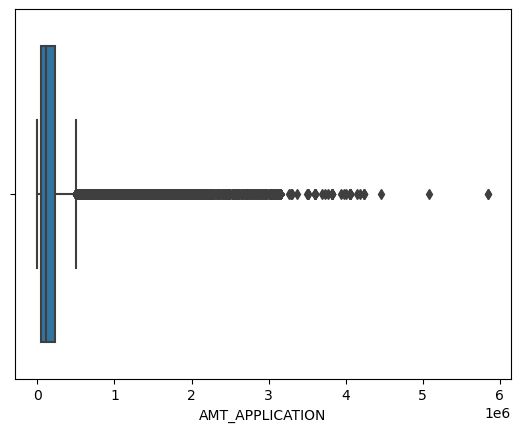

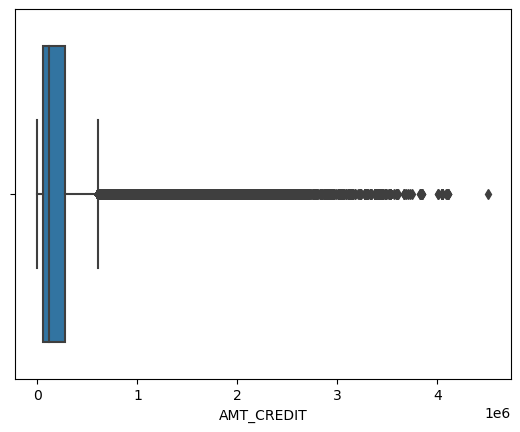

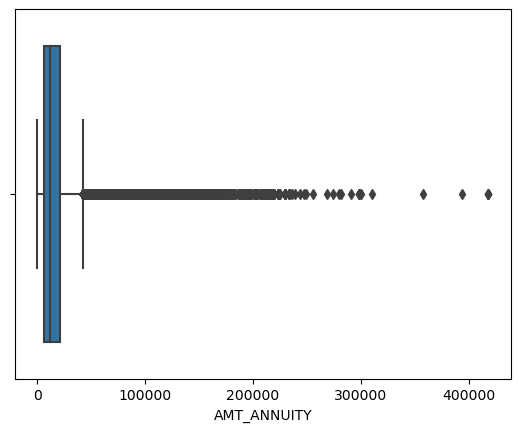

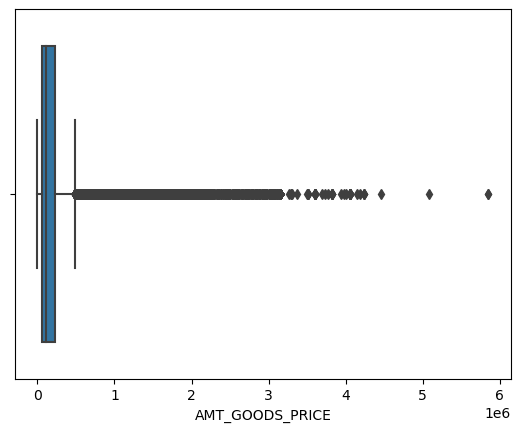

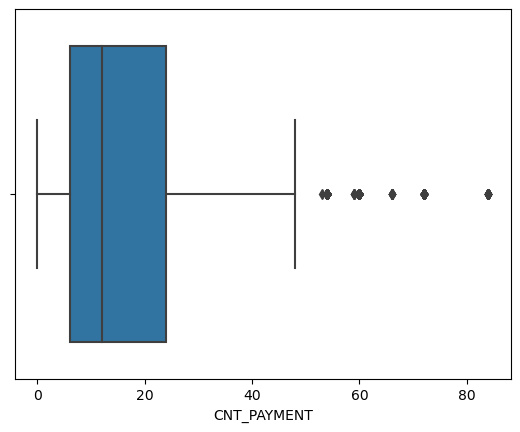

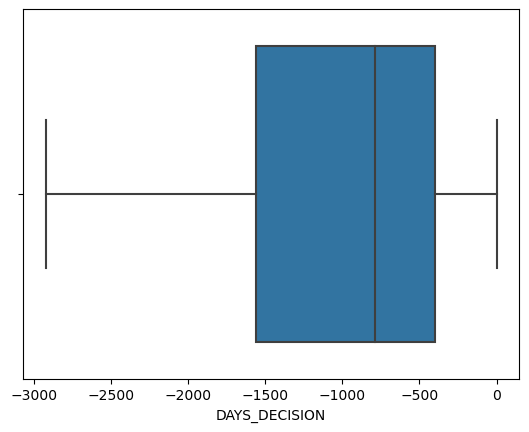

In [1625]:
# Checing outliers in all numeric columns
check_columns=['AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','CNT_PAYMENT','DAYS_DECISION']
check_outliers(prev_application_df,check_columns)

In [1626]:
#removing outlier in the numeric columns
for column in ['AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','CNT_PAYMENT','DAYS_DECISION']:
    u,l=upper_lower_limit(prev_application_df,column)
    prev_application_df.drop(prev_application_df[(prev_application_df[column]>u) | (prev_application_df[column]<l)].index,inplace=True)

In [1627]:
prev_application_df

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_CLIENT_TYPE,NAME_PORTFOLIO,CHANNEL_TYPE,SELLERPLACE_AREA,CNT_PAYMENT,PRODUCT_COMBINATION
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,Approved,-73,Repeater,POS,Country-wide,35,12.0,POS mobile with interest
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,Approved,-301,Repeater,Cash,Credit and cash offices,-1,12.0,Cash X-Sell: high
13,1397919,321676,Consumer loans,7654.860,53779.5,57564.0,53779.5,SUNDAY,15,Y,1,Approved,-408,New,POS,Country-wide,200,8.0,POS household without interest
14,2273188,270658,Consumer loans,9644.220,26550.0,27252.0,26550.0,SATURDAY,10,Y,1,Approved,-726,New,POS,Stone,83,3.0,POS household with interest
15,1232483,151612,Consumer loans,21307.455,126490.5,119853.0,126490.5,TUESDAY,7,Y,1,Approved,-699,New,POS,Regional / Local,130,6.0,POS other with interest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670202,2205099,157707,Consumer loans,4334.355,22207.5,23854.5,22207.5,THURSDAY,10,Y,1,Approved,-979,Repeater,POS,Stone,20,6.0,POS industry with interest
1670207,1662353,443544,Cash loans,12607.875,112500.0,112500.0,112500.0,MONDAY,10,Y,1,Refused,-2514,Repeater,Cash,Credit and cash offices,100,12.0,Cash Street: high
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,87750.0,TUESDAY,15,Y,1,Approved,-1694,New,POS,Stone,43,12.0,POS industry with interest
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,105237.0,MONDAY,12,Y,1,Approved,-1488,Repeater,POS,Country-wide,1370,10.0,POS household with interest


In [1629]:
# sepeating dataset columns required for analysis after combining so that there are not duplicate column names
application_df1=application_df[['SK_ID_CURR', 'TARGET' , 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE', 'AGE_GROUP', 'INCOME_GROUP',
       'CREDIT_GROUP']]

In [1630]:
# combining application and previous application datasets in one dataset.
combined_application_df=pd.merge(right=application_df1,left=prev_application_df,how='left',on='SK_ID_CURR')

In [1631]:
combined_application_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_CLIENT_TYPE',
       'NAME_PORTFOLIO', 'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'CNT_PAYMENT',
       'PRODUCT_COMBINATION', 'TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_

In [1632]:
# checking null in combined dataset
combined_application_df.isnull().sum()

SK_ID_PREV                         0
SK_ID_CURR                         0
NAME_CONTRACT_TYPE                 0
AMT_ANNUITY                        0
AMT_APPLICATION                    0
                               ...  
AMT_REQ_CREDIT_BUREAU_YEAR    269983
AGE                           269983
AGE_GROUP                     269983
INCOME_GROUP                  269983
CREDIT_GROUP                  269983
Length: 62, dtype: int64

In [1633]:
# checking null in TARGET column as a lot of ID's in previous dataset may not be present in application dataset
combined_application_df['TARGET'].isnull().sum()

269983

In [1634]:
# seperating combined dataset having target values present
combined_application_df1=combined_application_df[~combined_application_df['TARGET'].isna()]

In [1635]:
combined_application_df1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,...,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,AGE_GROUP,INCOME_GROUP,CREDIT_GROUP
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,40.0,Middle-Old,High,Medium
4,1232483,151612,Consumer loans,21307.455,126490.5,119853.0,126490.5,TUESDAY,7,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,36.0,Young,Medium-High,Medium
5,2163253,154602,Consumer loans,4187.340,26955.0,27297.0,26955.0,SATURDAY,12,Y,...,0.0,0.0,0.0,0.0,1.0,1.0,59.0,Middle-Old,Medium,Low
6,1173070,199178,Cash loans,4666.500,45000.0,49455.0,45000.0,SATURDAY,16,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,65.0,Elderly,High,High
7,1543131,275707,Cash loans,22619.520,229500.0,241920.0,229500.0,THURSDAY,8,Y,...,0.0,0.0,0.0,0.0,0.0,7.0,50.0,Middle-Old,Medium-High,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708906,1077969,242303,Consumer loans,8546.940,37926.0,40932.0,37926.0,THURSDAY,12,Y,...,0.0,0.0,0.0,0.0,0.0,0.0,25.0,Young,Low,Low
708907,1028905,442706,Consumer loans,6127.065,45450.0,54126.0,45450.0,MONDAY,10,Y,...,0.0,0.0,0.0,0.0,0.0,3.0,40.0,Middle-Old,Medium,Medium
708908,2205099,157707,Consumer loans,4334.355,22207.5,23854.5,22207.5,THURSDAY,10,Y,...,0.0,0.0,0.0,0.0,0.0,2.0,41.0,Middle-Old,Medium,Medium
708909,1662353,443544,Cash loans,12607.875,112500.0,112500.0,112500.0,MONDAY,10,Y,...,0.0,0.0,0.0,1.0,0.0,6.0,48.0,Middle-Old,Medium,Medium


In [1636]:
# Divide 'DAYS_DECISION' by 30 to get MONTH_DECISION
combined_application_df1['MONTHS_DECISION'] = abs(combined_application_df1['DAYS_DECISION']//30)

In [1637]:
# seperating dataset into numeric and catagorical data
combined_application_df1_numeric = combined_application_df1.select_dtypes(include=[np.number])
combined_application_df1_categorical = combined_application_df1.select_dtypes(exclude=[np.number])

In [1638]:
# seperating dataset into target 0 and target 1 datasets for analysis 
combined_application_df1_target0= combined_application_df1[combined_application_df1['TARGET']==0]
combined_application_df1_target1 = combined_application_df1[combined_application_df1['TARGET']==1]

# Univariate Analysis

# Unordered  Categorical Variable

In [1639]:
combined_application_df1_categorical.columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO', 'CHANNEL_TYPE',
       'PRODUCT_COMBINATION', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'ORGANIZATION_TYPE', 'AGE_GROUP', 'INCOME_GROUP', 'CREDIT_GROUP'],
      dtype='object')

In [1640]:
combined_application_df1['NAME_CONTRACT_STATUS'].value_counts()

Approved        392028
Refused          45623
Unused offer       661
Canceled           618
Name: NAME_CONTRACT_STATUS, dtype: int64

<AxesSubplot:xlabel='NAME_CONTRACT_STATUS', ylabel='count'>

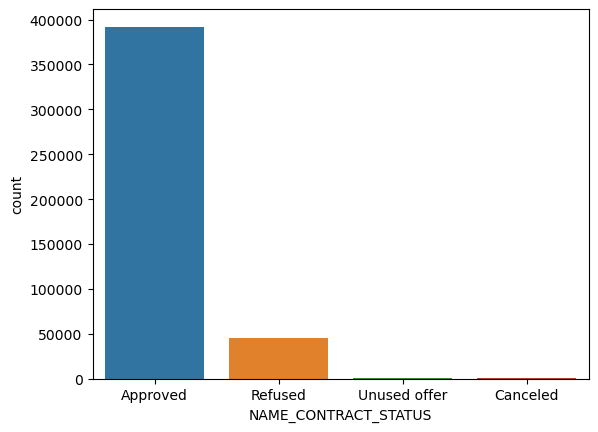

In [1641]:
sns.countplot(data=combined_application_df1,x='NAME_CONTRACT_STATUS')

In [ ]:
# from abvove we can see, the dataset consists of clients with contract status as Approved the most

<AxesSubplot:xlabel='NAME_CLIENT_TYPE', ylabel='count'>

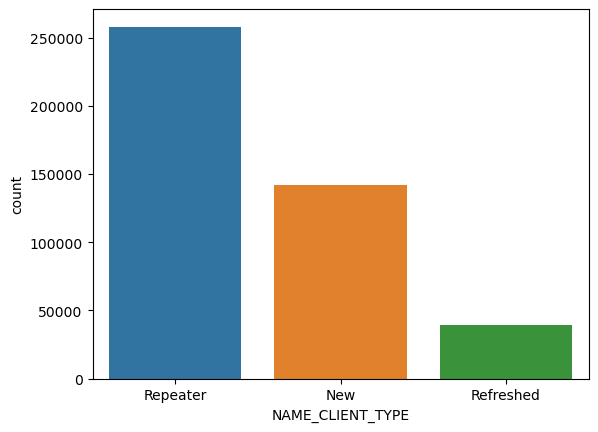

In [1642]:
sns.countplot(data=combined_application_df1,x='NAME_CLIENT_TYPE')

In [ ]:
# from abvove we can see, the dataset consists of clients with cleint type as Repeater the most

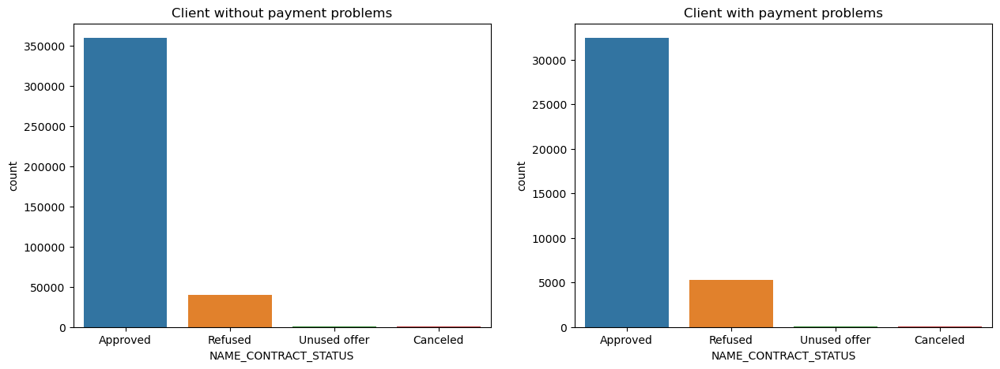

In [1643]:
# checking distribution of contract type for clients
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=combined_application_df1_target0,x='NAME_CONTRACT_STATUS')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=combined_application_df1_target1,x='NAME_CONTRACT_STATUS')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from abvove we can see clients with Approved contract status had the most problems in payment

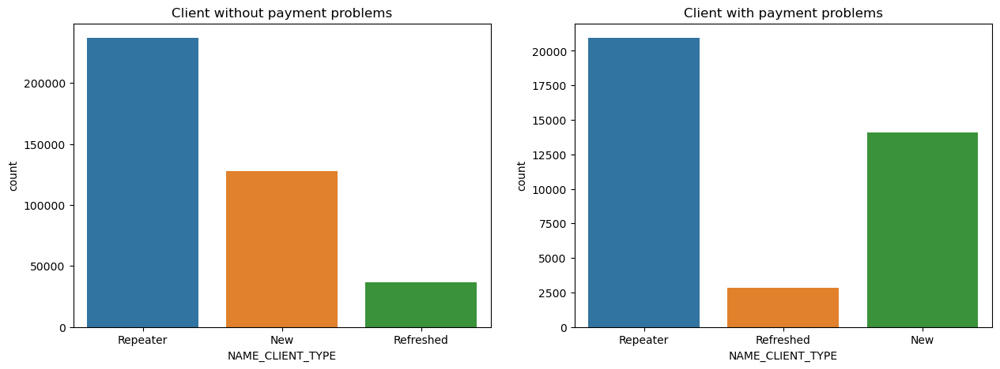

In [1644]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=combined_application_df1_target0,x='NAME_CLIENT_TYPE')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=combined_application_df1_target1,x='NAME_CLIENT_TYPE')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from abvove we can see clients with Repeater in client type had the most problems in payment

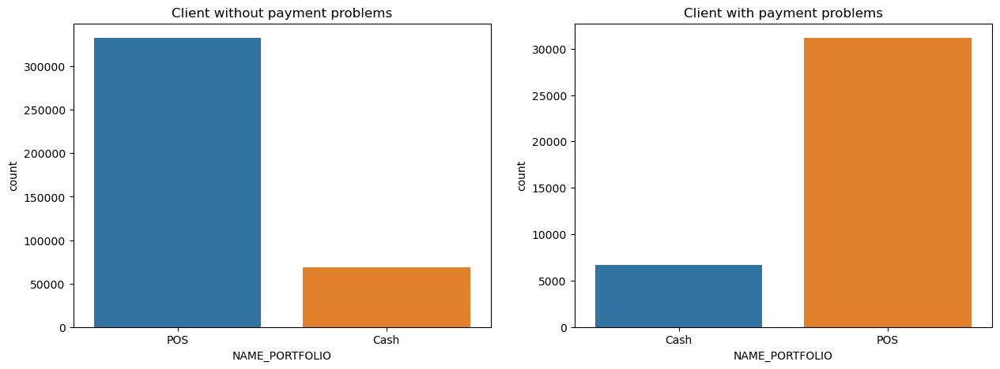

In [1645]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1) 
sns.countplot(data=combined_application_df1_target0,x='NAME_PORTFOLIO')
plt.title('Client without payment problems')

plt.subplot(1,2,2)
sns.countplot(data=combined_application_df1_target1,x='NAME_PORTFOLIO')
plt.title('Client with payment problems')

plt.show()

In [ ]:
# from abvove we can see clients with Portfolio as POS had most payment difficulties

In [1646]:
combined_application_df1['NAME_PORTFOLIO'].value_counts()

POS     363870
Cash     75060
Name: NAME_PORTFOLIO, dtype: int64

# Numerical Variable

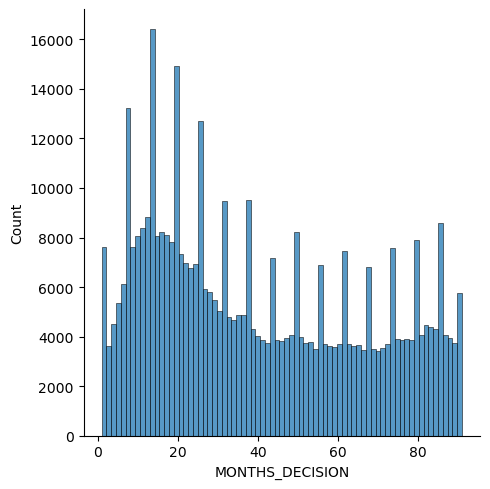

In [1647]:
sns.displot(data=combined_application_df1,x='MONTHS_DECISION')

In [ ]:
# from abvove we can see majority of application decision took around 20 days while the max goes beyong 80 days.

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='Density'>

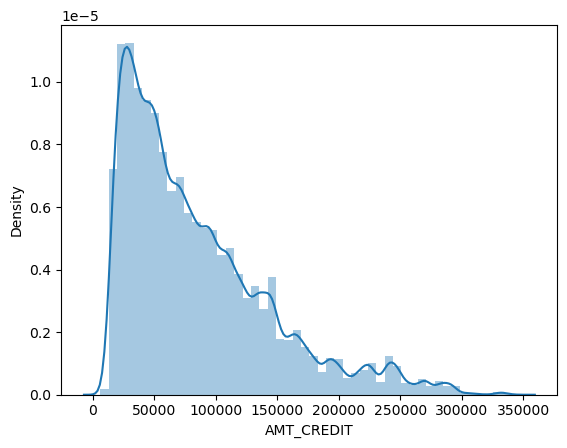

In [1648]:
sns.distplot(combined_application_df1['AMT_CREDIT'])

In [ ]:
# from abvove we can see majority of applications had credit aount in the lower range.

<AxesSubplot:xlabel='AMT_APPLICATION', ylabel='Density'>

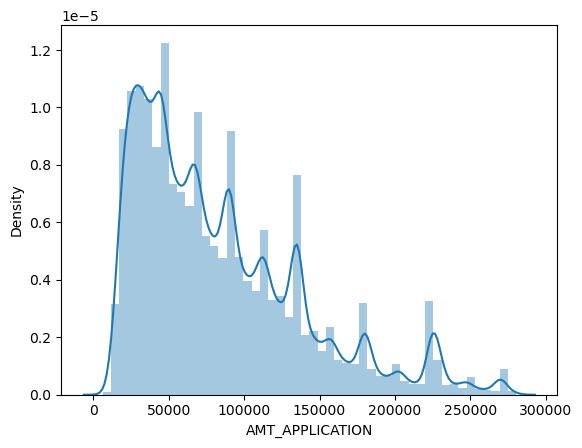

In [1649]:
sns.distplot(combined_application_df1['AMT_APPLICATION'])

In [ ]:
# from abvove we can see majority of applications had asked credit amount in the lower range.

In [1651]:
combined_application_df1_numeric.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START',
       'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA',
       'CNT_PAYMENT', 'TARGET', 'CNT_CHILDREN', 'REGION_POPULATION_RELATIVE',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       

<AxesSubplot:>

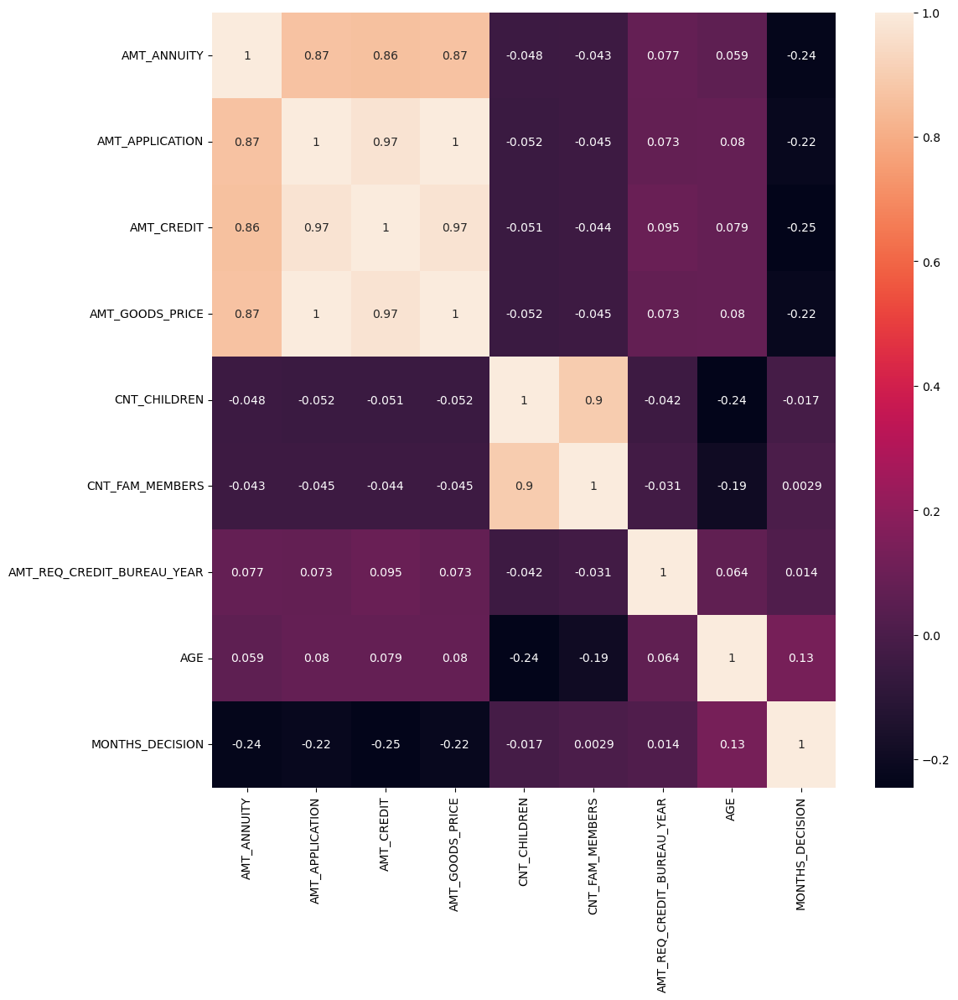

In [1673]:
# finding correlation between numerci variables
plt.figure(figsize=(12,12))
sns.heatmap(combined_application_df1_target0[['AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_CHILDREN',
       'CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE', 'MONTHS_DECISION']].corr(),annot=True)


<AxesSubplot:>

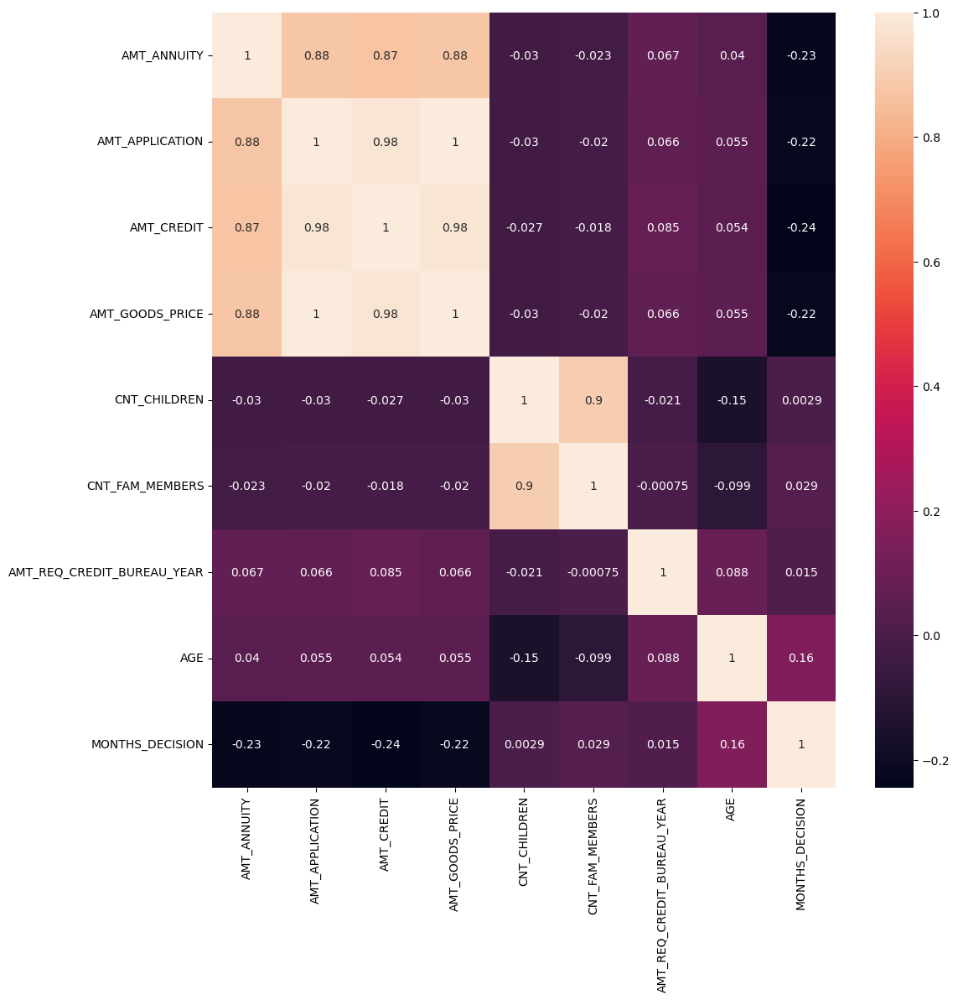

In [1674]:
# finding correlation between numerci variables
plt.figure(figsize=(12,12))
sns.heatmap(combined_application_df1_target1[['AMT_ANNUITY', 'AMT_APPLICATION',
       'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_CHILDREN',
       'CNT_FAM_MEMBERS','AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE', 'MONTHS_DECISION']].corr(),annot=True)

In [ ]:
# from the avbove two correlation plot for both o anf 1 taget we get high correlation between
1. AMT_ANNUITY and AMT_APPPLICATION
2. AMT_ANNUITY and AMT_CREDIT
3. AMT_ANNUITY and AMT_GOODS_PRICE
4. AMT_APPPLICATION and AMT_CREDIT
5. AMT_APPPLICATION and AMT_GOODS_PRICE
6. AMT_CREDIT and AMT_GOODS_PRICE

# Bi-variate Analysis

<AxesSubplot:xlabel='AMT_APPLICATION', ylabel='AMT_CREDIT'>

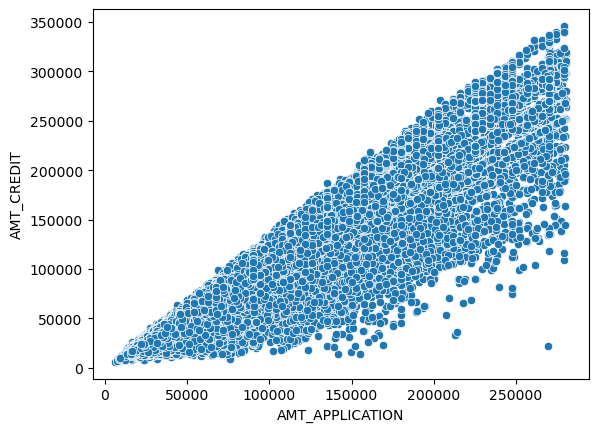

In [1653]:
sns.scatterplot(data=combined_application_df1,x='AMT_APPLICATION',y='AMT_CREDIT')

In [ ]:
# from above scatter plot we can se that the AMT_CREDIT increases as the AMT _APPLICATION increases

<AxesSubplot:xlabel='AMT_APPLICATION', ylabel='AMT_ANNUITY'>

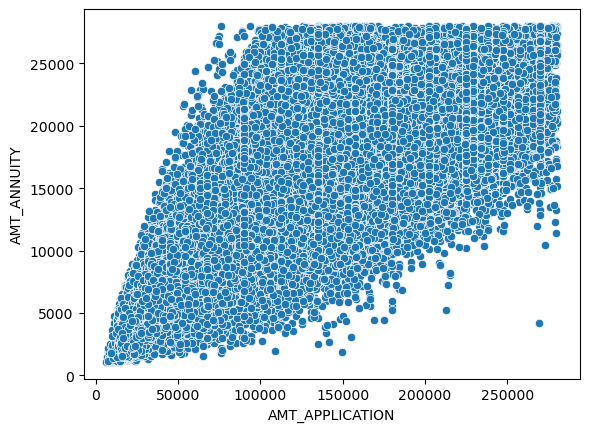

In [1654]:
sns.scatterplot(data=combined_application_df1,x='AMT_APPLICATION',y='AMT_ANNUITY')

In [ ]:
# from above scatter plot we can se that the AMT_ANNUITY increases as the AMT _APPLICATION increases

<AxesSubplot:xlabel='AMT_APPLICATION', ylabel='MONTHS_DECISION'>

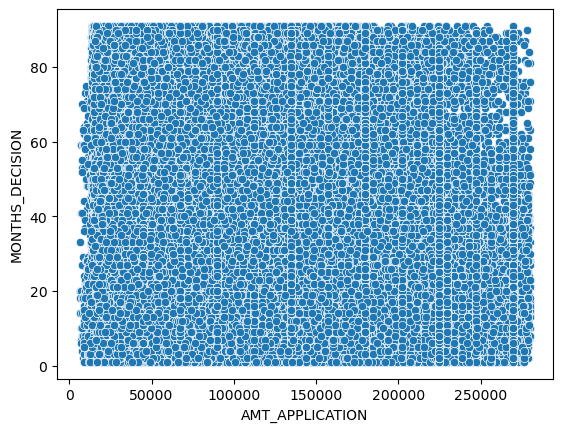

In [1656]:
sns.scatterplot(data=combined_application_df1,x='AMT_APPLICATION',y='MONTHS_DECISION')

In [ ]:
# from above scatter plot we can se that there is no significant relation betwwn months taken for application decision an AMT _APPLICATION

In [1657]:
combined_application_df1_categorical.columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO', 'CHANNEL_TYPE',
       'PRODUCT_COMBINATION', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'ORGANIZATION_TYPE', 'AGE_GROUP', 'INCOME_GROUP', 'CREDIT_GROUP'],
      dtype='object')

NAME_CONTRACT_TYPE


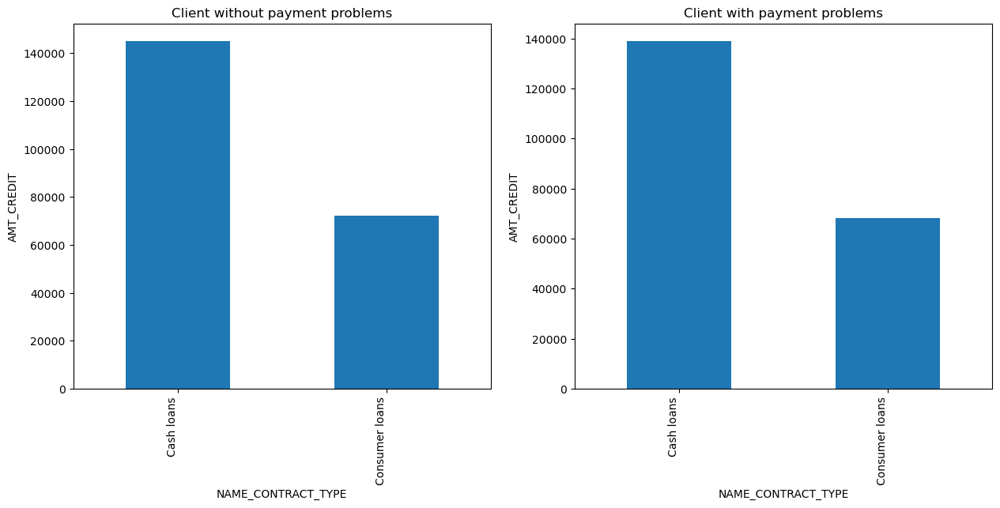

WEEKDAY_APPR_PROCESS_START


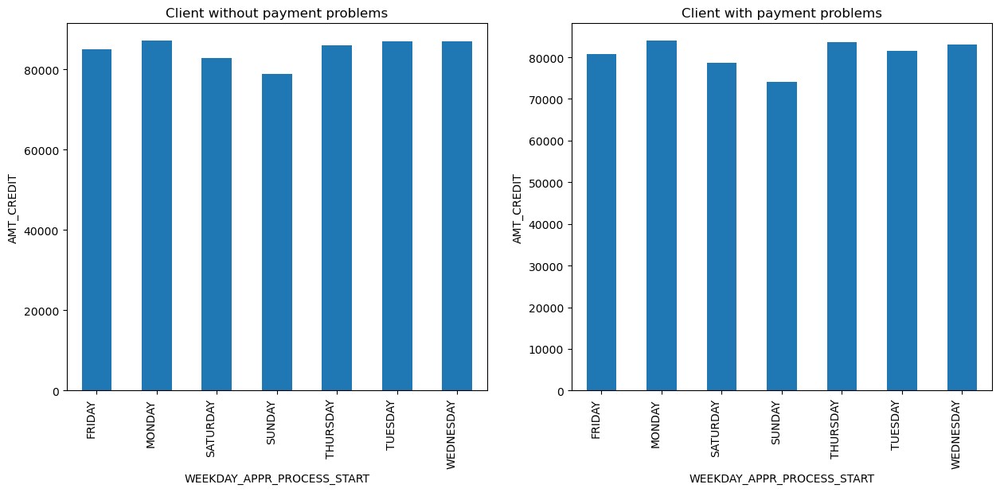

FLAG_LAST_APPL_PER_CONTRACT


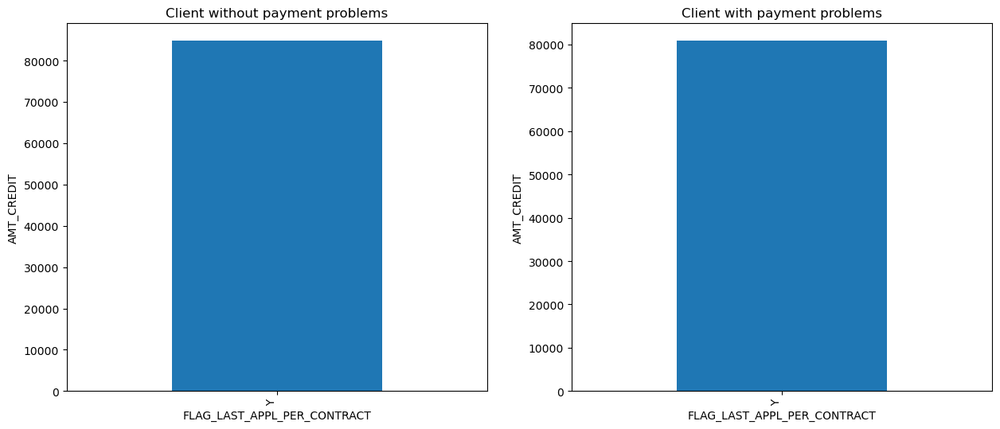

NAME_CONTRACT_STATUS


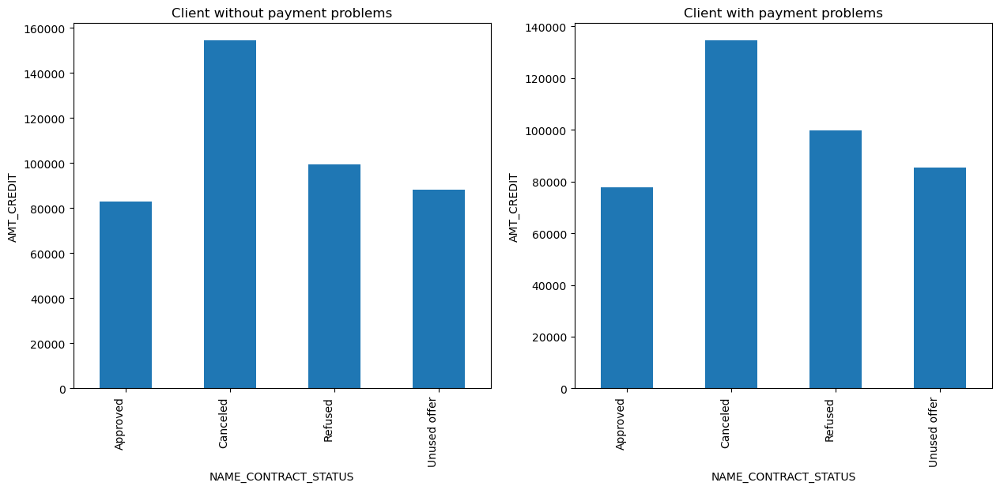

NAME_CLIENT_TYPE


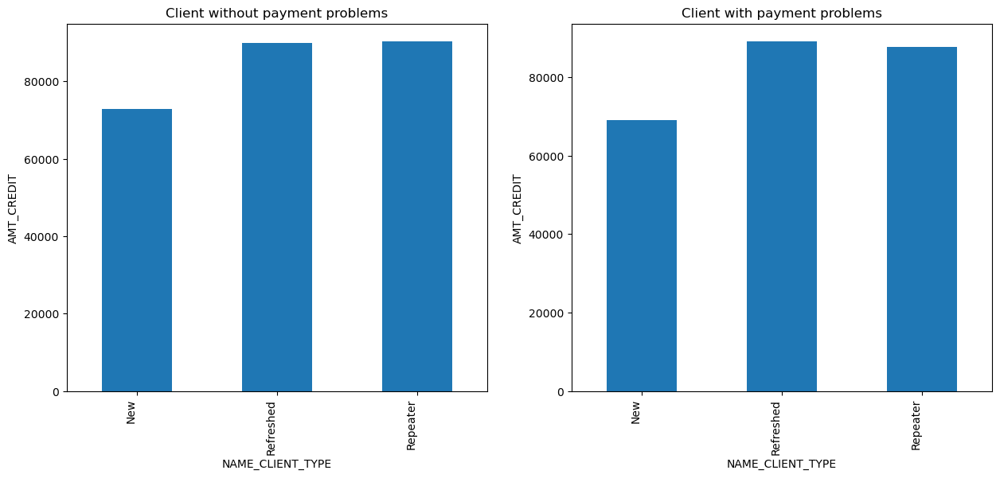

NAME_PORTFOLIO


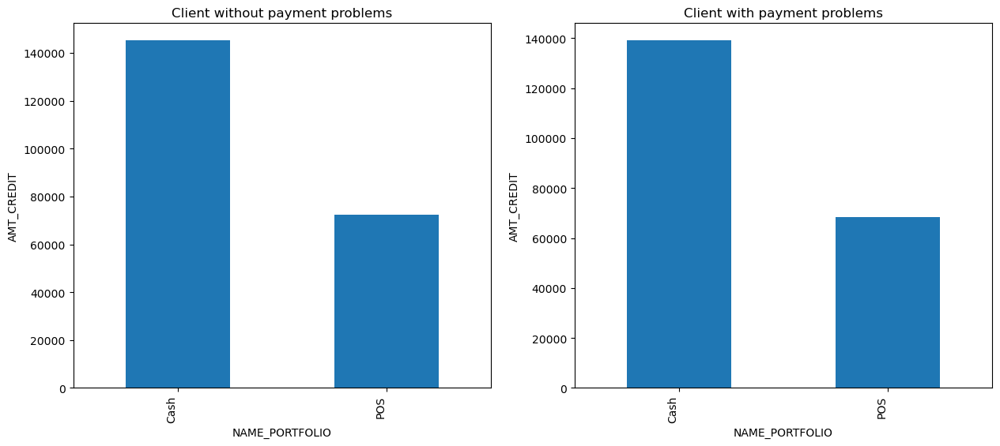

CHANNEL_TYPE


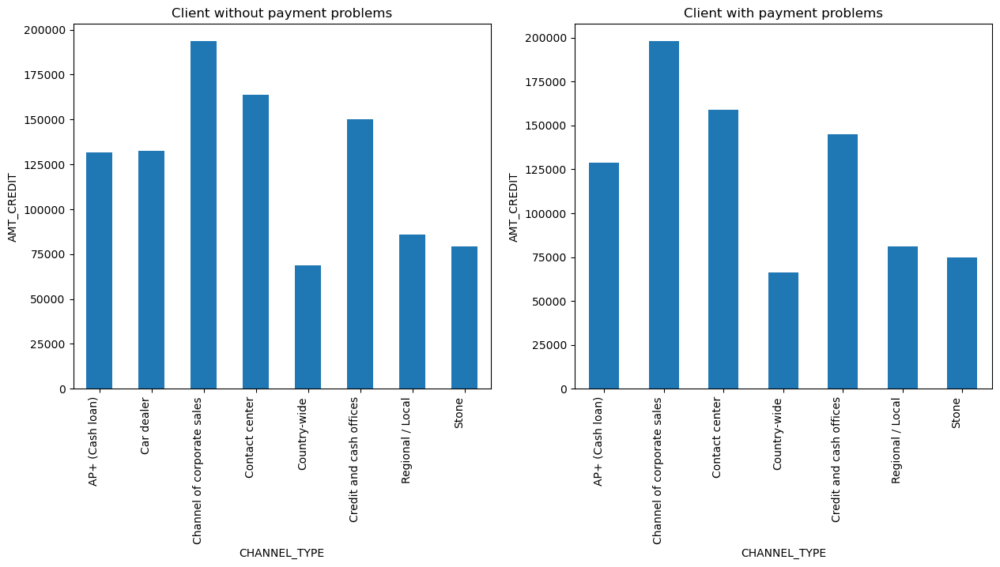

PRODUCT_COMBINATION


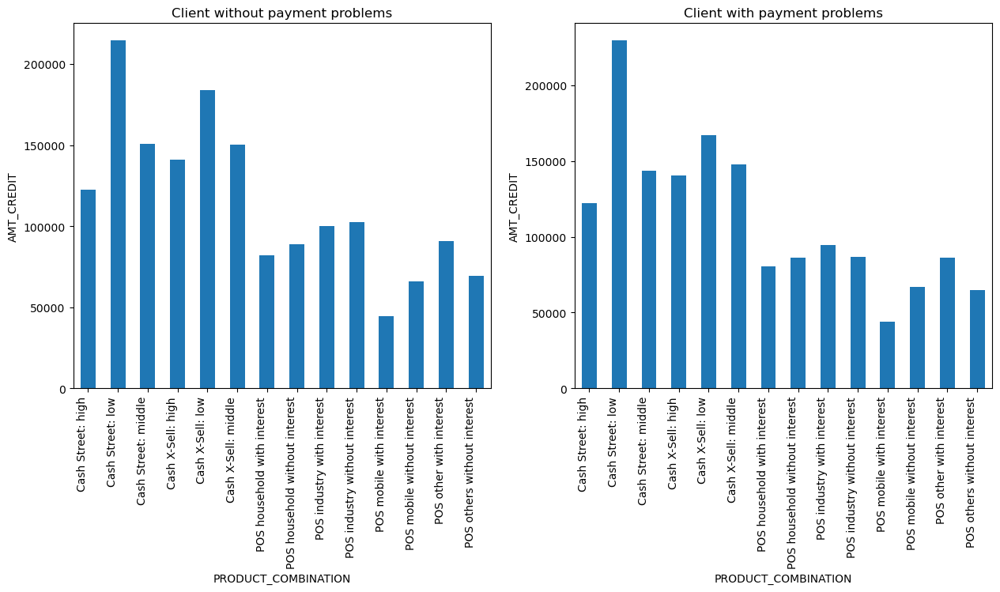

CODE_GENDER


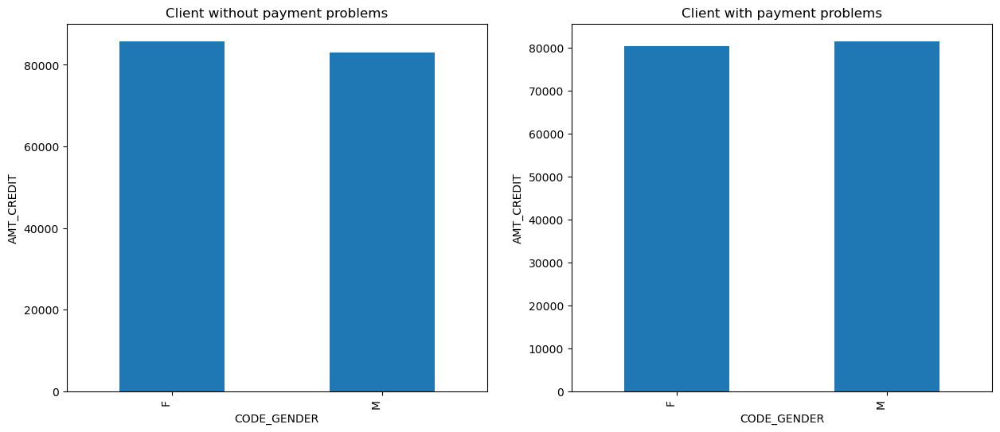

FLAG_OWN_CAR


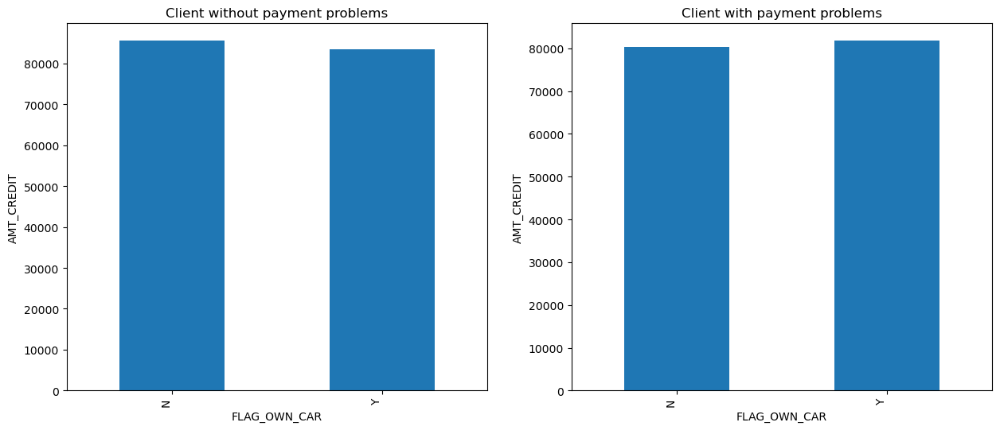

FLAG_OWN_REALTY


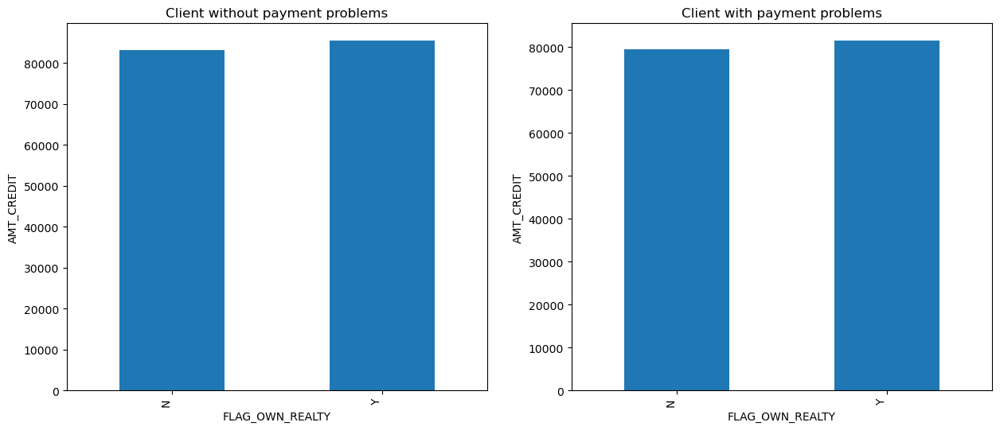

NAME_TYPE_SUITE


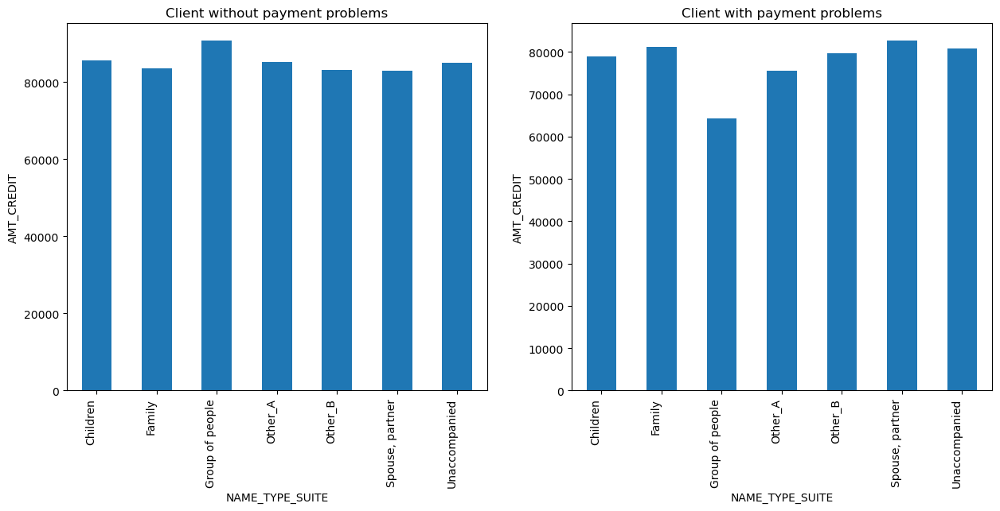

NAME_INCOME_TYPE


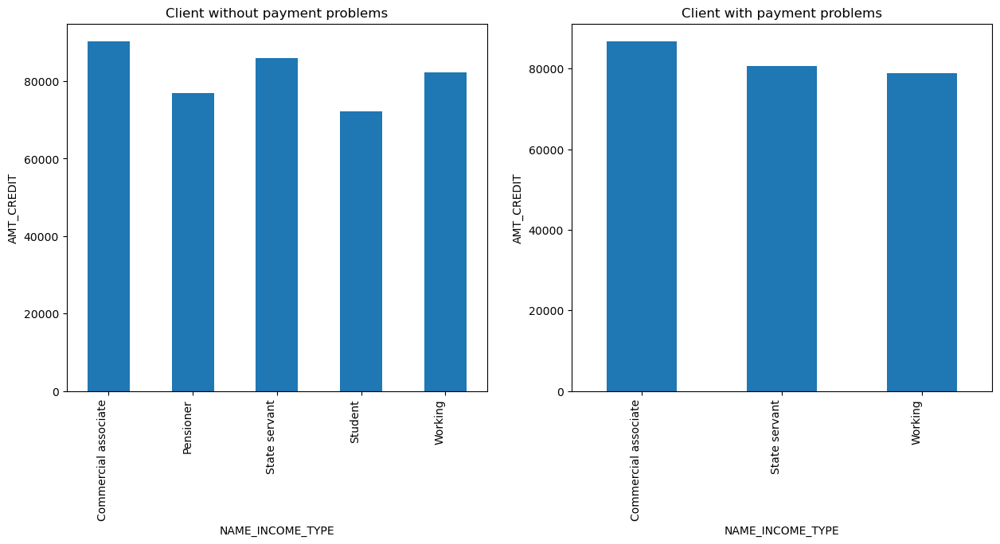

NAME_EDUCATION_TYPE


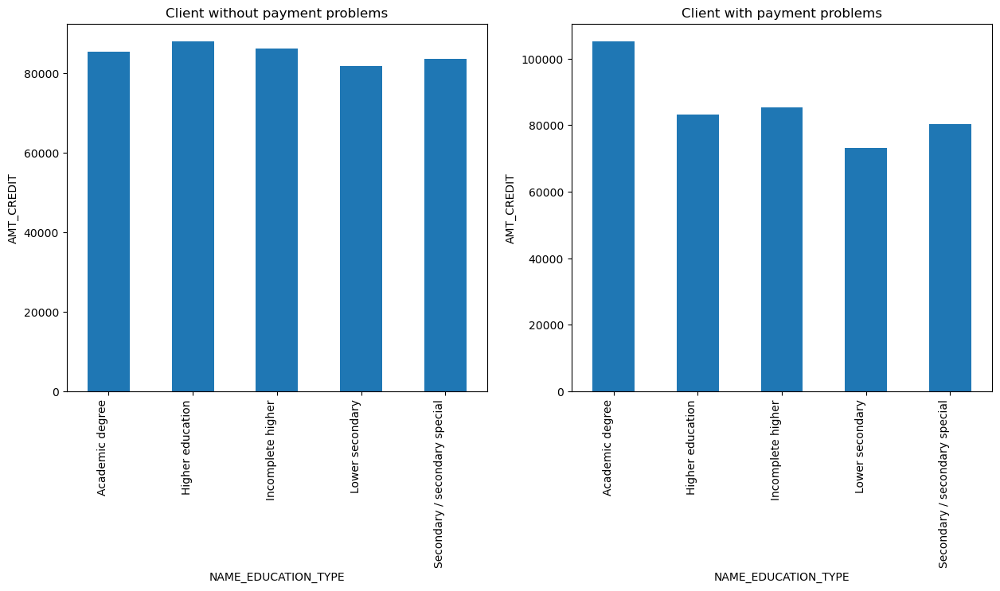

NAME_FAMILY_STATUS


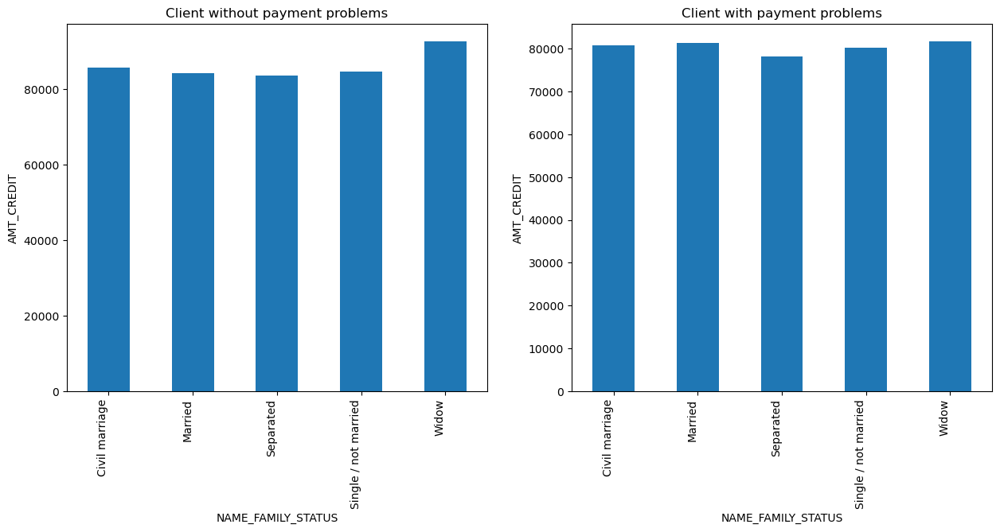

NAME_HOUSING_TYPE


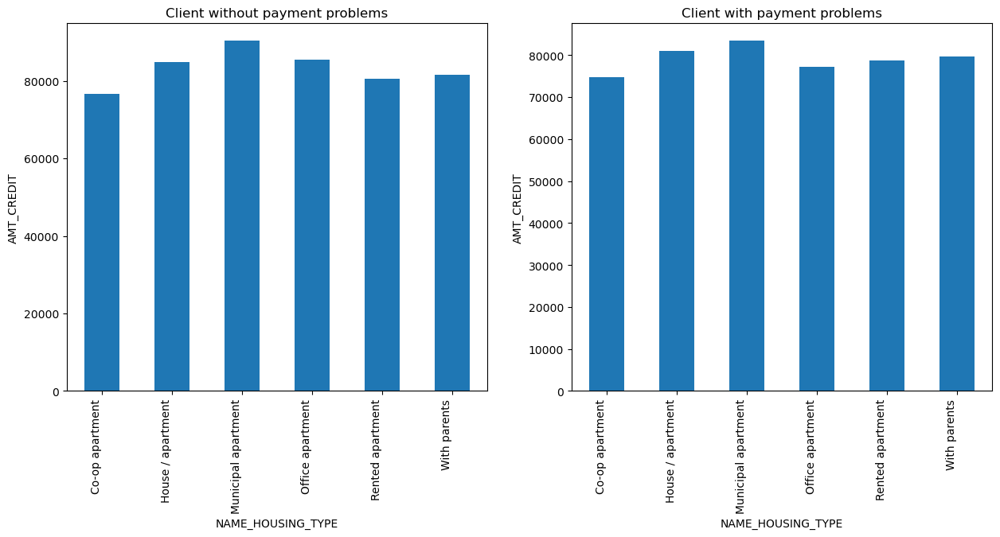

OCCUPATION_TYPE


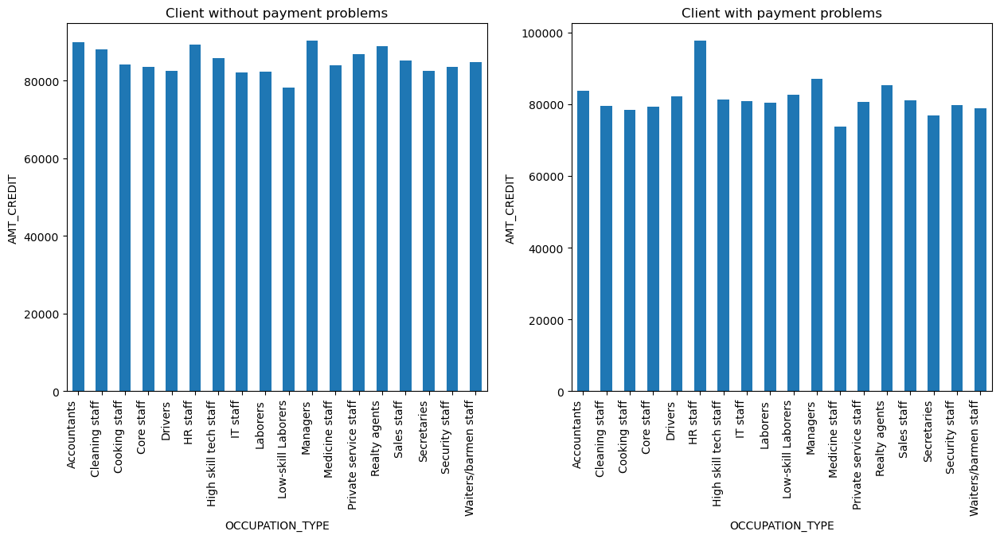

ORGANIZATION_TYPE


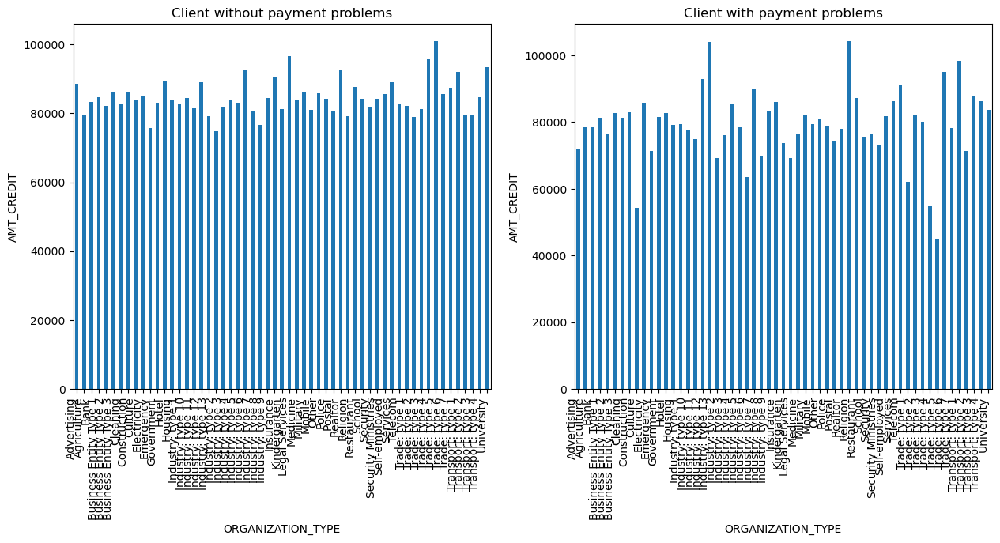

AGE_GROUP


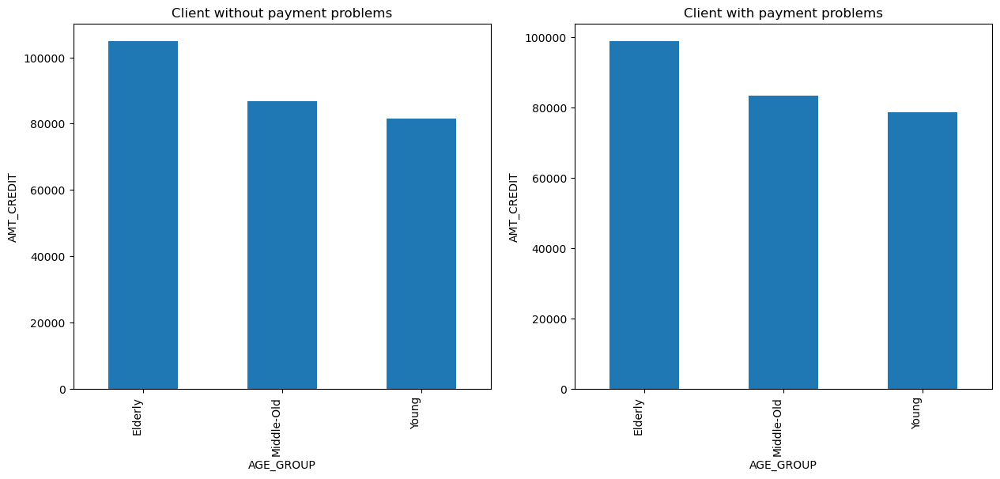

INCOME_GROUP


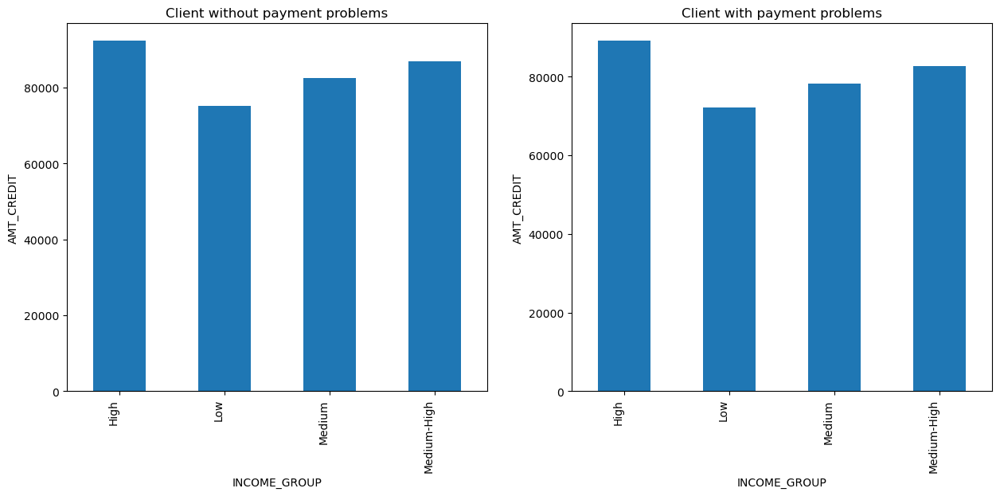

CREDIT_GROUP


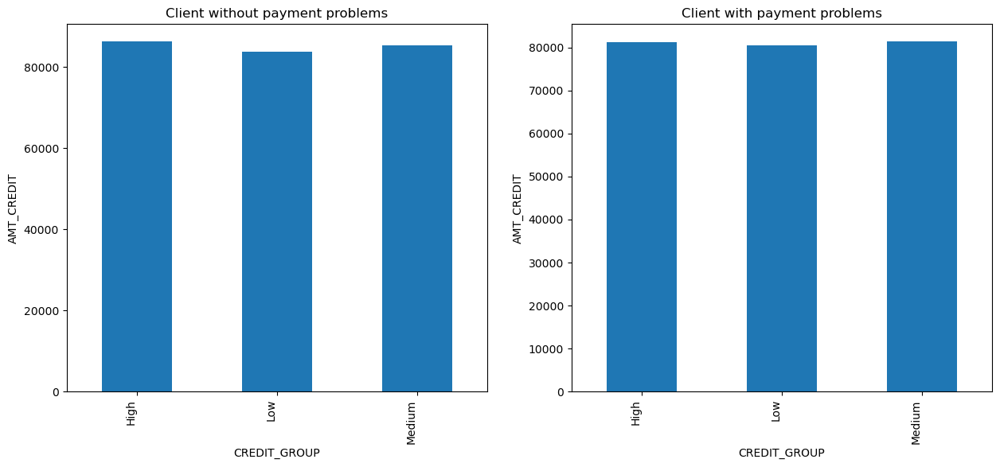

In [1658]:
check_bivariate_barplot(combined_application_df1_target0,combined_application_df1_target1,['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO', 'CHANNEL_TYPE',
       'PRODUCT_COMBINATION', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'ORGANIZATION_TYPE', 'AGE_GROUP', 'INCOME_GROUP', 'CREDIT_GROUP'],'AMT_CREDIT')

NAME_CONTRACT_TYPE


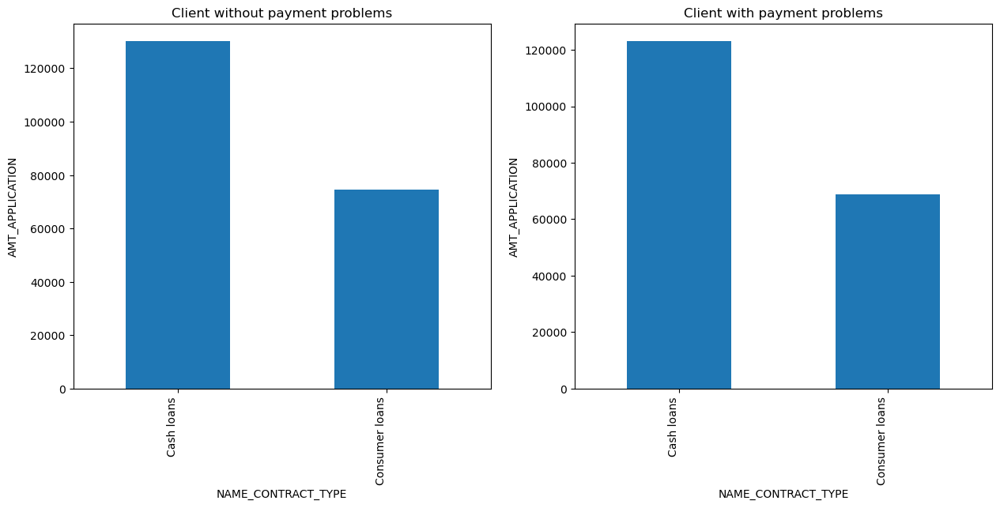

WEEKDAY_APPR_PROCESS_START


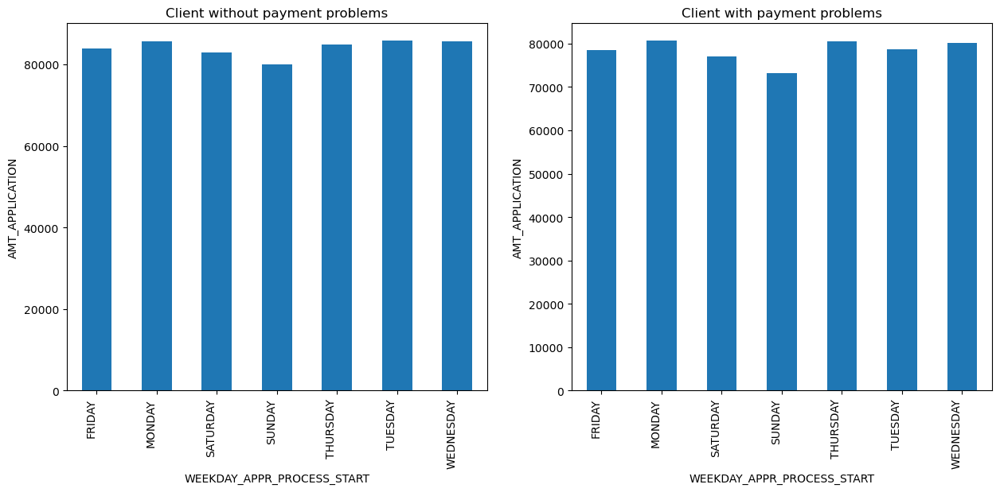

FLAG_LAST_APPL_PER_CONTRACT


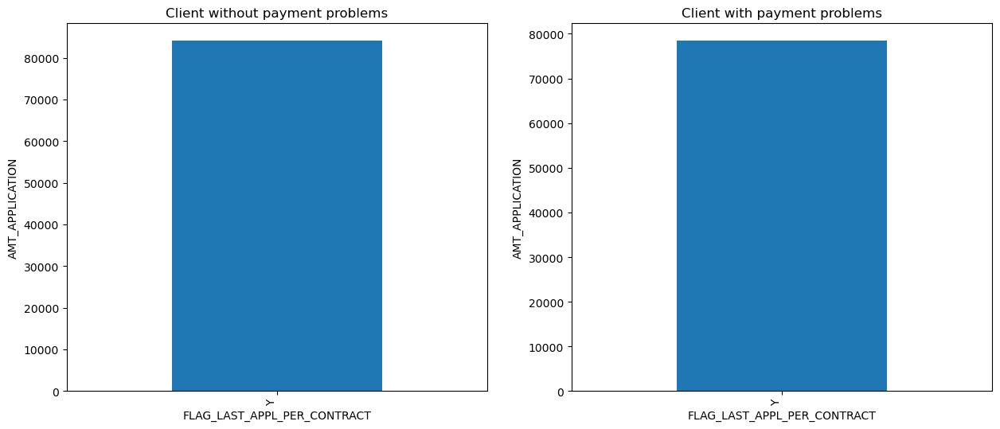

NAME_CONTRACT_STATUS


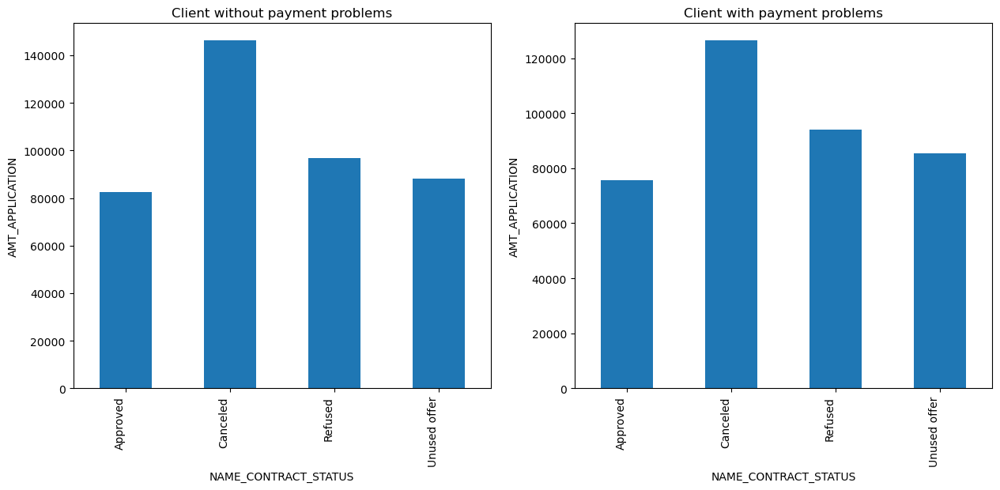

NAME_CLIENT_TYPE


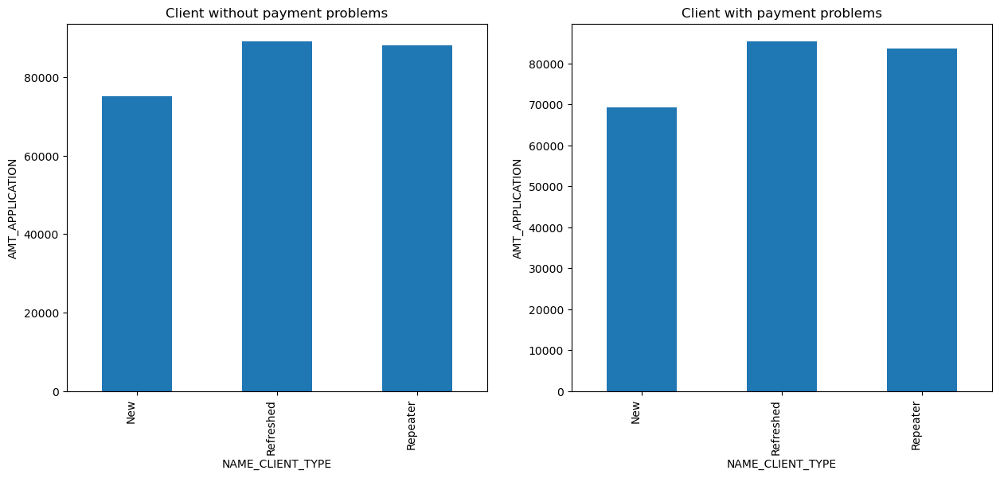

NAME_PORTFOLIO


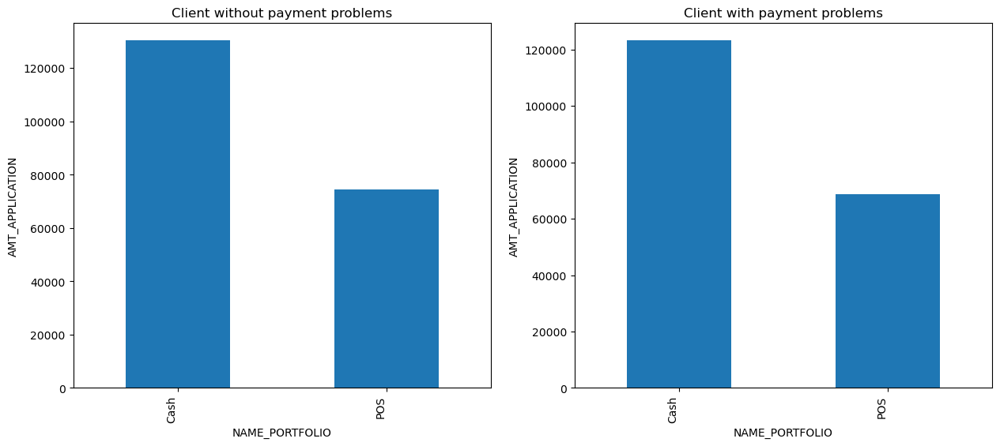

CHANNEL_TYPE


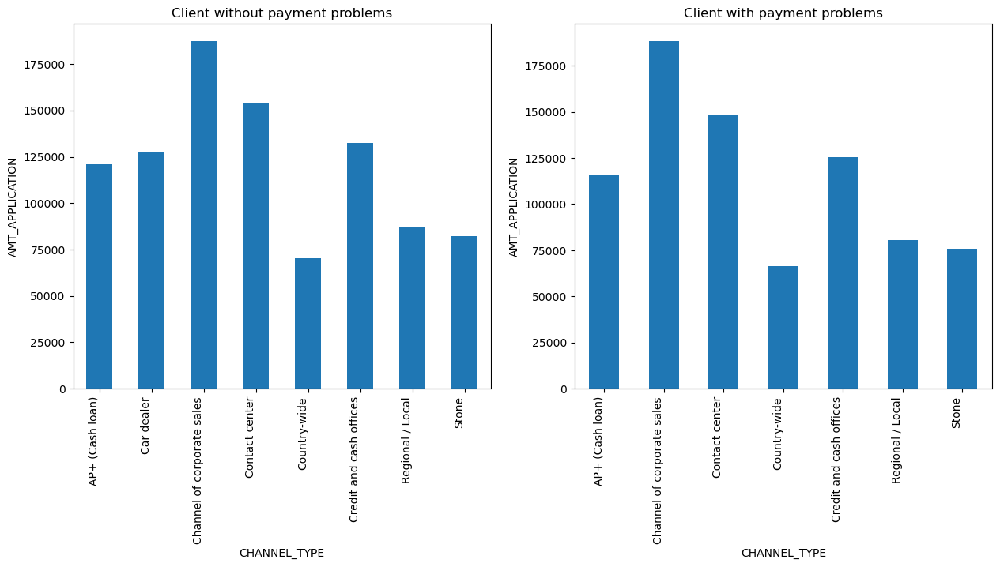

PRODUCT_COMBINATION


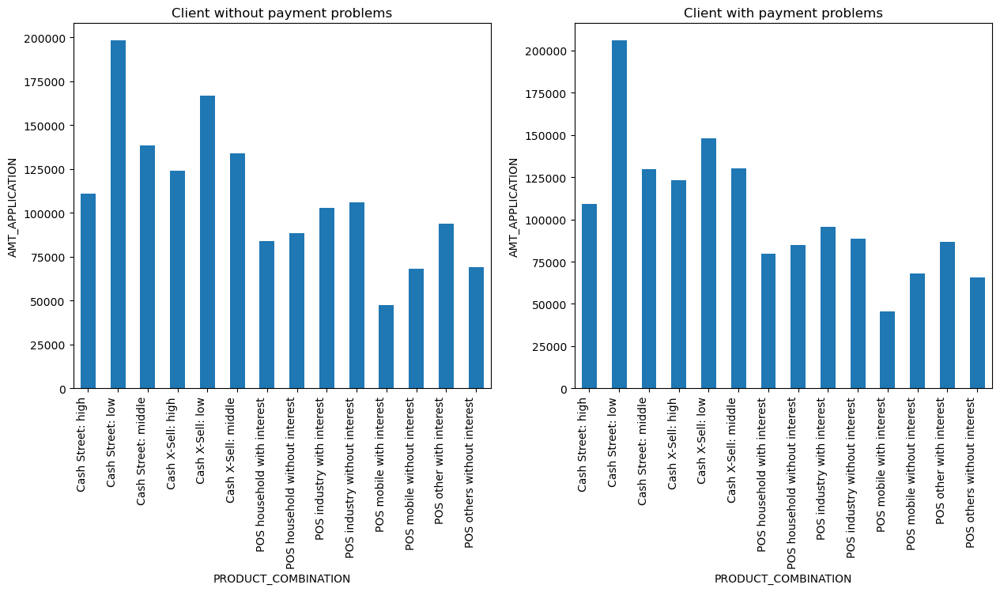

CODE_GENDER


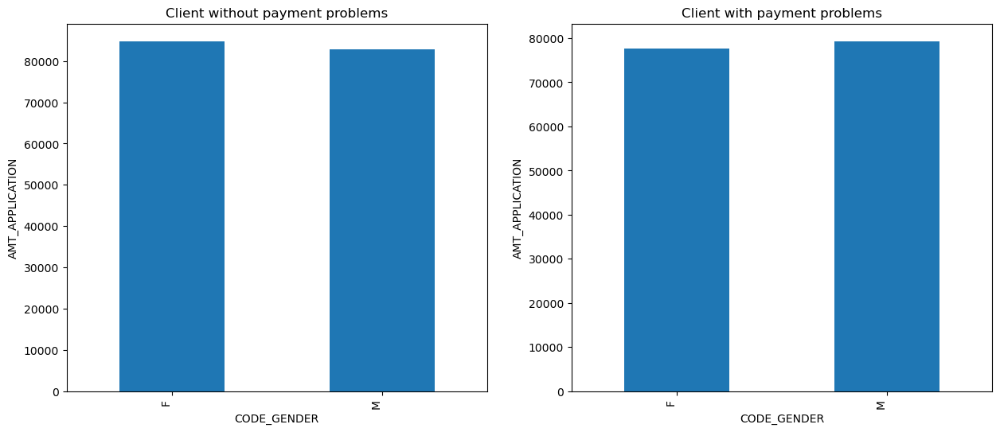

FLAG_OWN_CAR


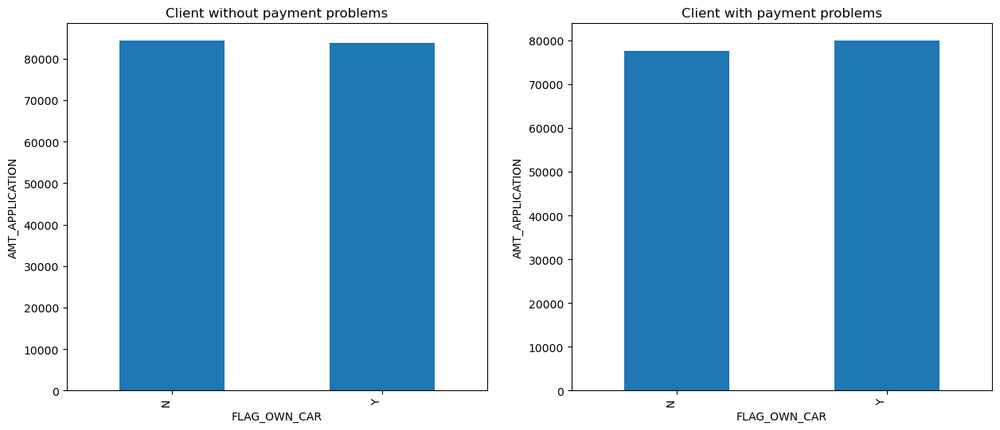

FLAG_OWN_REALTY


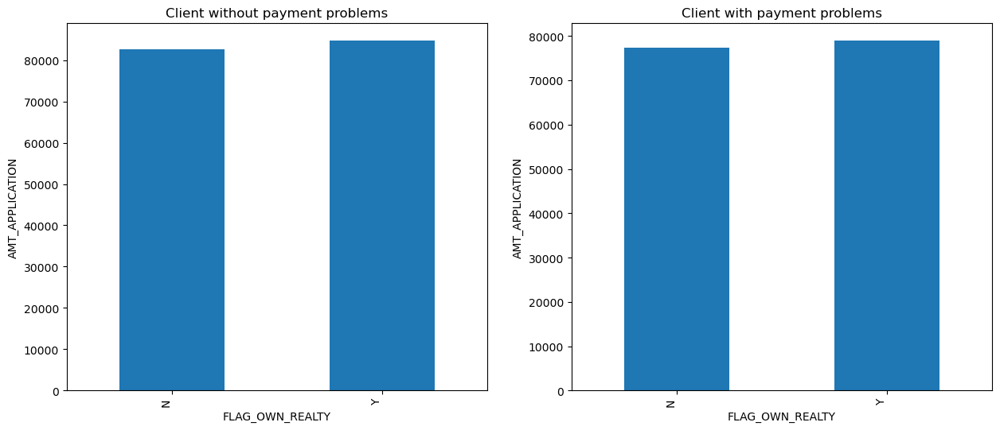

NAME_TYPE_SUITE


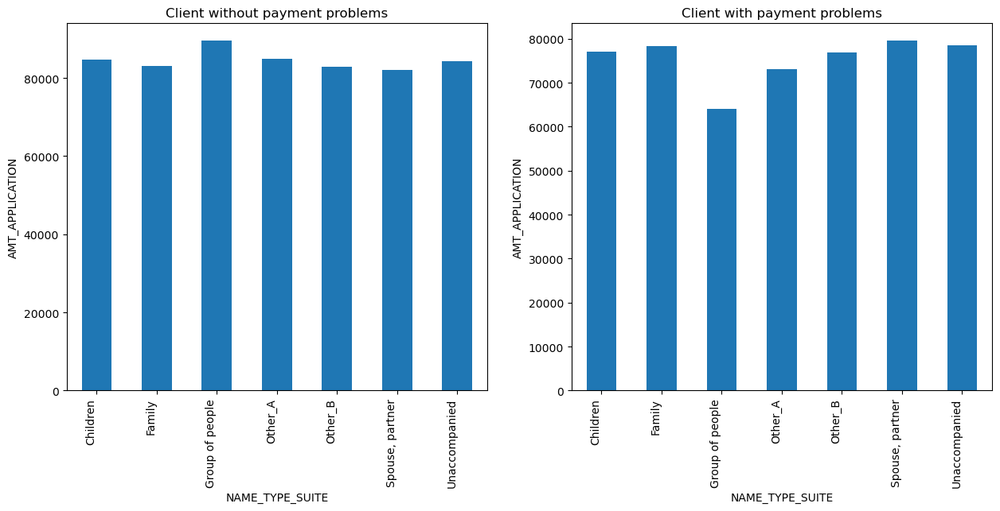

NAME_INCOME_TYPE


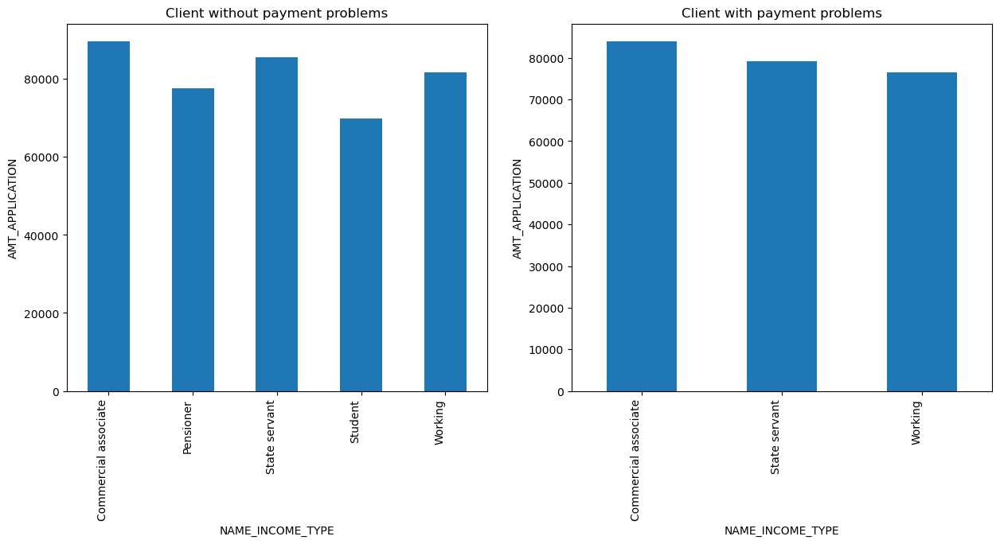

NAME_EDUCATION_TYPE


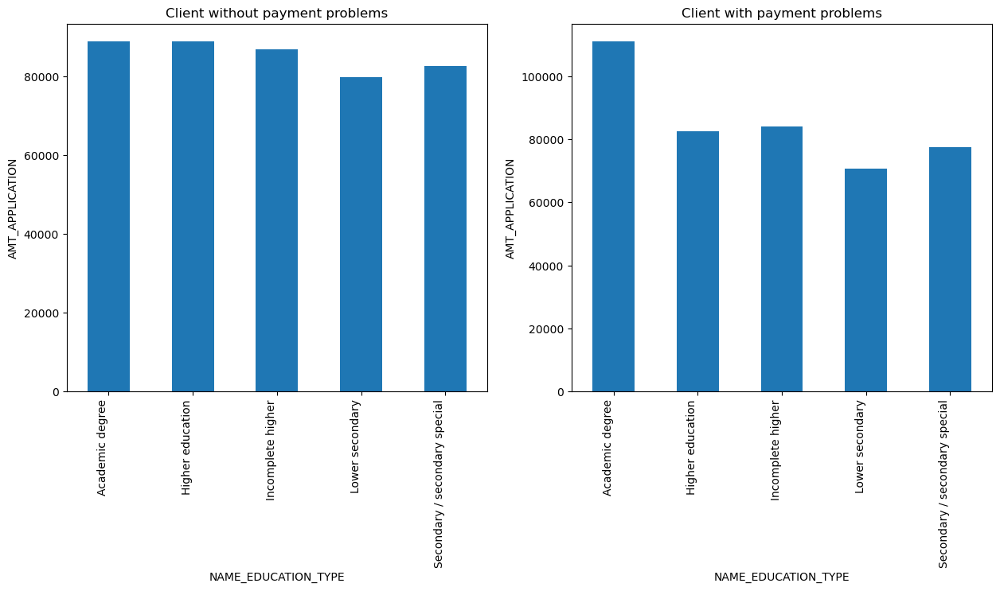

NAME_FAMILY_STATUS


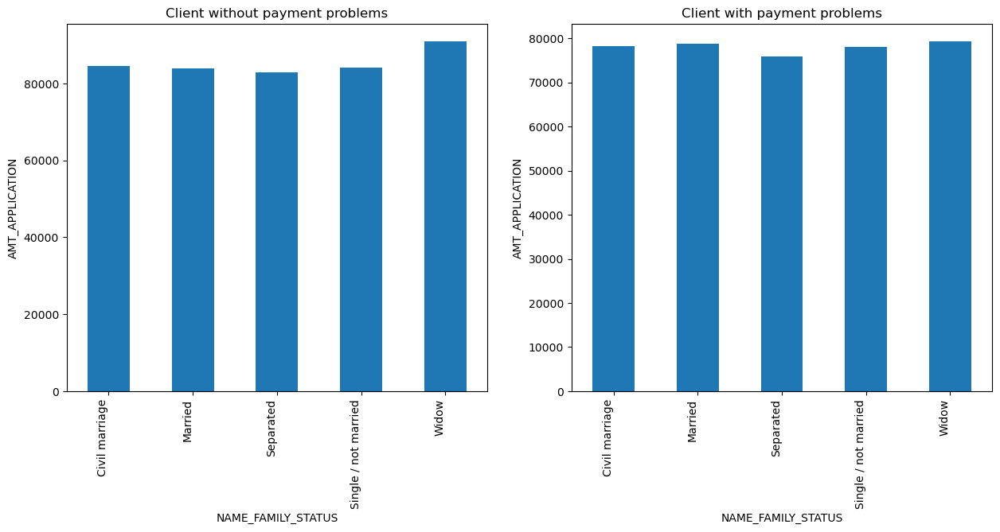

NAME_HOUSING_TYPE


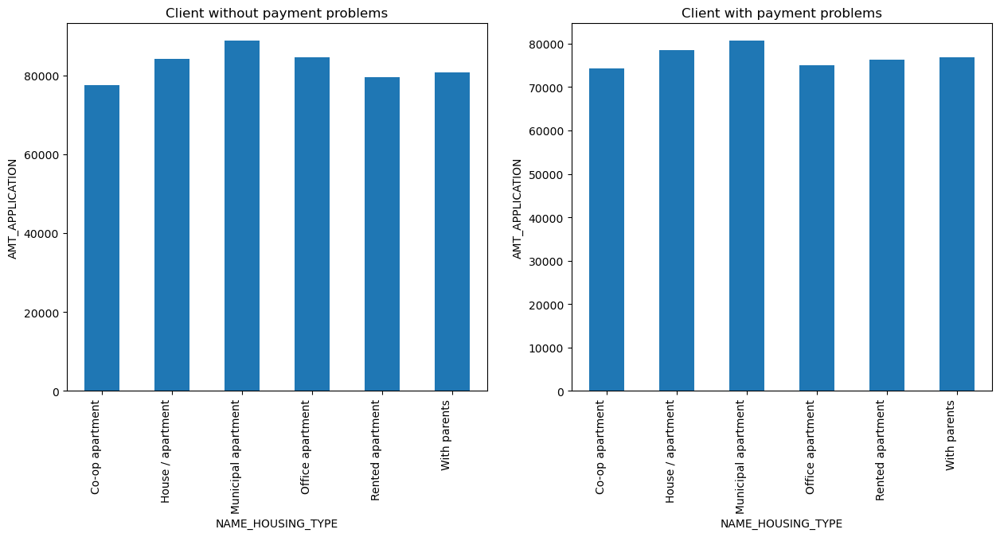

OCCUPATION_TYPE


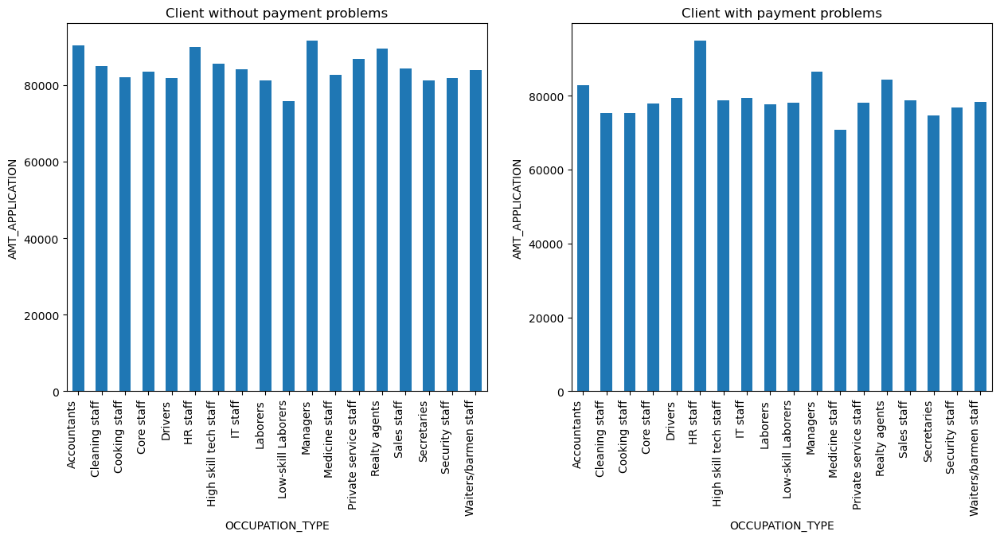

ORGANIZATION_TYPE


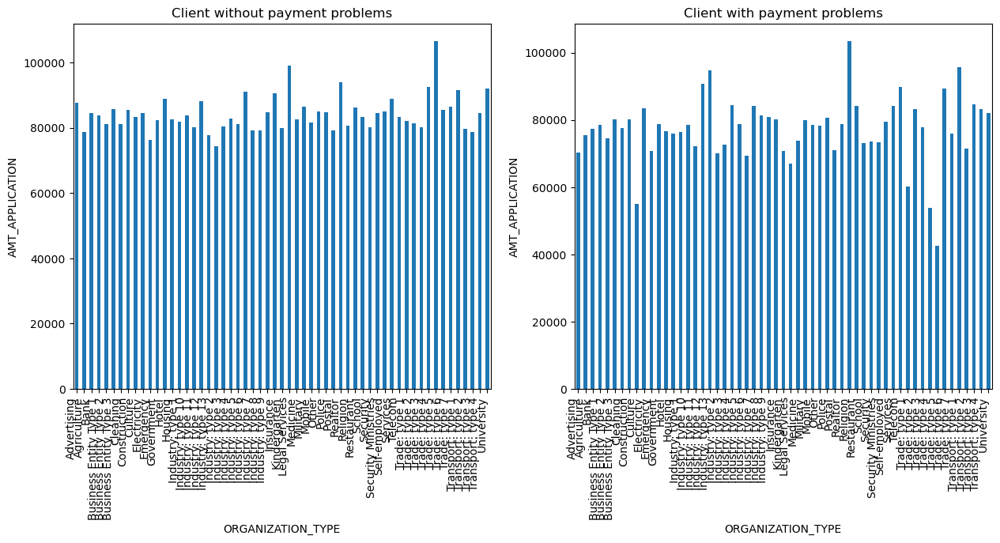

AGE_GROUP


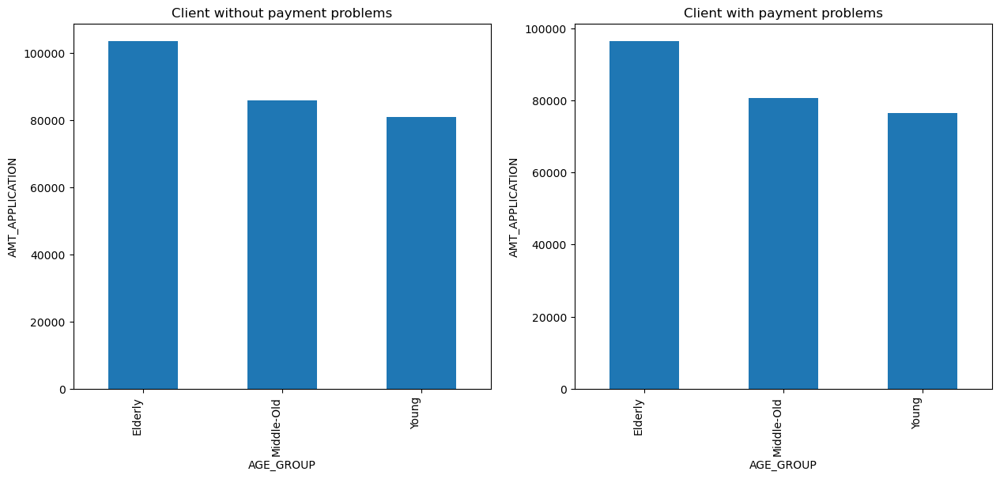

INCOME_GROUP


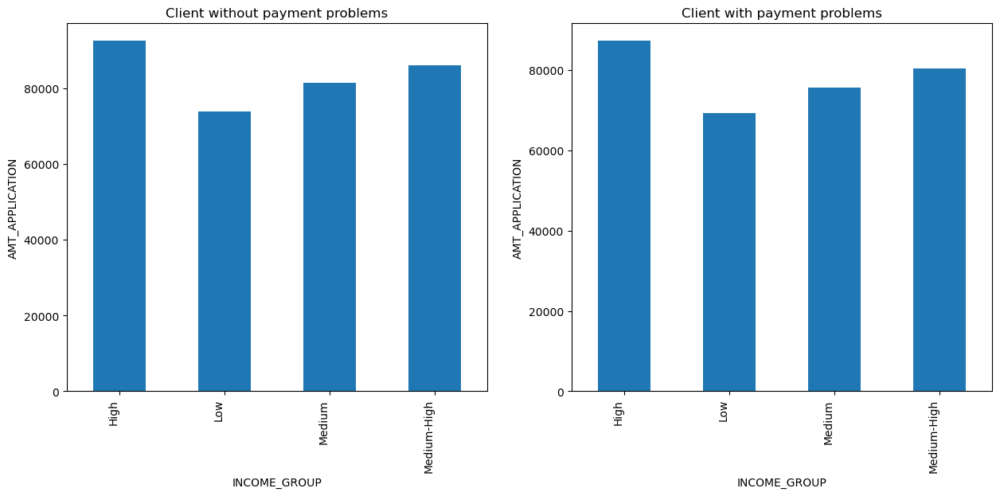

CREDIT_GROUP


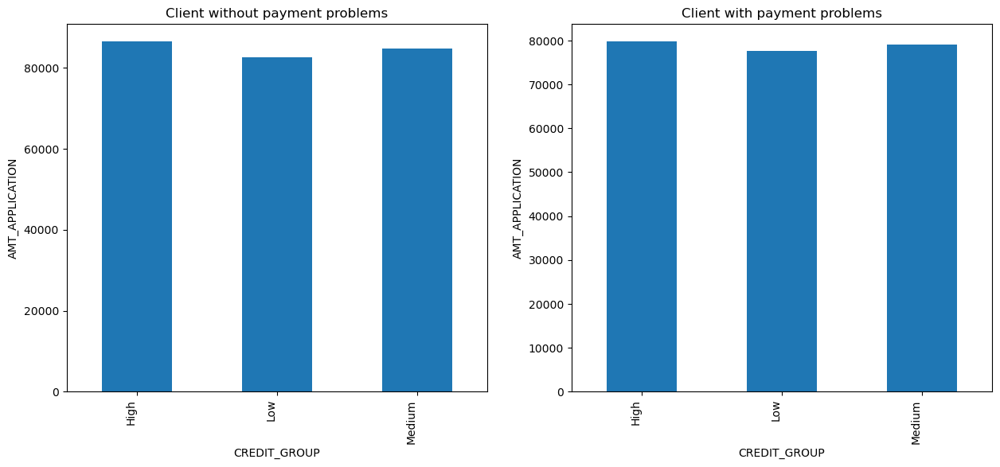

In [1659]:
check_bivariate_barplot(combined_application_df1_target0,combined_application_df1_target1,['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CONTRACT_STATUS',
       'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO', 'CHANNEL_TYPE',
       'PRODUCT_COMBINATION', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'ORGANIZATION_TYPE', 'AGE_GROUP', 'INCOME_GROUP', 'CREDIT_GROUP'],'AMT_APPLICATION')

In [ ]:
#from the above 2 cells of plot we understand:
# 1. credit amount,application amount is low for both target clients having consumer loan contract type than cash loans 
# 2. credit amount,application amount is low for both target clients having POS name portfolio type than cash portfolio
# 3. Repeater and refreshed clients get more credit amount than new  clients.
# 4. Cancelled contract staus clients have more application amount and credit amount

Text(0, 0.5, 'TARGET')

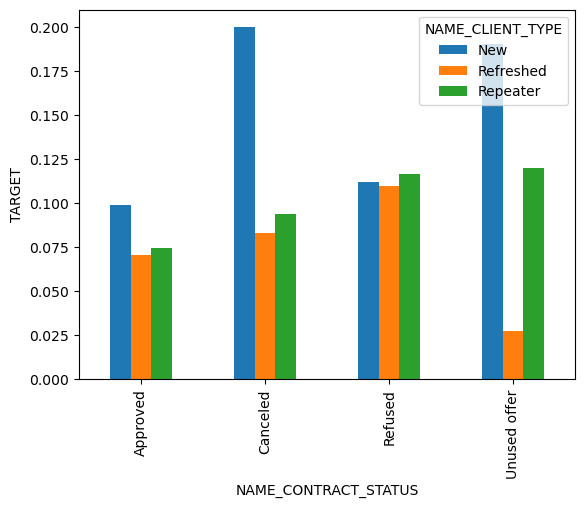

In [1660]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='NAME_CLIENT_TYPE',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('TARGET')

In [ ]:
# from above plot we can see that the new client type has the most payment diificulties in all contract status groups

Text(0, 0.5, 'TARGET')

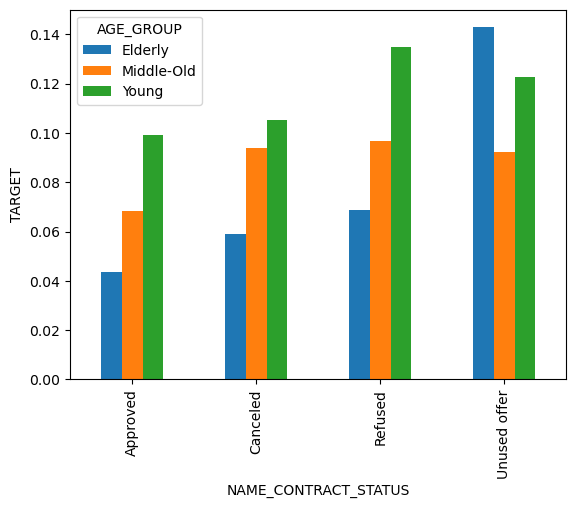

In [1663]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='AGE_GROUP',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('TARGET')

In [ ]:
# from above plot we can see that the client in young age group will have payment difficulties the most in all contract status groups except in unused offer when elderly client group has the most payment difficulty

Text(0, 0.5, 'TARGET')

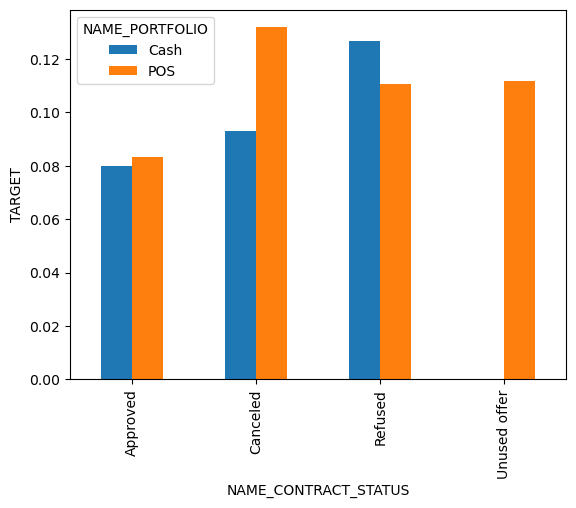

In [1664]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='NAME_PORTFOLIO',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('TARGET')

In [ ]:
# from above plot we can see that the client in young age group will have payment difficulties the most in all contract status groups except in unused offer when elderly client group has the most payment difficulty

Text(0, 0.5, 'TARGET')

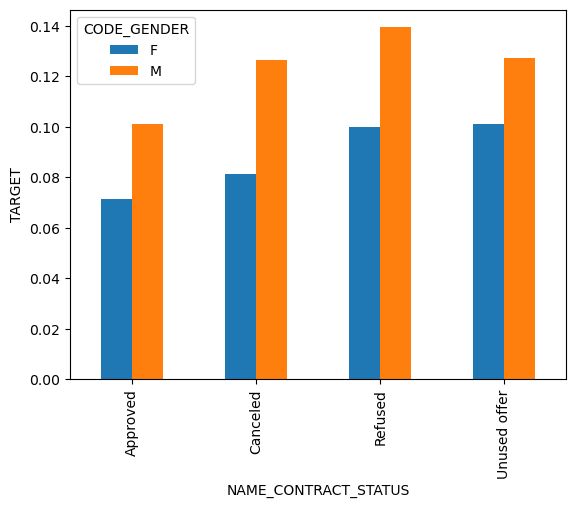

In [1665]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='CODE_GENDER',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('TARGET')

In [ ]:
# from above plot we can see that the male client  in all contract statuus groups have the most difficulties in payment

Text(0, 0.5, 'TARGET')

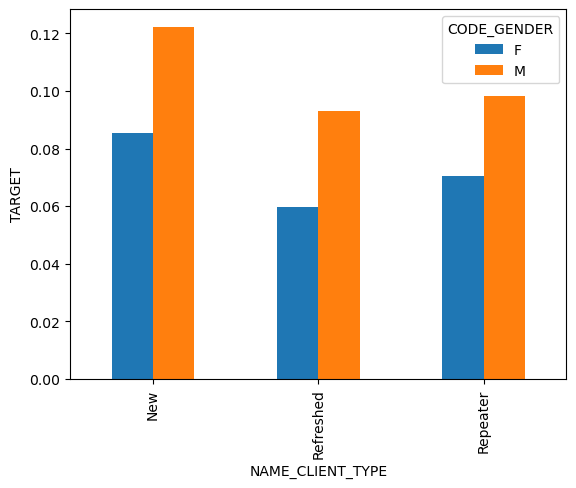

In [1666]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CLIENT_TYPE',columns='CODE_GENDER',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CLIENT_TYPE')
plt.ylabel('TARGET')


In [ ]:
# from above plot we can see that the male client  in all client type groups have the most difficulties in payment

Text(0, 0.5, 'TARGET')

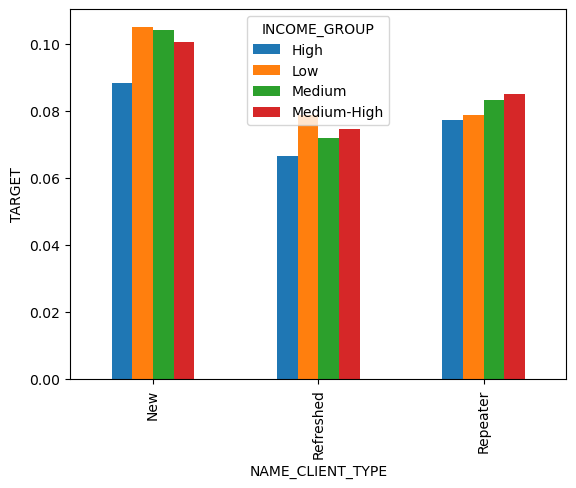

In [1667]:
combined_application_df1.pivot_table(values='TARGET',index='NAME_CLIENT_TYPE',columns='INCOME_GROUP',aggfunc='mean').plot.bar()
plt.xlabel('NAME_CLIENT_TYPE')
plt.ylabel('TARGET')

In [ ]:
# from above plot we can see that the high income clients in all client type groups have the least difficulties in payment